## Import

In [1]:
!pwd

/home/cccr/roxy/panini/JGRJDM_SNU/MJO_composite_clean/jgrjdm_clean/jgrjdm_manuscript


In [2]:
import xarray as xr
import numpy as np
import matplotlib.pyplot as plt
import matplotlib
import glob
from tqdm.notebook import tqdm
import pandas as pd
import filt_all as fa
from cartopy.mpl.ticker import LongitudeFormatter, LatitudeFormatter
import matplotlib.pyplot as plt
import nclcmaps
import cartopy.crs as ccrs
from tqdm.notebook import tqdm
plt.style.use(['science','notebook'])
import warnings
import gsw
warnings.filterwarnings('ignore', category=UserWarning)

## Anom calculation function

In [3]:
import marineHeatWaves as mhw
from datetime import date
import numpy as np
import scipy as sc
import xarray as xr
import multiprocessing
from functools import partial

# t = np.arange(date(1982,1,1).toordinal(),date(2021,12,31).toordinal()+1)


def parallel_apply_along_axis(func1d,axis, arr, processes,*args, **kwargs):
    
    """
    Like numpy.apply_along_axis(), but takes advantage of multiple cores.
    Adapted from `here <https://stackoverflow.com/questions/45526700/
    easy-parallelization-of-numpy-apply-along-axis
    """        

    dims            =      np.arange(arr.ndim)[np.arange(arr.ndim)!=axis]        ## finding the dim  
    dim_len         =      np.array([np.size(arr,i) for i in dims])              ## which should be splitted into chunks 
    effective_axis  =      dims[dim_len==np.max(dim_len)][0]                     ## effective_axis for splittiing into chunks 
    chunks          =      np.array_split(arr, processes,effective_axis)          ## chunks
#     print(np.shape[i] for i in chunks)
    pool   = multiprocessing.Pool(processes=processes)                           ## embarassing parallel
    func1d  = func1d                                                             ## use of partial for passing other kwargs
    axis   = axis
    func   = partial(apply_on_chunck,func1d, axis,*args,**kwargs)
    individual_results = pool.map(func, chunks)
    pool.close()
    pool.join()

    return np.concatenate(individual_results,effective_axis)

def apply_on_chunck(func1d,axis,arr,*args,**kwargs):                                   ## function applied on chunks seprately
#     print(arr.shape,axis)
    return np.apply_along_axis(func1d,axis,arr,*args,**kwargs)  ## use of numpy along axis

def calc_anom(sst,t):
    if np.all(np.isnan(sst)):
        return sst
    else:
        mhws, clim = mhw.detect(t, sst)
        return sst-clim['seas']

def calc_mhws_anom(sst,t):
    if np.all(np.isnan(sst)):
        return sst
    else:
        mhws, clim = mhw.detect(t, sst)
        anom = sst-clim['seas']   
        df = pd.DataFrame(mhws)
        nn = np.zeros(len(t));nn.fill(np.nan)
        nn = pd.DataFrame(nn, index=t)
        for i in range(len(df)):
            nn.loc[df.iloc[i,0]:df.iloc[i,1]] = 1.0
    return anom*nn.values.squeeze()       
    
def calc_clim(sst,t):
    if np.all(np.isnan(sst)):
        return sst
    else:
        mhws, clim = mhw.detect(t, sst)
        return clim['seas']

def xr_anom_clim(AA,t,varname,return_var='anom',processes=8,opt=1):
    AA1 = AA.copy()
    if  return_var=='clim':
        BB =parallel_apply_along_axis(calc_clim,axis=0,arr=AA1.values,processes=processes,t=t)
    elif return_var=='anom':
        BB =parallel_apply_along_axis(calc_anom,axis=0,arr=AA1.values,processes=processes,t=t)
    elif return_var=='mhws_anom':
        BB =parallel_apply_along_axis(calc_mhws_anom,axis=0,arr=AA1.values,processes=processes,t=t)
    else:
        raise ValueError('Please enter correct output name')
        
    if opt:
        anom = xr.Dataset({varname: (('time', 'lat','lon'), BB)}, coords={'time': AA1.time,'lat': AA1.lat,'lon': AA1.lon})
    else:
        anom = xr.Dataset({varname: (('time','level', 'lat','lon'), BB)}, coords={'time': AA1.time,'level':AA1.level,'lat': AA1.lat,'lon': AA1.lon})

    return anom## return xarray


## READ SST, SST_tency, SALINITY, QNET, MLD

In [4]:
mhws_sst_anom = xr.open_dataset('../../sst_mhws_anom_SKP_1982-2021_new.nc')
sst_hycom_anom=xr.open_dataset('../rg_hycom_SST_anom.nc')
sss_hycom_anom=xr.open_dataset('../rg_hycom_SSS_anom.nc')

In [5]:
%store -r precip_filt 
%store -r olr_filt 

In [6]:
sst = xr.open_dataset('/scratch/cccr/roxy/panini/DATA/sst/oisst/oisst_v2_1981-2022.nc')

In [7]:
sst1 = sst.sel(lon=slice(80,160),lat=slice(0,60),time=slice('1994-01-01','2015-12-31'))

In [8]:
## SST tendency,qnet and MLD
sss_hycom     = xr.open_dataset('../rg_hycom_SSS.nc')
sst_hycom     = xr.open_dataset('../rg_hycom_SST.nc')
sst_tendency  = xr.open_dataset('../../../ocean_budget_analysis/HB_Panini_hycom/test2/CT_AS/terms100/LHS2_all.nc')
qnet          = xr.open_dataset('../../../ocean_budget_analysis/HB_Panini_hycom/test2/CT_AS/terms100/RHS1_all.nc')
qsw           = xr.open_dataset('../../../ocean_budget_analysis/HB_Panini_hycom/test2/CT_AS/terms100/RHS10_all.nc')
qlw           = xr.open_dataset('../../../ocean_budget_analysis/HB_Panini_hycom/test2/CT_AS/terms100/RHS11_all.nc')
qsh           = xr.open_dataset('../../../ocean_budget_analysis/HB_Panini_hycom/test2/CT_AS/terms100/RHS12_all.nc')
qlh           = xr.open_dataset('../../../ocean_budget_analysis/HB_Panini_hycom/test2/CT_AS/terms100/RHS13_all.nc')
qbml           = xr.open_dataset('../../../ocean_budget_analysis/HB_Panini_hycom/test2/CT_AS/terms100/RHS14_1_all.nc')

adv           = xr.open_dataset('../../../ocean_budget_analysis/HB_Panini_hycom/test2/CT_AS/terms100/RHS2_all.nc')
ent1          = xr.open_dataset('../../../ocean_budget_analysis/HB_Panini_hycom/test2/CT_AS/terms100/RHS31_2.nc')
ent2          = xr.open_dataset('../../../ocean_budget_analysis/HB_Panini_hycom/test2/CT_AS/terms100/RHS32.nc')

diff          = xr.open_dataset('../../../ocean_budget_analysis/HB_Panini_hycom/test2/CT_AS/terms100/RHS4.nc')


mld           = xr.open_dataset('../../../ocean_budget_analysis/HB_Panini_hycom/test2/CT_AS/terms100/mld_all.nc')
mlt           = xr.open_dataset('../../../ocean_budget_analysis/HB_Panini_hycom/test2/CT_AS/terms200/mld_all.nc')
## Removing 0 MLD as NAN
mld['mld'].values[mld['mld'].values==0]=np.nan
mlt['mld'].values[mlt['mld'].values==0]=np.nan

In [9]:
## Heat Flux terms
fname_heatflux  = '/scratch/cccr/roxy/panini/DATA/hycom/surface_forcings/prep_data/hycom_HF_all_1994-2015.nc'
HF1     = xr.open_dataset(fname_heatflux)
HF1=HF1.rename({'latitude':'lat'})
HF1=HF1.rename({'longitude':'lon'})
HF1

<xarray.Dataset>
Dimensions:  (time: 8035, lat: 201, lon: 201)
Coordinates:
  * time     (time) datetime64[ns] 1994-01-01 1994-01-02 ... 2015-12-31
  * lat      (lat) float64 10.0 10.25 10.5 10.75 11.0 ... 59.25 59.5 59.75 60.0
  * lon      (lon) float64 110.0 110.2 110.5 110.8 ... 159.2 159.5 159.8 160.0
Data variables:
    slhf     (time, lat, lon) float64 ...
    ssr      (time, lat, lon) float64 ...
    str      (time, lat, lon) float64 ...
    sshf     (time, lat, lon) float64 ...

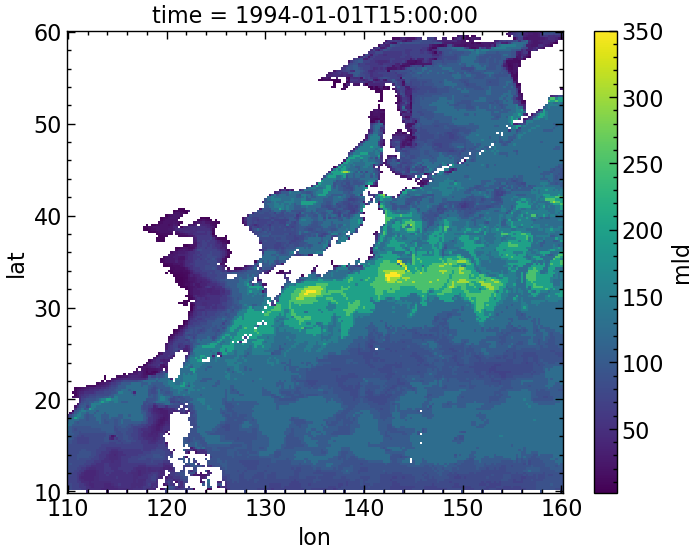

In [10]:
mld['mld'][0,:,:].plot()

## MHWs region mask

In [11]:
## MHW region mask
def maskmy_reg(sst1,var):
    sst2 = sst1[var].copy()
    sst2.values=sst1[var].values*np.nan
    lat_min = [29,35,34]
    lat_max = [35,37,38]
    lon_min = [119,119,127]
    lon_max = [131,127,136]  
#     lat_min = [29,34,34]
#     lat_max = [34,37,38]
#     lon_min = [115,115,127]
#     lon_max = [131,127,136]
    for i in range(2):
        lon_range = np.where((sst1.lon.values>=lon_min[i])&(sst1.lon.values<=lon_max[i]))[0]
        lat_range = np.where((sst1.lat.values>=lat_min[i])&(sst1.lat.values<=lat_max[i]))[0]
        sst2.values[:,lat_range[0]:lat_range[-1]+1,lon_range[0]:lon_range[-1]+1]=sst1[var].values[:,lat_range[0]:lat_range[-1]+1,lon_range[0]:lon_range[-1]+1]
    return sst2

def maskmy_reg2(sst1,var):
    sst2 = sst1[var].copy()
    sst2.values=sst1[var].values*np.nan
    lat_min = [29,35,34]
    lat_max = [35,37,38]
    lon_min = [119,119,127]
    lon_max = [131,127,136]
    for i in range(2):
        lon_range = np.where((sst1.lon.values>=lon_min[i])&(sst1.lon.values<=lon_max[i]))[0]
        lat_range = np.where((sst1.lat.values>=lat_min[i])&(sst1.lat.values<=lat_max[i]))[0]
        sst2.values[:,:,lat_range[0]:lat_range[-1]+1,lon_range[0]:lon_range[-1]+1]=sst1[var].values[:,:,lat_range[0]:lat_range[-1]+1,lon_range[0]:lon_range[-1]+1]
    return sst2

def maskmy_reg_pre(sst1,var):
    sst2 = sst1[var].copy()
    sst2.values=sst1[var].values*np.nan
    lat_min = [25,35,34]
    lat_max = [35,37,38]
    lon_min = [115,115,127]
    lon_max = [131,127,136]  
#     lat_min = [29,34,34]
#     lat_max = [34,37,38]
#     lon_min = [115,115,127]
#     lon_max = [131,127,136]
    for i in range(2):
        lon_range = np.where((sst1.lon.values>=lon_min[i])&(sst1.lon.values<=lon_max[i]))[0]
        lat_range = np.where((sst1.lat.values>=lat_min[i])&(sst1.lat.values<=lat_max[i]))[0]
        sst2.values[:,lat_range[0]:lat_range[-1]+1,lon_range[0]:lon_range[-1]+1]=sst1[var].values[:,lat_range[0]:lat_range[-1]+1,lon_range[0]:lon_range[-1]+1]
    return sst2



## T and S profiles

In [12]:
# t_all_xr.to_netcdf('t_all_xr_NECSYS.nc')
# s_all_xr.to_netcdf('s_all_xr_NECSYS.nc')
# r_all_xr.to_netcdf('r_all_xr_NECSYS.nc')
t_all_xr=xr.open_dataset('t_all_xr_NECSYS.nc')
s_all_xr=xr.open_dataset('s_all_xr_NECSYS.nc')
r_all_xr=xr.open_dataset('r_all_xr_NECSYS.nc')

## Masking other variables

In [13]:
## Region Mask OISST, HYCOM:  SST, SSS, Heat Flux terms,MLD, MLT
################################################################
sst_necs             = maskmy_reg(sst1,'sst')
sst_hycom_necs       = maskmy_reg(sst_hycom,'water_temp')
sss_hycom_necs       = maskmy_reg(sss_hycom,'salinity')
###############################################################
sst_ten_necs  = maskmy_reg(sst_tendency,'theta_t')
qnet_necs     = maskmy_reg(qnet,'qnet')
qsw_necs     = maskmy_reg(qsw,'qsw')
qlw_necs     = maskmy_reg(qlw,'qlw')
qsh_necs     = maskmy_reg(qsh,'qsh')
qlh_necs     = maskmy_reg(qlh,'qlh')
qbml_necs    = maskmy_reg(qbml,'q_bml')

adv_necs     = maskmy_reg(adv,'HADV')
ent1_necs     = maskmy_reg(ent1,'ENT')
ent2_necs     = maskmy_reg(ent2,'ENT')
diff_necs     = maskmy_reg(diff,'DIFU')
################################################################

mld_necs      = maskmy_reg(mld,'mld')
mlt_necs      = maskmy_reg(mlt,'mld')

In [14]:
## Region Mask original Heatfluxes
HF2=HF1.copy() ## create total HF
HF2['ssr'].values= HF1['ssr'].values+HF1['str'].values+HF1['sshf'].values+HF1['slhf'].values
############################################################################################
qsw_necs_actual     = maskmy_reg(HF1,'ssr')
qlw_necs_actual     = maskmy_reg(HF1,'str')
qsh_necs_actual     = maskmy_reg(HF1,'sshf')
qlh_necs_actual     = maskmy_reg(HF1,'slhf')
qnet_necs_actual    = maskmy_reg(HF2,'ssr')

In [15]:
# Region Mask Windspeed#########################################################################
fname_W = sorted(glob.glob('/scratch/cccr/roxy/panini/DATA/hycom/surface_forcings/prep_data/*_windspd.nc'))
wspd_all=[]
for yy in tqdm(range(len(fname_W))):
    wspd= xr.open_dataset(fname_W[yy])
    wspd=wspd.rename({'Latitude':'lat'})
    wspd=wspd.rename({'Longitude':'lon'})
    wspd_all.append(wspd)
wspd_all_xr = xr.concat(wspd_all,dim='time')
###############################################################################################
wspd_necs     = maskmy_reg(wspd_all_xr,'wndspd')

  0%|          | 0/22 [00:00<?, ?it/s]

In [16]:
### Region Mask Precipitation #######
precip_xr = xr.open_dataset('/scratch/cccr/roxy/panini/DATA/precip/CMAP/precip.daily.mean.nc')
precip_xr =precip_xr.sel(time=slice('1994-01-01','2015-12-31'))
precip_necs     = maskmy_reg_pre(precip_xr,'precip')

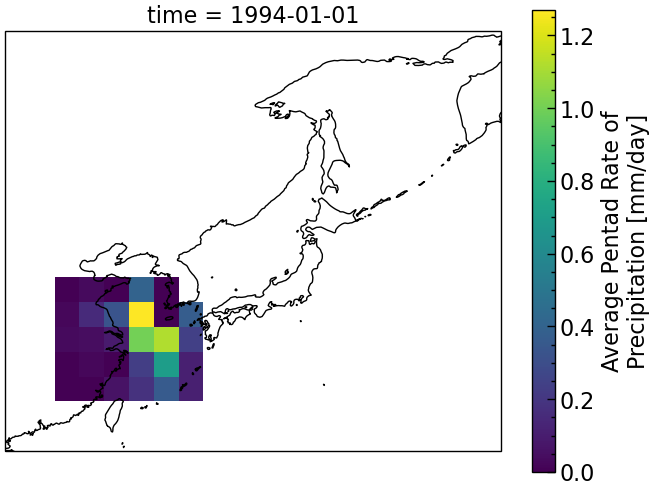

In [17]:
############################# plot BLT = MLT-MLD ####################################
ax=plt.axes(projection=ccrs.PlateCarree())
(precip_necs[0,:,:]).plot(ax=ax)
ax.set_extent([110,160,20,60])
ax.coastlines()

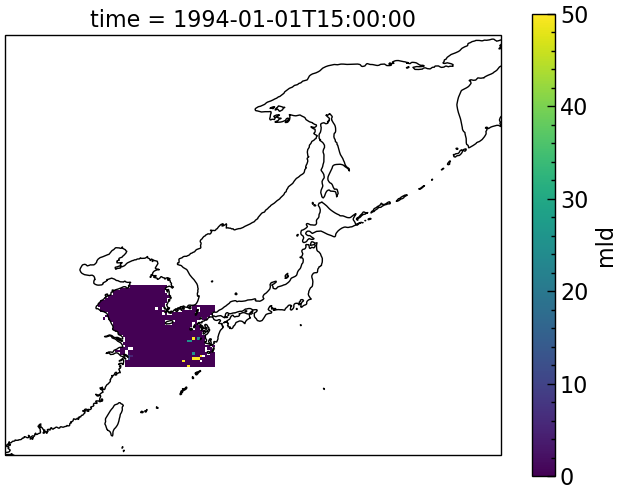

In [18]:
############################# plot BLT = MLT-MLD ####################################
ax=plt.axes(projection=ccrs.PlateCarree())
(mlt_necs[0,:,:]-mld_necs[0,:,:]).plot(ax=ax)
ax.set_extent([110,160,20,60])
ax.coastlines()

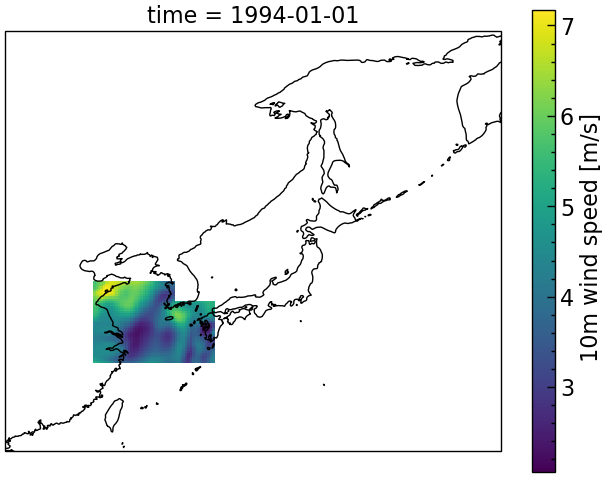

In [19]:
############################# plot BLT = MLT-MLD ####################################
ax=plt.axes(projection=ccrs.PlateCarree())
(wspd_necs[0,:,:]).plot(ax=ax)
ax.set_extent([110,160,20,60])
ax.coastlines()

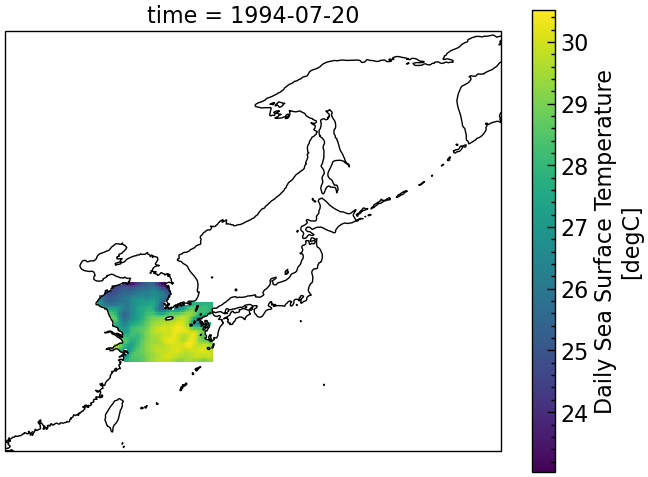

In [20]:
############################# plot SST ####################################

ax=plt.axes(projection=ccrs.PlateCarree())
sst_necs[200,:,:].plot(ax=ax)
ax.set_extent([110,160,20,60])
ax.coastlines()

## Ts,seas,thresh and Extreme stat for diffrenet variables

In [21]:
############ Extreme statistics for each of the variable: Return dataframe [ts,clim,thresh, Eflag1,Eflag2] #############################

def stat_all(sst_necs,cs=0):
    sst_necs_ts = sst_necs.mean(dim=['lat','lon']).values.squeeze()
    t = np.arange(date(1994,1,1).toordinal(),date(2015,12,31).toordinal()+1)
    mhws, clim = mhw.detect(t, sst_necs_ts,climatologyPeriod=[1994,2015],coldSpells=cs)
    df111= pd.DataFrame(mhws)
    ts_df = pd.DataFrame(sst_necs_ts,index=pd.date_range('1994-01-01','2015-12-31'),columns=['ts'])
    clim_df = pd.DataFrame(clim['seas'],index=pd.date_range('1994-01-01','2015-12-31'),columns=['seas'])
    perc_df = pd.DataFrame(clim['thresh'],index=pd.date_range('1994-01-01','2015-12-31'),columns=['thresh'])
    
    extreme_flag1 = np.zeros(len(t))
    extreme_flag1 = pd.DataFrame(extreme_flag1, index=pd.date_range('1994-01-01','2015-12-31'))
    extreme_flag1.columns=['extreme_flag1']
    
    for i in range(len(df111)):
        extreme_flag1.loc[df111.iloc[i,3]:df111.iloc[i,4]] = 1.0  
        
    if cs==0:
        extreme_flag2 = (ts_df.values>=perc_df.values)*1
    else:
        extreme_flag2 = (ts_df.values<=perc_df.values)*1
        
    extreme_flag2 = pd.DataFrame(extreme_flag2, index=pd.date_range('1994-01-01','2015-12-31'))
    extreme_flag2.columns=['extreme_flag2']
    
    return df111, pd.concat([ts_df,clim_df,perc_df,extreme_flag1,extreme_flag2],axis=1)

## MHWs Statistics

In [22]:
## Extreme identification OISST, HYCOM:  SST, SSS, Heat Flux terms,MLD, MLT

df111_sst,df_sst = stat_all(sst_necs)    ## OISST
df111_hycom_sst,df_hycom_sst = stat_all(sst_hycom_necs) ## HYCOM SST
df111_hycom_sss,df_hycom_sss = stat_all(sss_hycom_necs,cs=1)  ### HYCOM SSS       *** SALINITY COLD SPELL***
df111_mld,df_mld = stat_all(mld_necs,cs=1) ### HYCOM MLD                          *** MLD COLD SPELL***
df111_mlt,df_mlt = stat_all(mlt_necs,cs=1) ### HYCOM MLT                          *** MLT COLD SPELL***
df111_blt,df_blt = stat_all(mlt_necs-mld_necs)     ### HYCOM BLD

df111_sst_ten,df_sst_ten = stat_all(sst_ten_necs)  ### HYCOM SST TENDENCY
df111_qnet,df_qnet = stat_all(qnet_necs)   ### HYCOM QNET

df111_qsw,df_qsw = stat_all(qsw_necs)   ### HYCOM QNET
df111_qlw,df_qlw = stat_all(qlw_necs)   ### HYCOM QNET
df111_qsh,df_qsh = stat_all(qsh_necs)   ### HYCOM QNET
df111_qlh,df_qlh = stat_all(qlh_necs)   ### HYCOM QNET
df111_qbml,df_qbml = stat_all(-1*qbml_necs)  ### HYCOM QNET

df111_adv,df_adv = stat_all(adv_necs)   ### HYCOM QNET
df111_ent1,df_ent1 = stat_all(ent1_necs)   ### HYCOM QNET
df111_ent2,df_ent2 = stat_all(ent2_necs)   ### HYCOM QNET

df111_diff,df_diff = stat_all(diff_necs)   ### HYCOM QNET


In [23]:
### Extreme identification Actual HF terms
df111_qnet_actual,df_qnet_actual = stat_all(qnet_necs_actual)### HYCOM QNET
df111_qsw_actual,df_qsw_actual = stat_all(qsw_necs_actual)   ### HYCOM QNET
df111_qlw_actual,df_qlw_actual = stat_all(qlw_necs_actual)   ### HYCOM QNET
df111_qsh_actual,df_qsh_actual = stat_all(qsh_necs_actual)   ### HYCOM QNET
df111_qlh_actual,df_qlh_actual = stat_all(qlh_necs_actual)   ### HYCOM QNET

#### Extreme identification Windspeed ###
df111_wspd,df_wspd = stat_all(wspd_necs,cs=1)### HYCOM QNET                   *** WNDSPD OLD SPELL***
df111_precip,df_precip = stat_all(precip_necs)### HYCOM QNET                   *** precip extreme***


In [24]:
# plt.figure(figsize=(20,5))
pk_dates = pd.Series(df111_sst['date_peak'])
pk_dates = pd.to_datetime(pk_dates)
pk_dates_jja = pk_dates.loc[(pk_dates.dt.month>=6)&(pk_dates.dt.month<=9)]
# plt.plot(pk_dates_jja,np.arange(len(pk_dates_jja)),'o')
# print(len(df111_sst),len(pk_dates_jja))
# pk_dates = pd.Series(df111_mld['date_peak'])
# pk_dates = pd.to_datetime(pk_dates)
# pk_dates_jja = pk_dates.loc[(pk_dates.dt.month>=6)&(pk_dates.dt.month<=9)]
# plt.plot(pk_dates_jja,np.arange(len(pk_dates_jja)),'*')

(array([1., 2., 4., 2., 2., 3., 3., 1., 1., 3.]),
 array([1994. , 1995.9, 1997.8, 1999.7, 2001.6, 2003.5, 2005.4, 2007.3,
        2009.2, 2011.1, 2013. ]),
 <BarContainer object of 10 artists>)

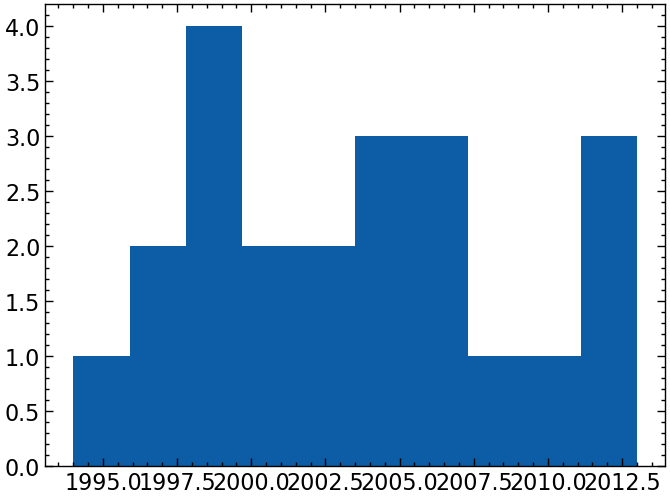

In [25]:
plt.hist(pk_dates_jja.dt.year)

<AxesSubplot:>

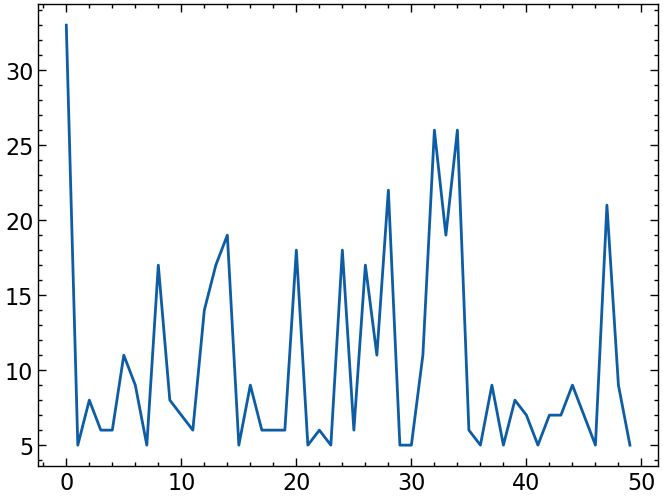

In [26]:
df111_sst['duration'].plot()

In [27]:
df_sst1 = df_sst.copy()
df_sst1 = df_sst1*np.nan
for i in range(len(df111_sst)):
    df_sst1.loc[df111_sst['date_start'][i]:df111_sst['date_end'][i]]=df_sst.loc[df111_sst['date_start'][i]:df111_sst['date_end'][i]]


In [28]:
# 512/len(df_sst1)

<AxesSubplot:>

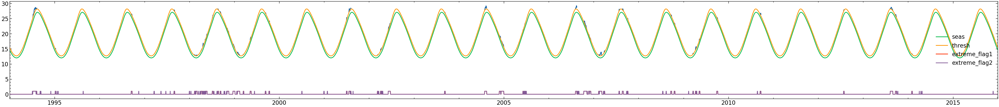

In [29]:
plt.figure(figsize=(50,5))
ax=plt.axes()
df_sst1.iloc[:,0].plot(ax=ax)
df_sst.iloc[:,1:].plot(ax=ax)

Text(0.5, 0, 'year')

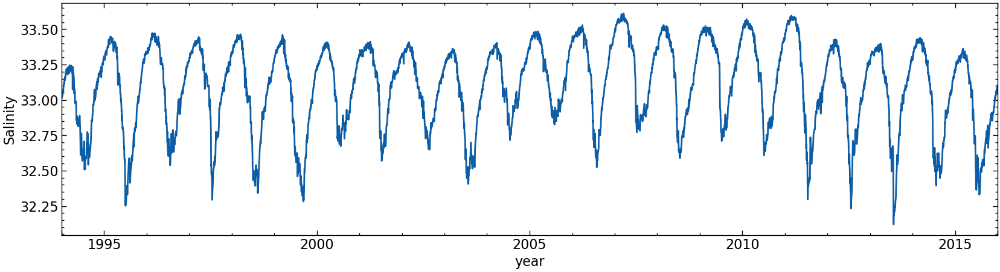

In [30]:
plt.figure(figsize=(20,5))
df_hycom_sss['ts'].plot()
plt.ylabel('Salinity')
plt.xlabel('year')

## MJO BSISO

In [31]:
%%time
mjo             = pd.read_csv('../../../MJO_composite/MJO.csv',skiprows=0,delim_whitespace=True)
bsiso           = pd.read_csv('../../../MJO_composite/BSISO.csv',skiprows=0,delim_whitespace=True)
mjo.index       = pd.date_range('1979-03-22',periods=len(mjo))
bsiso.index     = pd.date_range('1979-03-22',periods=len(mjo))
mjo             =   mjo[(mjo['year']>1981)&(mjo['year']<2018)]
bsiso           =   bsiso[(bsiso['year']>1981)&(bsiso['year']<2018)]

CPU times: user 44 ms, sys: 18.7 ms, total: 62.7 ms
Wall time: 275 ms


In [32]:
matrix1=np.loadtxt('../../rmm.txt',usecols=range(7),skiprows=2)
year=matrix1[:,0]
strt_ind=np.where(year==1981)[0][0]-31
strt_ind
df_rmm= pd.DataFrame(matrix1[:,3:])
df_rmm.columns=[['rmm1','rmm2','phase','amplitude']]
df_rmm.index       = pd.date_range('1974-06-01',periods=len(df_rmm))
df_rmm      =   df_rmm[(df_rmm.index.year>1981)&(df_rmm.index.year<2018)]
# df_rmm

## 30-90 days filter 

In [33]:
def filter_signal_scipy(signal,fs,highcut,lowcut,keep_mean_no=0):
    filter_signal=np.zeros(signal.shape)
    if any(np.isnan(signal)):
#         raise ValueError('There is NaN in the signal')
       filter_signal= signal*1
    else:
        hf=1./highcut
        lf=1./lowcut

        temp_fft = np.fft.fft(signal)

        fftfreq = np.fft.fftfreq(len(signal),fs) ### daily data it is 1./365 ## monthly data 1./12 ## yearly data=1
          
        i1=(np.abs(fftfreq) >= lf) & (np.abs(fftfreq) <= hf)  
        inv_fft=np.zeros(temp_fft.size,dtype=complex)
        inv_fft[i1]=temp_fft[i1]
        if keep_mean_no:
            inv_fft[0]=temp_fft[0]
        filter_signal= np.real(np.fft.ifft(inv_fft))
    
    return filter_signal

In [34]:
df_qsw_actual['ts_filtered'] = filter_signal_scipy(df_qsw_actual['ts']-df_qsw_actual['seas'],fs=1,highcut=30,lowcut=90,keep_mean_no=0)
df_mld['ts_filtered']        = filter_signal_scipy(df_mld['ts']-df_mld['seas'],fs=1,highcut=30,lowcut=90,keep_mean_no=0)
df_sst['ts_filtered']        = filter_signal_scipy(df_sst['ts']-df_sst['seas'],fs=1,highcut=30,lowcut=90,keep_mean_no=0)
df_hycom_sst['ts_filtered']  = filter_signal_scipy(df_hycom_sst['ts']-df_hycom_sst['seas'],fs=1,highcut=30,lowcut=90,keep_mean_no=0)
df_hycom_sss['ts_filtered']  = filter_signal_scipy(df_hycom_sss['ts']-df_hycom_sss['seas'],fs=1,highcut=30,lowcut=90,keep_mean_no=0)
df_wspd['ts_filtered']       = filter_signal_scipy(df_wspd['ts']-df_wspd['seas'],fs=1,highcut=30,lowcut=90,keep_mean_no=0)
df_precip['ts_filtered']       = filter_signal_scipy(df_precip['ts']-df_precip['seas'],fs=1,highcut=30,lowcut=90,keep_mean_no=0)


<AxesSubplot:>

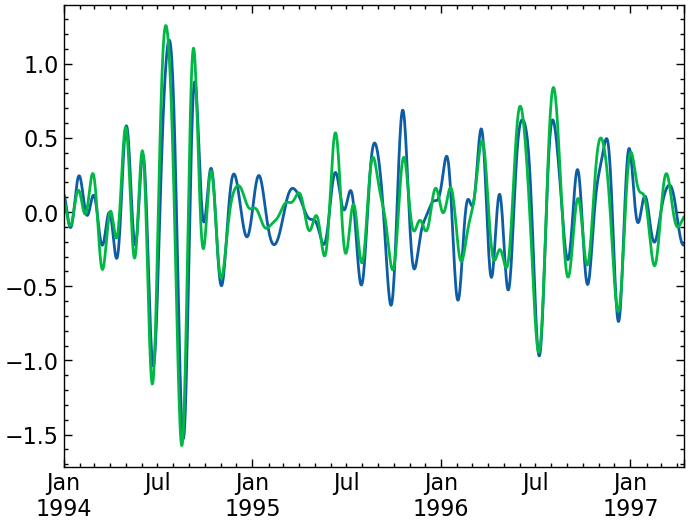

In [35]:
# (df_sst['ts']-df_sst['seas'])[:1200].plot()
df_sst['ts_filtered'][:1200].plot()
# (df_hycom_sst['ts']-df_hycom_sst['seas'])[:1200].plot()
df_hycom_sst['ts_filtered'][:1200].plot()

<AxesSubplot:>

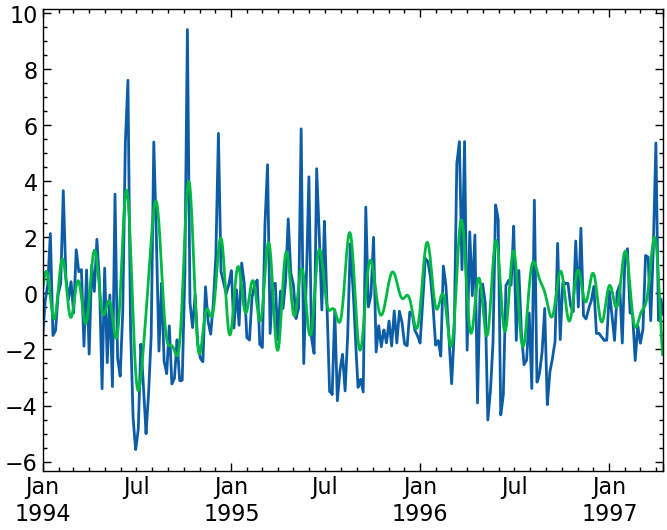

In [36]:
(df_precip['ts']-df_precip['seas'])[:1200].plot()
df_precip['ts_filtered'][:1200].plot()

## 1994 SST 

In [37]:
from mpl_toolkits.axes_grid1 import host_subplot
import matplotlib.dates as mdates

def plot_case(df_sst,ylabel='SST [$^\circ$C]',opt=1,yy=1994,both=False):
#     i=0
    # fig,ax = plt.subplots(1,1,figsize= (30,10))

    plt.figure(figsize=(30,10))
    plt.rcParams['font.size']=40
    ax = plt.axes()#host_subplot(111, axes_class=axisartist.Axes)
    par1 = ax.twinx()
    par2 = ax.twinx()


    ax.plot(df_sst['seas'].loc[str(yy)+'-06-01':str(yy)+'-09-30'].index.values,df_sst['seas'].loc[str(yy)+'-06-01':str(yy)+'-09-30'].values,color = 'blue',linewidth=5,label='Climatology')
    ax.plot(df_sst['thresh'].loc[str(yy)+'-06-01':str(yy)+'-09-30'].index.values,df_sst['thresh'].loc[str(yy)+'-06-01':str(yy)+'-09-30'].values,color = 'green',linewidth=5,label='Threshold')
    p1=ax.plot(df_sst['ts'].loc[str(yy)+'-06-01':str(yy)+'-09-30'].index.values,df_sst['ts'].loc[str(yy)+'-06-01':str(yy)+'-09-30'].values,color = 'red',linewidth=5,linestyle='-.',label='OISST')
    if both:
        ax.plot((df_sst['ts_filtered']+df_sst['seas']).loc[str(yy)+'-06-01':str(yy)+'-09-30'].index.values,(df_sst['ts_filtered']+df_sst['seas']).loc[str(yy)+'-06-01':str(yy)+'-09-30'].values,color = 'red',linewidth=5,linestyle='-.',alpha=0.5,label='OISST') 
#     p1=ax.plot(sst_necs.sel(time=slice(str(yy)+'-06-01',str(yy)+'-09-30')).time.values,sst_necs.sel(time=slice(str(yy)+'-06-01',str(yy)+'-09-30')).mean(dim=['lat','lon']),color = 'red',linewidth=5,linestyle='-.',label='OISST')
#     ax.set_ylim(20,30)
    ax.set_xlabel(str(yy)+'',fontsize=40,rotation=0)
    # plt.tick_params(direction='in', length=12,width= 4, colors='k')
    # plt.tick_params(which='minor',direction='in', length=8,width= 3, colors='k')
    if opt:
        ax.fill_between(df_sst['seas'].loc[str(yy)+'-06-01':str(yy)+'-09-30'].index.values,  df_sst['thresh'].loc[str(yy)+'-06-01':str(yy)+'-09-30'].values,df_sst['ts'].loc[str(yy)+'-06-01':str(yy)+'-09-30'].values,
                        where= (df_sst['ts'].loc[str(yy)+'-06-01':str(yy)+'-09-30'].values >= df_sst['thresh'].loc[str(yy)+'-06-01':str(yy)+'-09-30'].values),
                        facecolor='red', alpha=0.9, interpolate=True)
    else:
        ax.fill_between(df_sst['seas'].loc[str(yy)+'-06-01':str(yy)+'-09-30'].index.values,  df_sst['thresh'].loc[str(yy)+'-06-01':str(yy)+'-09-30'].values,df_sst['ts'].loc[str(yy)+'-06-01':str(yy)+'-09-30'].values,
                        where= (df_sst['ts'].loc[str(yy)+'-06-01':str(yy)+'-09-30'].values <= df_sst['thresh'].loc[str(yy)+'-06-01':str(yy)+'-09-30'].values),
                        facecolor='b', alpha=0.9, interpolate=True)
    plt.legend(fontsize=40)
    # # ax.xaxis.set_major_locator(MultipleLocator(5))
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%b-%d'))
    ax.set_ylabel(ylabel,fontsize=40,color='r')
    ax.tick_params(axis='y', labelcolor='r',labelsize=40)

    par2.spines.right.set_position(("axes", 1.05))


    par1.plot(bsiso.loc[str(yy)+'-06-01':str(yy)+'-09-30']['phase'].index,bsiso.loc[str(yy)+'-06-01':str(yy)+'-09-30']['phase'],label="BSISO  Phase")
    par2.plot(bsiso.loc[str(yy)+'-06-01':str(yy)+'-09-30']['phase'].index,bsiso.loc[str(yy)+'-06-01':str(yy)+'-09-30']['Amp(nrm)'],color='magenta',label="BSISO Amplitude")
    par2.axhline(1)

    par1.set_ylabel("BSISO  Phase",fontsize=40,color='C0')
    par2.set_ylabel("BSISO Amplitude",fontsize=40,color='magenta')
    par1.tick_params(axis='y', labelcolor='C0',labelsize=40)
    par2.tick_params(axis='y', labelcolor='magenta',labelsize=40)
    ax.tick_params(axis='x',labelsize=40)


In [38]:
# df111_sst

In [39]:
year=2008

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that 

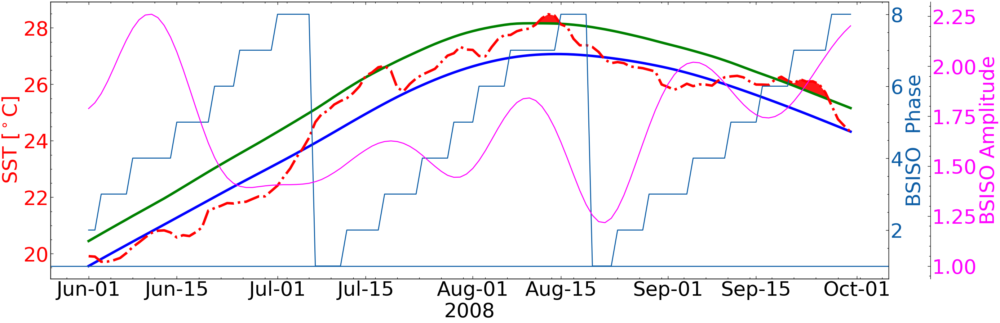

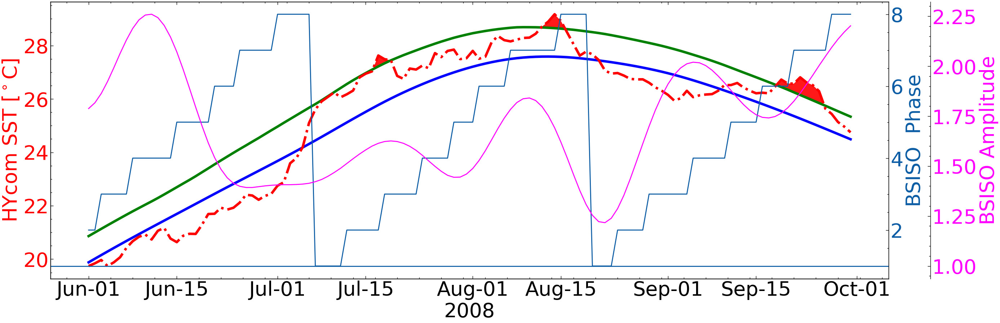

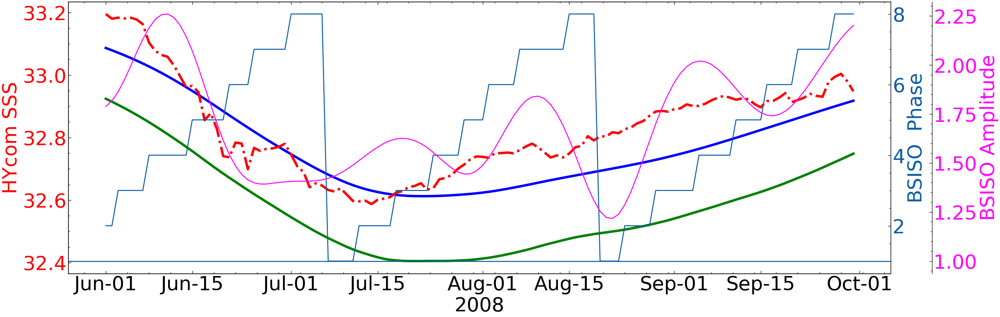

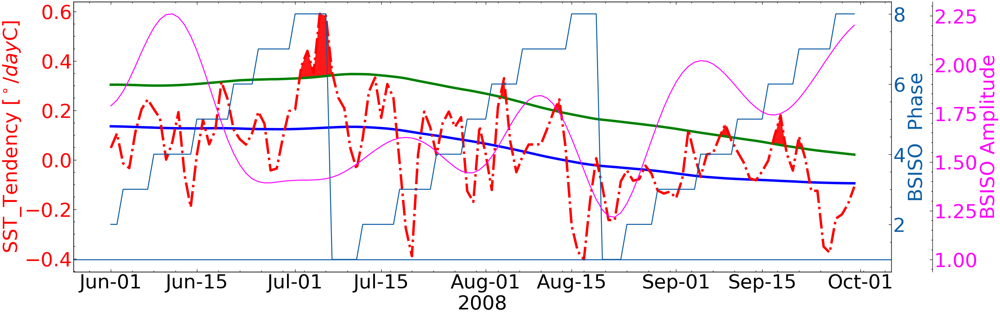

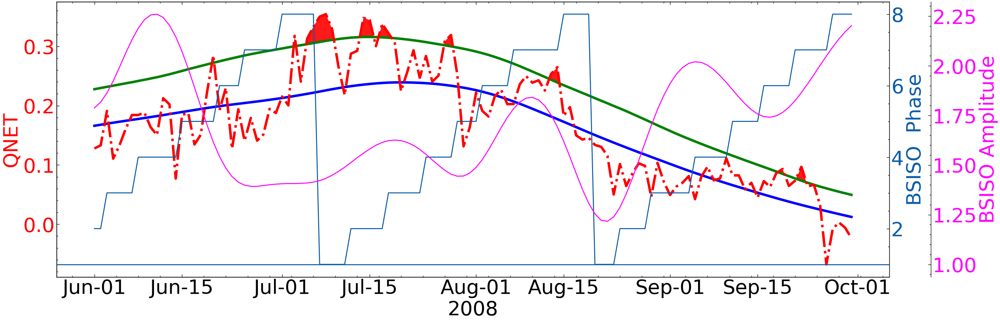

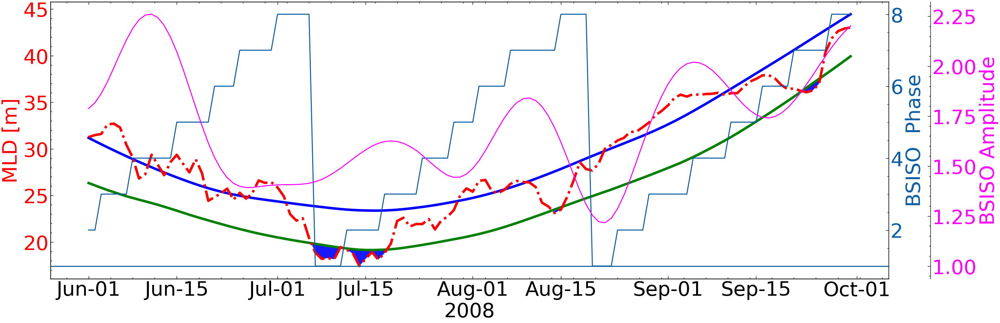

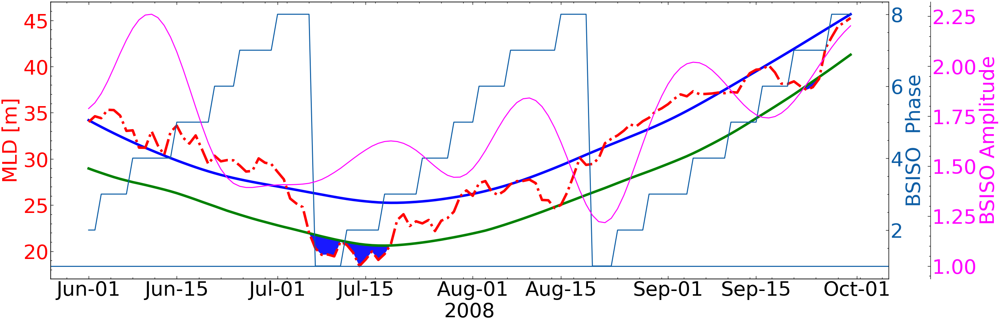

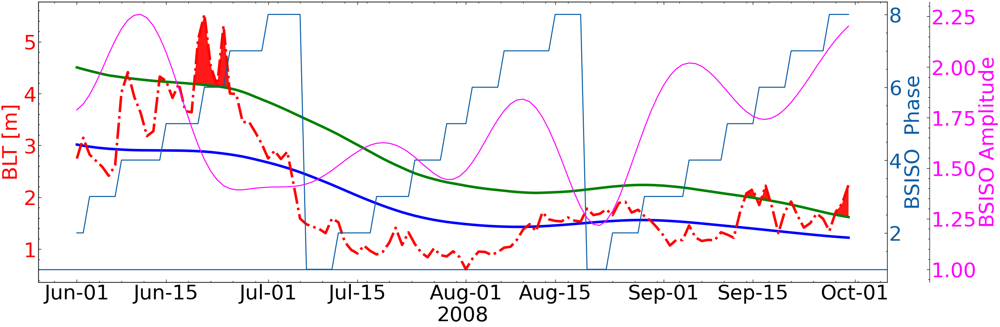

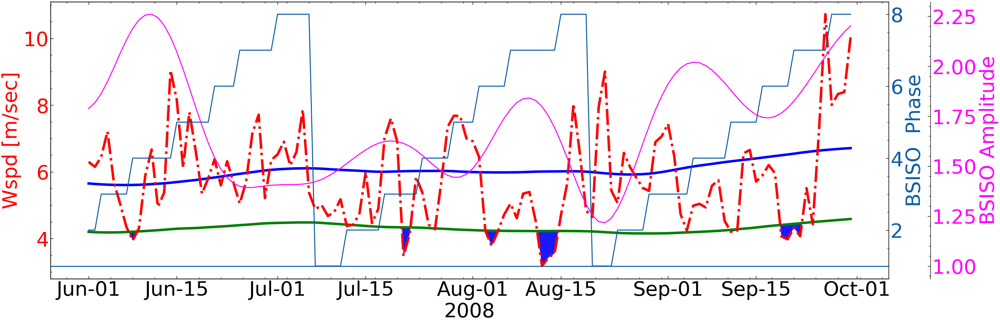

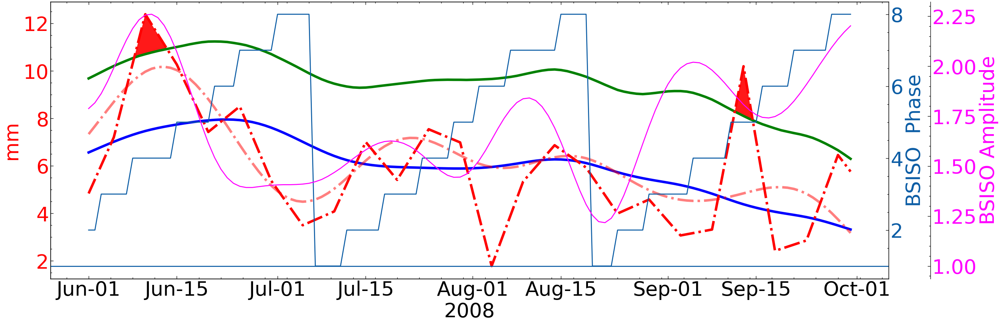

In [40]:
plot_case(df_sst,ylabel='SST [$^\circ$C]',opt=1,yy=year)
plot_case(df_hycom_sst,ylabel='HYcom SST [$^\circ$C]',opt=1,yy=year)
plot_case(df_hycom_sss,ylabel='HYcom SSS',opt=0,yy=year)
plot_case(df_sst_ten,ylabel='SST_Tendency [$^\circ/day$C]',opt=1,yy=year)
plot_case(df_qnet,ylabel='QNET',opt=1,yy=year)
plot_case(df_mld,ylabel='MLD [m]',opt=0,yy=year)
plot_case(df_mlt,ylabel='MLD [m]',opt=0,yy=year)
plot_case(df_blt,ylabel='BLT [m]',opt=1,yy=year)
plot_case(df_wspd,ylabel='Wspd [m/sec]',opt=0,yy=year)
plot_case(df_precip,ylabel='mm',opt=1,yy=year,both=True)

##  Lead-lad Correlation ###

In [41]:
def crosscorr_sho(x,y,opt):
    x = x-x.mean(); y =y -y.mean();
    npts = len(x)
    lags = np.arange(-npts+1,npts)
    ccov = np.correlate(x,y,mode = 'full')
    ccor = ccov/(npts* x.std()*y.std())
    if opt:
        plt.bar(lags,ccor)
    return lags,ccor

Text(0, 0.5, 'Crosscorrelation')

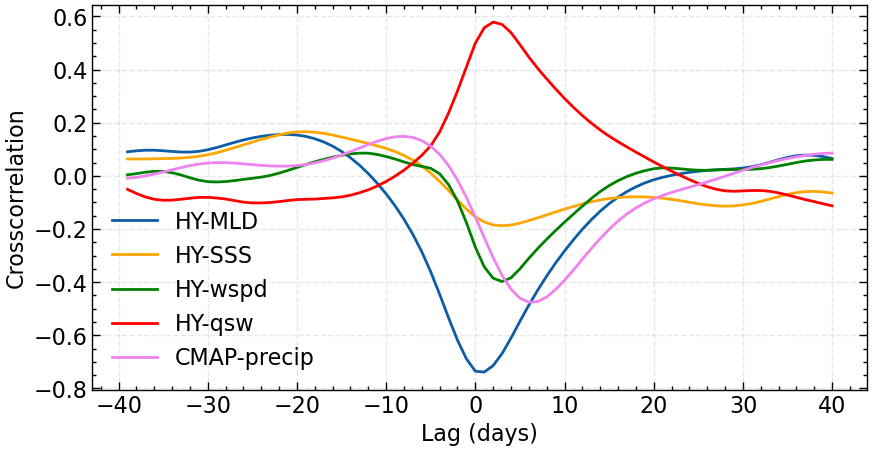

In [42]:
mld_filt  = (df_mld['ts']-df_mld['seas']).rolling('5D').mean()[(df_mld.index.month>5)&(df_mld.index.month<10)].values.squeeze()
sst_filt  = (df_sst['ts']-df_sst['seas']).rolling('5D').mean()[(df_sst.index.month>5)&(df_sst.index.month<10)].values.squeeze()
sst_filt2 = (df_hycom_sst['ts']-df_hycom_sst['seas']).rolling('5D').mean()[(df_hycom_sst.index.month>5)&(df_hycom_sst.index.month<10)].values.squeeze()

sss_filt   = (df_hycom_sss['ts']-df_hycom_sss['seas']).rolling('5D').mean()[(df_hycom_sss.index.month>5)&(df_hycom_sss.index.month<10)].values.squeeze()
wspd_filt  = (df_wspd['ts']-df_wspd['seas']).rolling('5D').mean()[(df_wspd.index.month>5)&(df_wspd.index.month<10)].values.squeeze()
qsw_filt   = (df_qsw_actual['ts']-df_qsw_actual['seas']).rolling('5D').mean()[(df_qsw_actual.index.month>5)&(df_qsw_actual.index.month<10)].values.squeeze()
pr_filt    = (df_precip['ts']-df_precip['seas']).rolling('5D').mean()[(df_precip.index.month>5)&(df_precip.index.month<10)].values.squeeze()


var =[mld_filt,sss_filt,wspd_filt,qsw_filt,pr_filt]
label=['HY-MLD','HY-SSS','HY-wspd','HY-qsw','CMAP-precip']
lg=40
plt.figure(figsize=(10,5))
c= ['C0','orange','green','red','violet']
for i in range(5):
    n=0
    all_ccor=[]
    for j in range(22):
        xx= sst_filt2[n:n+122]
        yy= var[i][n:n+122]
        lags,ccor= crosscorr_sho(xx,yy,opt=0)
        all_ccor.append(ccor)
        
    
        n=n+122
    plt.plot(lags[122-lg:122+lg],np.array(all_ccor).mean(0)[122-lg:122+lg],label=label[i],color=c[i])
#     plt.axvline(lags[np.abs(np.array(all_ccor).mean(0))==np.max(np.abs(np.array(all_ccor).mean(0)))],color=c[i],linestyle='--')
plt.legend()
plt.grid(alpha=0.3,linestyle='--')
plt.xlabel('Lag (days)')
plt.ylabel('Crosscorrelation')

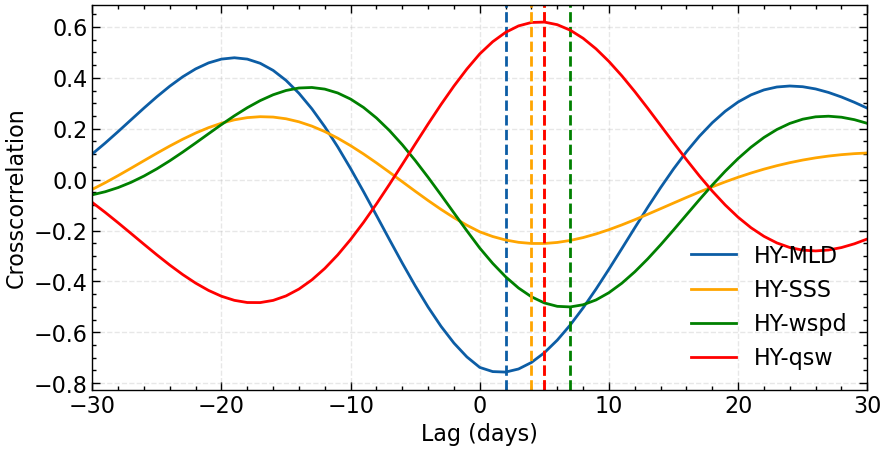

In [43]:
mld_filt  = df_mld['ts_filtered'][(df_mld.index.month>5)&(df_mld.index.month<10)].values.squeeze()
sst_filt  = df_sst['ts_filtered'][(df_sst.index.month>5)&(df_sst.index.month<10)].values.squeeze()
sst_filt2 = df_hycom_sst['ts_filtered'][(df_hycom_sst.index.month>5)&(df_hycom_sst.index.month<10)].values.squeeze()

sss_filt  = df_hycom_sss['ts_filtered'][(df_hycom_sss.index.month>5)&(df_hycom_sss.index.month<10)].values.squeeze()
wspd_filt  = df_wspd['ts_filtered'][(df_wspd.index.month>5)&(df_wspd.index.month<10)].values.squeeze()
qsw_filt   = df_qsw_actual['ts_filtered'][(df_qsw_actual.index.month>5)&(df_qsw_actual.index.month<10)].values.squeeze()
pr_filt   = df_precip['ts_filtered'][(df_precip.index.month>5)&(df_precip.index.month<10)].values.squeeze()


var =[mld_filt,sss_filt,wspd_filt,qsw_filt]
label=['HY-MLD','HY-SSS','HY-wspd','HY-qsw']
lg=31
plt.figure(figsize=(10,5))
c= ['C0','orange','green','red','violet']
for i in range(4):
    n=0
    all_ccor=[]
    for j in range(22):
        xx= sst_filt2[n:n+122]
        yy= var[i][n:n+122]
        lags,ccor= crosscorr_sho(xx,yy,opt=0)
        all_ccor.append(ccor)
        
    
        n=n+122
    plt.plot(lags[122-lg:122+lg],np.array(all_ccor).mean(0)[122-lg:122+lg],label=label[i],color=c[i])
    plt.axvline(lags[np.abs(np.array(all_ccor).mean(0))==np.max(np.abs(np.array(all_ccor).mean(0)))],color=c[i],linestyle='--')
plt.axvline(4,color=c[1],linestyle='--')
plt.xlim(-30,30)
plt.legend()
plt.grid(alpha=0.3,linestyle='--')
plt.xlabel('Lag (days)')
plt.ylabel('Crosscorrelation')
plt.savefig('jgrjdm_figure5a.pdf')

## Schematic MHWs #

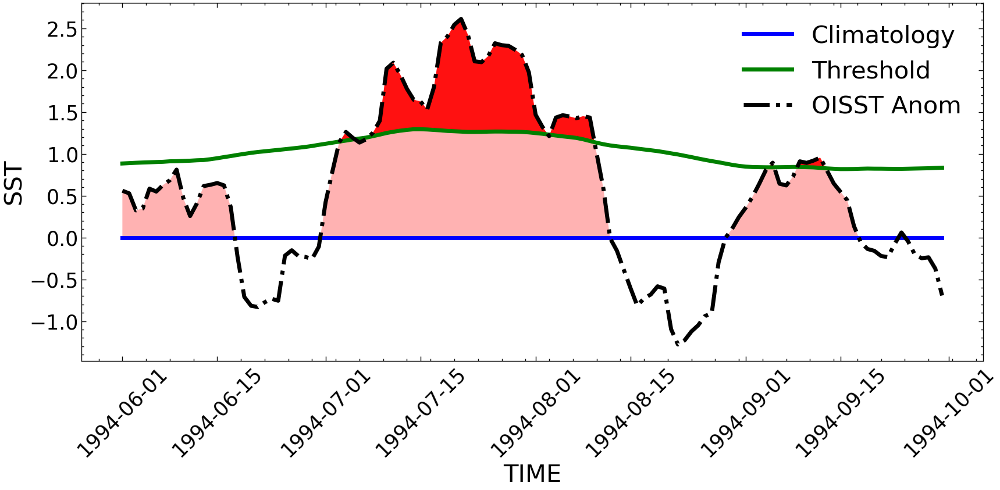

In [44]:
plt.rcParams['font.size']=30
yy=1994
plt.figure(figsize=(20,8))
plt.plot((df_sst['seas']-df_sst['seas']).loc[str(yy)+'-06-01':str(yy)+'-09-30'].index.values,(df_sst['seas']-df_sst['seas']).loc[str(yy)+'-06-01':str(yy)+'-09-30'].values,color = 'blue',linewidth=5,label='Climatology')
plt.plot((df_sst['thresh']-df_sst['seas']).loc[str(yy)+'-06-01':str(yy)+'-09-30'].index.values,(df_sst['thresh']-df_sst['seas']).loc[str(yy)+'-06-01':str(yy)+'-09-30'].values,color = 'green',linewidth=5,label='Threshold')
p1=plt.plot((df_sst['ts']-df_sst['seas']).loc[str(yy)+'-06-01':str(yy)+'-09-30'].index.values,(df_sst['ts']-df_sst['seas']).loc[str(yy)+'-06-01':str(yy)+'-09-30'].values,color = 'k',linewidth=5,linestyle='-.',label='OISST Anom')

    
plt.fill_between((df_sst['ts']-df_sst['seas']).loc[str(yy)+'-06-01':str(yy)+'-09-30'].index.values,  (df_sst['thresh']-df_sst['seas']).loc[str(yy)+'-06-01':str(yy)+'-09-30'].values,(df_sst['ts']-df_sst['seas']).loc[str(yy)+'-06-01':str(yy)+'-09-30'].values,
                where= ((df_sst['ts']-df_sst['seas']).loc[str(yy)+'-06-01':str(yy)+'-09-30'].values >= (df_sst['thresh']-df_sst['seas']).loc[str(yy)+'-06-01':str(yy)+'-09-30'].values),
                facecolor='red', alpha=0.9, interpolate=True)

plt.fill_between((df_sst['ts']-df_sst['seas']).loc[str(yy)+'-06-01':str(yy)+'-09-30'].index.values,  (df_sst['seas']-df_sst['seas']).loc[str(yy)+'-06-01':str(yy)+'-09-30'].values,(df_sst['ts']-df_sst['seas']).loc[str(yy)+'-06-01':str(yy)+'-09-30'].values,
                where= ((df_sst['ts']-df_sst['seas']).loc[str(yy)+'-06-01':str(yy)+'-09-30'].values >= (df_sst['seas']-df_sst['seas']).loc[str(yy)+'-06-01':str(yy)+'-09-30'].values),
                facecolor='red', alpha=0.3, interpolate=True)

plt.xticks(fontsize=25,rotation=45)
plt.yticks(fontsize=25)

plt.ylabel('SST',fontsize=30)
plt.xlabel('TIME',fontsize=30)


plt.legend(fontsize=30)
plt.savefig('MHWs.pdf',bbox_inches='tight')

## Defining DATAFRAME for physical and HB terms

In [45]:
import matplotlib.dates as mdates
################################################################################################################
all_var_org = [df_sst,df_hycom_sst,df_hycom_sss,df_mld,df_wspd,df_blt,df_qnet_actual,df_qsw_actual,df_qlw_actual,df_qsh_actual,df_qlh_actual]
all_var_HB  = [df_sst_ten,df_qnet,df_qsw,df_qlw,df_qsh,df_qlh,df_qbml,df_adv,df_ent1,df_ent2,df_diff]
name_org =['OISST','SST','SSS','MLD','10m\n Wind\n Speed','BLT',r'$Q_{net}$',r'$Q_{sw}$',r'$Q_{lw}$',r'$Q_{sh}$',r'$Q_{lh}$']
name_HB = [r'$\frac{\partial{sst}}{\partial{t}}$',r'$\frac{Q_{net}}{\rho C_p h}$',r'$\frac{Q_{sw}}{\rho C_p h}$',r'$\frac{Q_{lw}} {\rho C_p h}$',r'$\frac{Q_{sh}}{\rho C_p h}$',r'$\frac{Q_{lh}} {\rho C_p h}$',r'$-\frac{Q_{bml}} {\rho C_p h}$',r'$-u_m \cdot \nabla T_m$',r'$-\frac{1}{h}\left(T_m-T_{-h}\right) \partial h/\partial t$',r'$-\frac{1}{h}\left(T_m-T_{-h}\right) {u}_{-h} \cdot \nabla h$',r'$-\left.\frac{1}{h}K_v\frac{\partial T}{\partial z}\right|_{z=-h}$']
name_HB_short = ['SST_TEN','NET','SW','LW','SH','LH','BML','ADV','ENT1','ENT2','DIFF']
unit_org =['$\circ$C','$\circ$C','PSU','m','m $sec^{-1}$','m','$Wm^{-2}$','$W/m^{-2}$','$W/m^{-2}$','$W/m^{-2}$','$W/m^{-2}$']
##################################################################################################################


## climatology

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


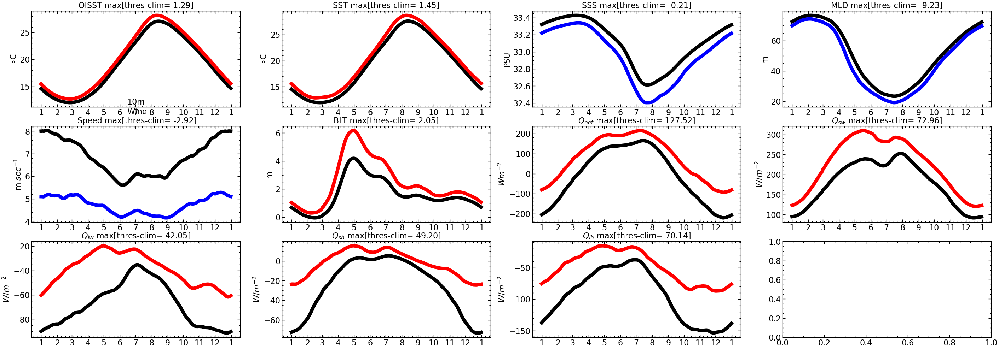

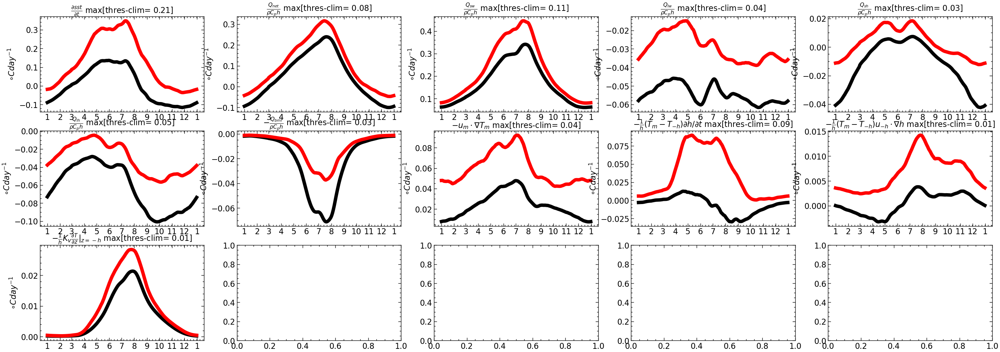

In [46]:
fig,ax= plt.subplots(3,4,figsize=(35,12))
plt.rcParams['font.size']=7
for ii in range(len(all_var_org)):
    i=ii//4;j=ii%4
    ax[i,j].plot(all_var_org[ii]['seas'][:365],linewidth=7,color='k',label='climatology')
    if (ii>1)&(ii<5):
        ax[i,j].plot(all_var_org[ii]['thresh'][:365],linewidth=7,color='b',label='Threshhold')
    else:
        ax[i,j].plot(all_var_org[ii]['thresh'][:365],linewidth=7,color='r',label='Threshhold')
        
    if (ii>1)&(ii<5):
        amp = np.min(all_var_org[ii]['thresh'][:365]-all_var_org[ii]['seas'][:365])
    else:
        amp = np.max(all_var_org[ii]['thresh'][:365]-all_var_org[ii]['seas'][:365])
        
    loc = mdates.MonthLocator(interval=1)
    ax[i,j].xaxis.set_major_locator(loc)
    fmt = mdates.DateFormatter('%-m')
    ax[i,j].xaxis.set_major_formatter(fmt)
#     if (ii==5)|(ii==10):
    ax[i,j].set_ylabel(unit_org[ii])
    ax[i,j].set_title(name_org[ii] +' max[thres-clim= %.2f]'%amp)
plt.legend()  

fig,ax= plt.subplots(3,5,figsize=(35,12))
plt.rcParams['font.size']=7
for ii in range(len(all_var_HB)):
    i=ii//5;j=ii%5
    ax[i,j].plot(all_var_HB[ii]['seas'][:365],linewidth=7,color='k',label='climatology')
    
    ax[i,j].plot(all_var_HB[ii]['thresh'][:365],linewidth=7,color='r',label='Threshhold')
    amp = np.max(all_var_HB[ii]['thresh'][:365]-all_var_HB[ii]['seas'][:365])
        
    loc = mdates.MonthLocator(interval=1)
    ax[i,j].xaxis.set_major_locator(loc)
    fmt = mdates.DateFormatter('%-m')
    ax[i,j].xaxis.set_major_formatter(fmt)
    ax[i,j].set_ylabel(r'$\circ C day^{-1}$')
    ax[i,j].set_title(name_HB[ii]+' max[thres-clim= %.2f]'%amp)
plt.legend()

## Extreme T AND S association during JJAS

## PLOT extremes in Physical Variables 

In [47]:
############ Investigating the intensification Period (TIP/NIP) of  MHWs #############################
st_dates = pd.Series(df111_sst['date_start'])-pd.Timedelta('7D')
pk_dates = pd.Series(df111_sst['date_peak'])

st_dates = pd.to_datetime(st_dates)
pk_dates = pd.to_datetime(pk_dates)

st_dates_jja = st_dates.loc[(pk_dates.dt.month>=6)&(pk_dates.dt.month<=9)]
pk_dates_jja = pk_dates.loc[(pk_dates.dt.month>=6)&(pk_dates.dt.month<=9)]

mean_anom=np.zeros((len(pk_dates_jja),len(all_var_org)+1))
ex_flag  =np.zeros((len(pk_dates_jja),len(all_var_org)+1))

for i in range(len(st_dates_jja)):
    for j in range(len(all_var_org)):
        X = all_var_org[j].loc[st_dates_jja.iloc[i]:pk_dates_jja.iloc[i]].mean()
#         print(X)
        mean_anom[i,j]= X['ts']-X['seas']
    
        if (j>1)&(j<5):
            ex_flag[i,j]  = np.any(((all_var_org[j]['ts']-all_var_org[j]['thresh']).loc[st_dates_jja.iloc[i]:pk_dates_jja.iloc[i]]<0)*1)
        else:
            ex_flag[i,j]  = np.any(((all_var_org[j]['ts']-all_var_org[j]['thresh']).loc[st_dates_jja.iloc[i]:pk_dates_jja.iloc[i]]>0)*1)
        

thresh= 0.6
for i in range(len(st_dates_jja)):
    
    temp             =    bsiso.loc[st_dates_jja.iloc[i]:pk_dates_jja.iloc[i]]
    nn               =    temp[(temp['phase']>4)&(temp['phase']<8)]
    nn1              =    nn[(nn['Amp(nrm)']>thresh).values]
    mean_anom[i,-1]  =    np.mean(nn['Amp(nrm)'])
    ex_flag[i,-1]    =    np.mean(nn['Amp(nrm)'])>thresh#(len(nn1)>0)*1
    

name_org_bsiso = name_org+['BSISO567Amp']

In [48]:
import nclcmaps
df_mean_anom = pd.DataFrame(mean_anom, index = pk_dates_jja.dt.strftime('%Y-%m-%d').values,columns=name_org_bsiso)
df_ex_flag = pd.DataFrame(ex_flag, index = pk_dates_jja.dt.strftime('%Y-%m-%d').values,columns=name_org_bsiso)

df_plot=df_mean_anom[['OISST', 'SST', 'SSS', 'MLD', '10m\n Wind\n Speed', '$Q_{net}$', 'BSISO567Amp']]
df_hatches=df_ex_flag[['OISST', 'SST', 'SSS', 'MLD', '10m\n Wind\n Speed', '$Q_{net}$','BSISO567Amp']]
units=['(°C)','(°C)','(PSU)','(m)','($m s^{-1}$)','($W m^{-2}$)','']

### all variable and extremes #####
df_plot_1 = df_plot.iloc[::-1]
df_hatches_1 = df_hatches.iloc[::-1]

#### negative extremes #####
df_hatches_2= df_hatches_1.copy()
df_hatches_2.iloc[:,2:5][df_hatches_2.iloc[:,2:5]==1]=-1
df_hatches_2[df_hatches_2!=-1]=0


/tmp/ipykernel_141805/4261183427.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_hatches_2.iloc[:,2:5][df_hatches_2.iloc[:,2:5]==1]=-1
/tmp/ipykernel_141805/4261183427.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_hatches_2.iloc[:,2:5][df_hatches_2.iloc[:,2:5]==1]=-1


/home/cccr/roxy/panini/anaconda3/envs/jgrjdm1/lib/python3.10/site-packages/matplotlib/ticker.py:2789: RuntimeWarning: invalid value encountered in log10
  majorstep_no_exponent = 10 ** (np.log10(majorstep) % 1)
/home/cccr/roxy/panini/anaconda3/envs/jgrjdm1/lib/python3.10/site-packages/matplotlib/ticker.py:2789: RuntimeWarning: invalid value encountered in log10
  majorstep_no_exponent = 10 ** (np.log10(majorstep) % 1)


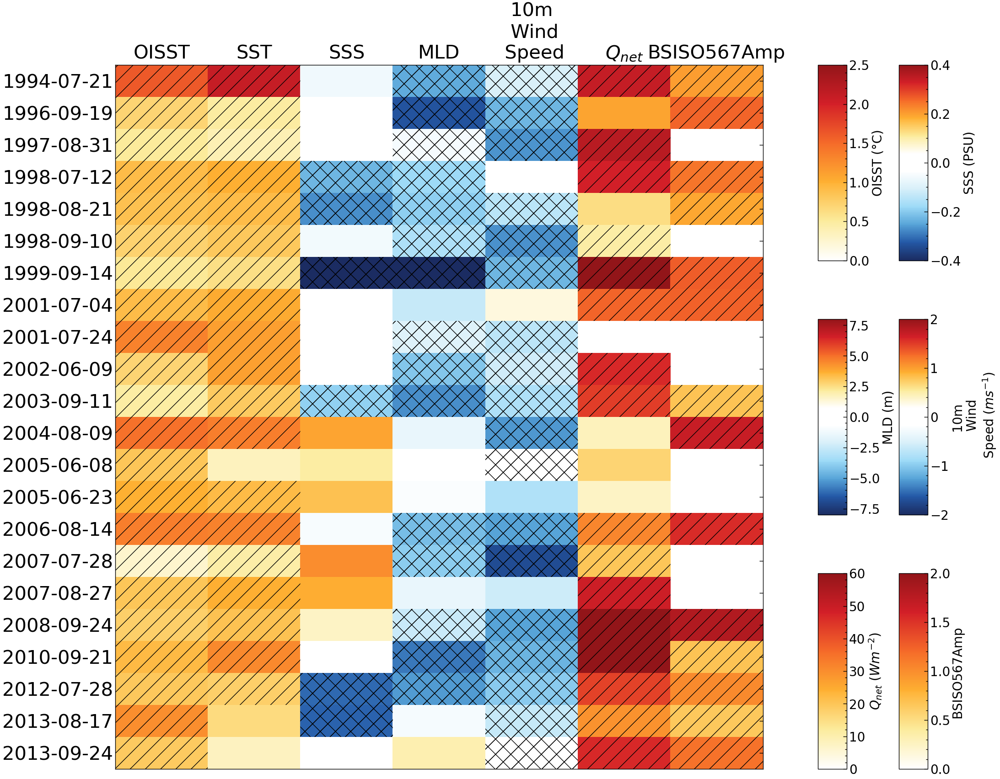

In [49]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
from matplotlib.gridspec import GridSpec
plt.rcParams['font.size']=40
zm = np.ma.masked_less(df_hatches_1.values, 0.5)
zm1 = np.ma.masked_greater(df_hatches_2.values, -0.5)

x= np.arange(len(df_hatches_1.columns)+1)
y= np.arange(len(df_hatches_1.index)+1)

def columnwise_heatmap(array, ax=None, **kw):
    ax = ax or plt.gca()
    premask = np.tile(np.arange(array.shape[1]), array.shape[0]).reshape(array.shape)
    images = []
    cmaps=[nclcmaps.cmap('WhiteYellowOrangeRed'),nclcmaps.cmap('WhiteYellowOrangeRed'),nclcmaps.cmap('BlueWhiteOrangeRed'),nclcmaps.cmap('BlueWhiteOrangeRed'),
           nclcmaps.cmap('BlueWhiteOrangeRed'),nclcmaps.cmap('WhiteYellowOrangeRed'),nclcmaps.cmap('WhiteYellowOrangeRed')]
    ranges = [[0,2.5],[0,2.5],[-0.4,0.4],[-8,8],[-2,2],[0,60],[0,2]]
    for i in range(array.shape[1]):
        col = np.ma.array(array, mask = premask != i)
        im = ax.pcolor(col, cmap=cmaps[i],vmin=ranges[i][0],vmax=ranges[i][1])
        images.append(im)
    return images

### Create some dataset
ind = pk_dates_jja.dt.strftime('%Y-%m-%d').values#list("ABCDEFGHIJKLM")
m = len(ind)
n = 12
# df = pd.DataFrame(np.random.randn(m,n) + np.random.randint(20,70,n), 
#                   index=ind, columns=[f"Step {i}" for i in range(2,2+n)])

### Plot data
fig, ax = plt.subplots(figsize=(24,20))

ims = columnwise_heatmap(df_plot_1.values, ax=ax, aspect="auto")
ax.pcolor(x, y, zm, hatch='/', alpha=0.)
ax.pcolor(x, y, zm1, hatch='x', alpha=0.)

ax.set(xticks=np.arange(len(df_plot_1.columns))[::-1]+0.5, yticks=np.arange(len(df_plot_1))[::-1]+0.5,
       xticklabels=df_plot_1.columns[::-1], yticklabels=df_plot_1.index[::-1])
ax.tick_params(bottom=False, top=False, 
               labelbottom=False, labeltop=True, left=False,labelsize=30)

### Optionally add colorbars.
fig.subplots_adjust(left=0.06, right=0.65)
rows = 3
cols = 2 #len(df_plot_1.columns) // rows + int((len(df_plot_1.columns))%rows > 0)-1
gs = GridSpec(rows, cols)
gs.update(left=0.7, right=0.8, wspace=1.8, hspace=0.3)
for i, im in enumerate(ims):
    i1=i
    if i ==1:
        continue
    if i>1:
        i1=i-1
        
    cax = fig.add_subplot(gs[i1//cols, i1 % cols])
    m=fig.colorbar(im, cax = cax)
    m.set_label(df_plot_1.columns[i]+ ' '+units[i], fontsize=20)
    cax.tick_params(labelsize=20)
# plt.show()
plt.savefig('jgrjdm_extreme_all_var.pdf',bbox_inches='tight')

/home/cccr/roxy/panini/anaconda3/envs/jgrjdm1/lib/python3.10/site-packages/matplotlib/ticker.py:2789: RuntimeWarning: invalid value encountered in log10
  majorstep_no_exponent = 10 ** (np.log10(majorstep) % 1)


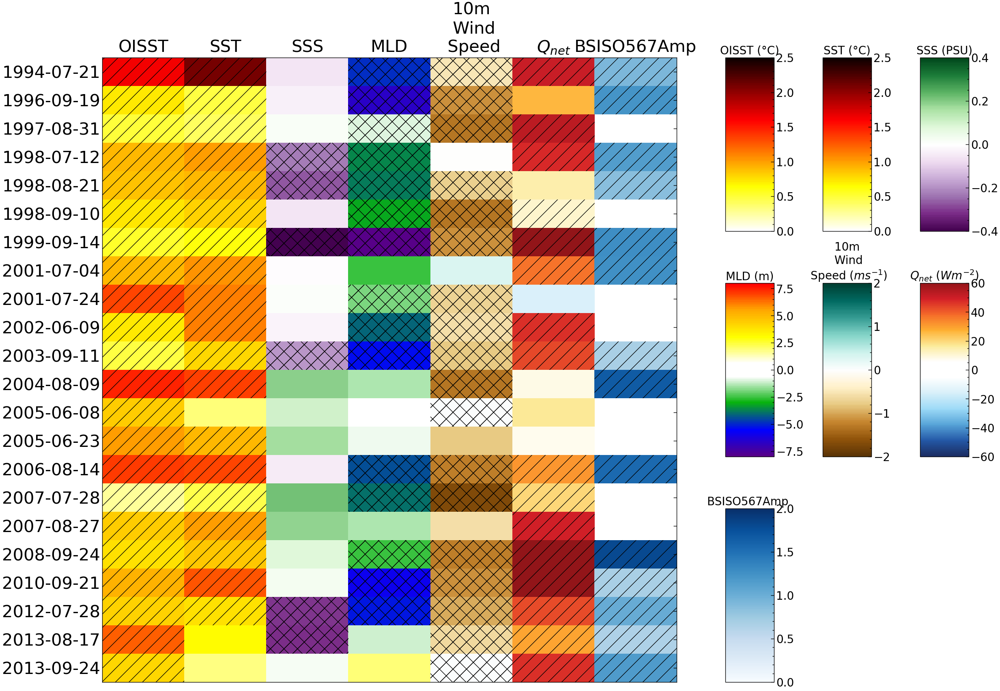

In [50]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
from matplotlib.gridspec import GridSpec
plt.rcParams['font.size']=40
zm = np.ma.masked_less(df_hatches_1.values, 0.5)
zm1 = np.ma.masked_greater(df_hatches_2.values, -0.5)

x= np.arange(len(df_hatches_1.columns)+1)
y= np.arange(len(df_hatches_1.index)+1)

def columnwise_heatmap(array, ax=None, **kw):
    ax = ax or plt.gca()
    premask = np.tile(np.arange(array.shape[1]), array.shape[0]).reshape(array.shape)
    images = []
    cmaps=[nclcmaps.cmap('MPL_hot').reversed(),nclcmaps.cmap('MPL_hot').reversed(),nclcmaps.cmap('MPL_PRGn'),nclcmaps.cmap('ViBlGrWhYeOrRe'),
           nclcmaps.cmap('MPL_BrBG'),nclcmaps.cmap('BlueWhiteOrangeRed'),nclcmaps.cmap('MPL_Blues')]
    ranges = [[0,2.5],[0,2.5],[-0.4,0.4],[-8,8],[-2,2],[-60,60],[0,2]]
    for i in range(array.shape[1]):
        col = np.ma.array(array, mask = premask != i)
        im = ax.pcolor(col, cmap=cmaps[i],vmin=ranges[i][0],vmax=ranges[i][1])
        images.append(im)
    return images

### Create some dataset
ind = pk_dates_jja.dt.strftime('%Y-%m-%d').values#list("ABCDEFGHIJKLM")
m = len(ind)
n = 12
# df = pd.DataFrame(np.random.randn(m,n) + np.random.randint(20,70,n), 
#                   index=ind, columns=[f"Step {i}" for i in range(2,2+n)])

### Plot data
fig, ax = plt.subplots(figsize=(24,20))

ims = columnwise_heatmap(df_plot_1.values, ax=ax, aspect="auto")
ax.pcolor(x, y, zm, hatch='/', alpha=0.)
ax.pcolor(x, y, zm1, hatch='x', alpha=0.)

ax.set(xticks=np.arange(len(df_plot_1.columns))[::-1]+0.5, yticks=np.arange(len(df_plot_1))[::-1]+0.5,
       xticklabels=df_plot_1.columns[::-1], yticklabels=df_plot_1.index[::-1])
ax.tick_params(bottom=False, top=False, 
               labelbottom=False, labeltop=True, left=False,labelsize=30)

### Optionally add colorbars.
fig.subplots_adjust(left=0.06, right=0.65)
rows = 3
cols = len(df_plot_1.columns) // rows + int(len(df_plot_1.columns)%rows > 0)
gs = GridSpec(rows, cols)
gs.update(left=0.7, right=0.95, wspace=1, hspace=0.3)
for i, im in enumerate(ims):
    cax = fig.add_subplot(gs[i//cols, i % cols])
    fig.colorbar(im, cax = cax)
    cax.set_title(df_plot_1.columns[i]+ ' '+units[i], fontsize=20)
    cax.tick_params(labelsize=20)
# plt.show()
plt.savefig('jgrjdm_extreme_all_var.pdf',bbox_inches='tight')

Text(0.5, 0, 'Days Before')

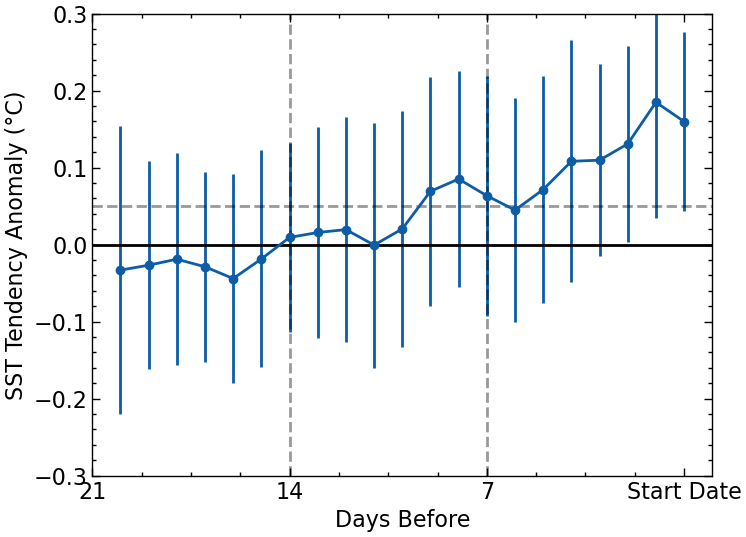

In [51]:
############ Investigating the intensification Period (TIP/NIP) of  MHWs #############################
st_dates = pd.Series(df111_sst['date_start'])-pd.Timedelta('20D')
pk_dates = pd.Series(df111_sst['date_start'])

st_dates = pd.to_datetime(st_dates)
pk_dates = pd.to_datetime(pk_dates)

st_dates_jja = st_dates.loc[(pk_dates.dt.month>=6)&(pk_dates.dt.month<=9)]
pk_dates_jja = pk_dates.loc[(pk_dates.dt.month>=6)&(pk_dates.dt.month<=9)]

mean_anom=np.zeros((len(pk_dates_jja),len(all_var_org)+1))
ex_flag  =np.zeros((len(pk_dates_jja),len(all_var_org)+1))

compo = []
for i in range(len(st_dates_jja)):
    for j in range(1):
        X = (df_sst_ten['ts']-df_sst_ten['seas']).loc[st_dates_jja.iloc[i]:pk_dates_jja.iloc[i]]
        compo.append(X.values)
plt.errorbar(np.arange(-20,1),np.array(compo).mean(0),yerr=np.array(compo).std(0), fmt='-o')

plt.ylim(-.3,.3)

plt.axhline(0,color='k')
plt.axhline(0.05,color='k',linestyle='--',alpha=0.4)
plt.axvline(-7,color='k',linestyle='--',alpha=0.4)
plt.axvline(-14,color='k',linestyle='--',alpha=0.4)
plt.xticks(np.arange(-21,1,7),['21','14','7','Start Date'])
plt.ylabel('SST Tendency Anomaly (°C)')
plt.xlabel('Days Before')

## PLOT extremes in HB terms

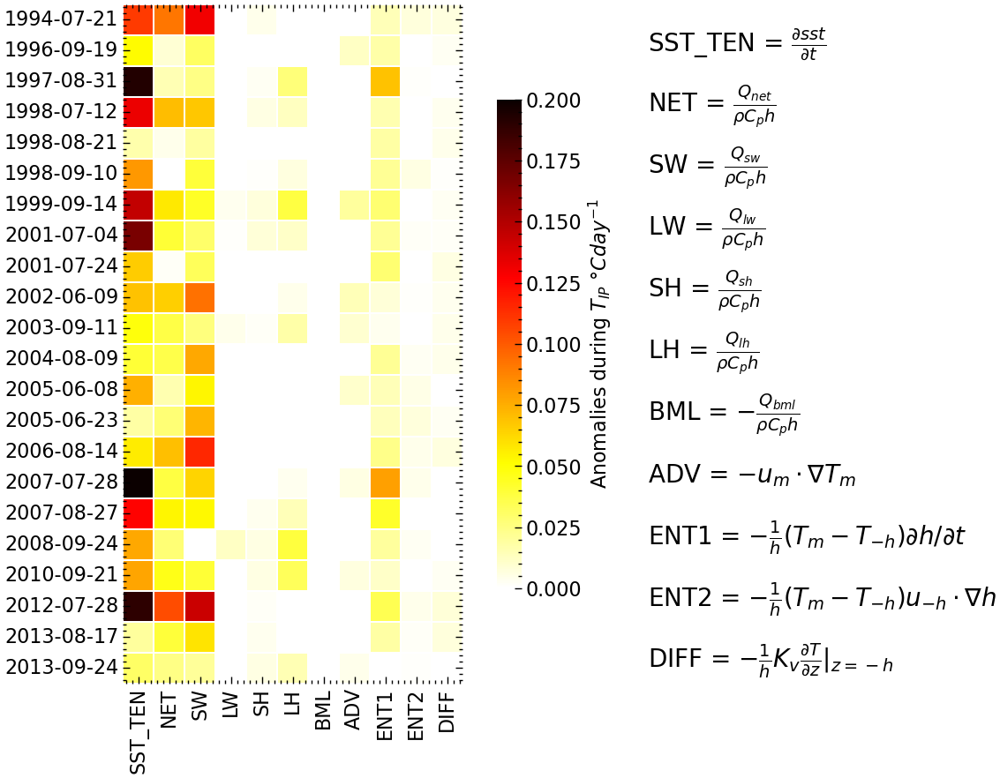

In [52]:
st_dates = pd.Series(df111_sst['date_start'])-pd.Timedelta('7D')
pk_dates = pd.Series(df111_sst['date_peak'])

st_dates = pd.to_datetime(st_dates)
pk_dates = pd.to_datetime(pk_dates)

st_dates_jja = st_dates.loc[(pk_dates.dt.month>=6)&(pk_dates.dt.month<=9)]
pk_dates_jja = pk_dates.loc[(pk_dates.dt.month>=6)&(pk_dates.dt.month<=9)]

mean_HB_anom=np.zeros((len(pk_dates_jja),len(all_var_HB)))
ex_flag_HB= np.zeros((len(pk_dates_jja),len(all_var_HB)))


for i in range(len(st_dates_jja)):
    for j in range(len(all_var_HB)):
        X_HB = all_var_HB[j].loc[st_dates_jja.iloc[i]:pk_dates_jja.iloc[i]].mean()
        mean_HB_anom[i,j] = X_HB['ts']-X_HB['seas']
        ex_flag_HB[i,j]   = np.any(all_var_HB[j]['extreme_flag2'].loc[st_dates_jja.iloc[i]:pk_dates_jja.iloc[i]])

import seaborn as sns
name_HB1=["["+i+r"]$^{\prime}$" for i in name_HB]
df_HB_mat = pd.DataFrame(mean_HB_anom,columns=name_HB1,index=pk_dates_jja.dt.strftime('%Y-%m-%d').values)
# plt.figure(figsize=(10,10))
fig, ax = plt.subplots(figsize=(10,10))
plt.rcParams['font.size']=60

sns.heatmap(df_HB_mat, 
            cmap=plt.cm.get_cmap('hot').reversed(), 
            vmin=0, 
            vmax=0.2, 
            square=True,
            linewidth=0.1, 
            cbar_kws={'shrink': .72,'label':'Anomalies during $T_{IP}$ $°C day^{-1}$'})

plt.xticks(np.arange(11)+0.5,name_HB_short)
plt.text(12+5,1.5,"SST_TEN = "+name_HB[0],fontsize=20)
plt.text(12+5,3.5,"NET = "+name_HB[1],fontsize=20)
plt.text(12+5,5.5,"SW = "+name_HB[2],fontsize=20)
plt.text(12+5,7.5,"LW = "+name_HB[3],fontsize=20)
plt.text(12+5,9.5,"SH = "+name_HB[4],fontsize=20)
plt.text(12+5,11.5,"LH = "+name_HB[5],fontsize=20)
plt.text(12+5,13.5,"BML = "+name_HB[6],fontsize=20)
plt.text(12+5,15.5,"ADV = "+name_HB[7],fontsize=20)
plt.text(12+5,17.5,"ENT1 = "+name_HB[8],fontsize=20)
plt.text(12+5,19.5,"ENT2 = "+name_HB[9],fontsize=20)
plt.text(12+5,21.5,"DIFF = "+name_HB[10],fontsize=20)
plt.savefig('jgrjdm_HB.pdf',bbox_inches='tight')

## Calculating 3D field climatology

In [53]:
def clim_calc(sst_necs,cs=0):
    sst_necs_ts = sst_necs.copy()
    t = np.arange(date(1994,1,1).toordinal(),date(2015,12,31).toordinal()+1)
    mhws, clim = mhw.detect(t, sst_necs_ts,climatologyPeriod=[1994,2015],coldSpells=cs)
    return clim['seas']

def thresh_calc(sst_necs,cs=0):
    sst_necs_ts = sst_necs.copy()
    t = np.arange(date(1994,1,1).toordinal(),date(2015,12,31).toordinal()+1)
    mhws, clim = mhw.detect(t, sst_necs_ts,climatologyPeriod=[1994,2015],coldSpells=cs)
    return clim['thresh']


In [54]:
clim_t_all   = np.apply_along_axis(clim_calc,0,t_all_xr['water_temp'].values)
thresh_t_all = np.apply_along_axis(thresh_calc,0,t_all_xr['water_temp'].values)
clim_s_all   = np.apply_along_axis(clim_calc,0,s_all_xr['salinity'].values,cs=1)
thresh_s_all = np.apply_along_axis(thresh_calc,0,s_all_xr['salinity'].values,cs=1)
clim_r_all   = np.apply_along_axis(clim_calc,0,r_all_xr['rho'].values)
thresh_r_all = np.apply_along_axis(thresh_calc,0,r_all_xr['rho'].values)


clim_t_all_xr   =t_all_xr['water_temp'].copy();clim_t_all_xr.values=clim_t_all*1
thresh_t_all_xr =t_all_xr['water_temp'].copy();thresh_t_all_xr.values=thresh_t_all*1
clim_s_all_xr   =s_all_xr['salinity'].copy();clim_s_all_xr.values=clim_s_all*1
thresh_s_all_xr =s_all_xr['salinity'].copy();thresh_s_all_xr.values=thresh_s_all*1

clim_r_all_xr   =r_all_xr['rho'].copy();clim_r_all_xr.values=clim_r_all*1
thresh_r_all_xr =r_all_xr['rho'].copy();thresh_r_all_xr.values=thresh_r_all*1

## Animation 1D

In [55]:
# clim_t_all_xr.sel(time=slice('2008-06-01','2008-09-30'))[0,:].plot()
# clim_t_all_xr.sel(time=slice('2013-06-01','2013-09-30'))[0,:].plot()

## Animation 2D

## MLD variation

## Contribution from Q and H

EQ : 1 $\frac{\partial(SST)}{\partial t}\approx\frac{Q_{net}}{h} * \frac{1}{\rho C_p}$      

EQ : 2 $\frac{\partial(SST)^{\prime}}{\partial t}=\frac{Q_{\text {net }}^{\prime}}{\bar{h}}-\frac{h^{\prime} \bar{Q}_{\text {net }}}{\bar{h}^2}-\frac{h^{\prime} Q_{\text {net }}^{\prime}}{\bar{h}^2}$

In [56]:
# additional_terms = ['','',r'[$\frac{Q_{net }^{\prime}}{\overline{h}}]$',r'[$-\frac{h^{\prime} \overline{Q}_{net }}{\overline{h}^2}$]',r'$[-\frac{h^{\prime} Q_{net }^{\prime}}{\overline{h}^2}$]']
additional_terms = ['','',r'[$\frac{Q_{sw }^{\prime}}{\rho c_P \overline{h}}]$',r'[$-\frac{h^{\prime} \overline{Q}_{sw }}{\rho c_P\overline{h}^2}$]',r'$[-\frac{h^{\prime} Q_{sw }^{\prime}}{\rho c_P\overline{h}^2}$]',r'[$\frac{Q_{sw }^{\prime}}{\rho c_P \overline{h}}]_{30-90}$',r'[$-\frac{h^{\prime} \overline{Q}_{sw }}{\rho c_P\overline{h}^2}]_{30-90}$',r'$[-\frac{h^{\prime} Q_{sw }^{\prime}}{\rho c_P\overline{h}^2}]_{30-90}$']


In [57]:
##### Equation 1 three terms #########################
def calc_contribution(st,et,x,y=df_mld): ### (A-mean(A))/mean(A)
    x= x.loc[st_dates_jja.iloc[i]:pk_dates_jja.iloc[i]].mean()
    y= y.loc[st_dates_jja.iloc[i]:pk_dates_jja.iloc[i]].mean()
    const= 86400/(1024*3994) ## 86400sec /rho*cp
    x_bar   = x['seas']*const
    x_prime =(x['ts']-x['seas'])*const
    x_filt  = x['ts_filtered']*const
#     print(x_prime)
    y_bar   = y['seas']
    y_prime = y['ts']-y['seas']
    y_filt  = y['ts_filtered']
#     print(y_prime)
    
    term1 = x_prime/y_bar
    term2 = -1*((y_prime*x_bar)/(y_bar)**2)
    term3 = -1*((x_prime*y_prime)/(y_bar)**2)
    
    term1_filt = x_filt/y_bar
    term2_filt = -1*((y_filt*x_bar)/(y_bar)**2)
    term3_filt = -1*((x_filt*y_filt)/(y_bar)**2)
    return term1,term2,term3,term1_filt,term2_filt,term3_filt

In [58]:
st_dates = pd.Series(df111_sst['date_start'])-pd.Timedelta('7D')
pk_dates = pd.Series(df111_sst['date_peak'])

st_dates = pd.to_datetime(st_dates)
pk_dates = pd.to_datetime(pk_dates)

st_dates_jja = st_dates.loc[(pk_dates.dt.month>=6)&(pk_dates.dt.month<=9)]
pk_dates_jja = pk_dates.loc[(pk_dates.dt.month>=6)&(pk_dates.dt.month<=9)]


A_prime = np.zeros((len(st_dates_jja),8))

for i in range(len(st_dates_jja)):
    term1,term2,term3,term1_filt,term2_filt,term3_filt= calc_contribution(st_dates_jja.iloc[i],pk_dates_jja.iloc[i],x=df_qsw_actual,y=df_mld)
    A_prime[i,2]=term1
    A_prime[i,3]=term2
    A_prime[i,4]=term3
    A_prime[i,5]=term1_filt
    A_prime[i,6]=term2_filt
    A_prime[i,7]=term3_filt
df_additional_terms = pd.DataFrame(A_prime,columns=additional_terms,index=pk_dates_jja.dt.strftime('%Y-%m-%d').values)


(-0.01, 0.1)

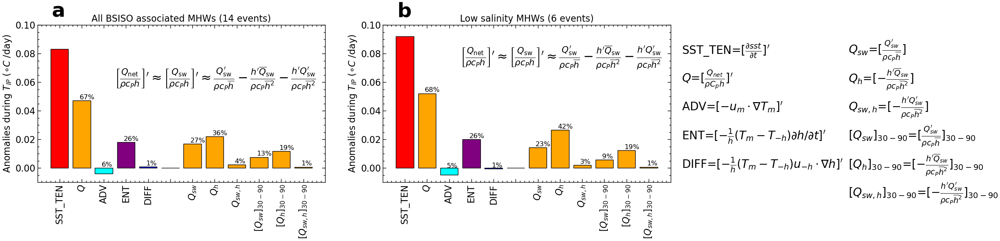

In [59]:
import string
####################################All terms Salinity EVENTS #############################
df_HB_mat_new=pd.concat([df_HB_mat,df_additional_terms],axis=1)
####################################All terms #############################
####### Mean Anomalies Associated with active MJO Phases #######
plt.rcParams['font.size']=30
fig = plt.figure(figsize=(20,5))
ax1  = fig.add_subplot(1, 2, 1) 
XX = df_HB_mat_new.iloc[np.where(df_hatches.iloc[:,-1]==1)[0],:].mean(0)
XX1 = XX.iloc[[0,1,7,8,9,12,13,14,15,16,17,18]]
colors= ['r','orange','cyan','purple','blue','C0','orange','orange','orange','orange','orange','orange']
ax1.bar(np.arange(len(XX1)),XX1,edgecolor='k',color=colors)
# ax1.xticks(np.arange(12),np.array(name_HB1+additional_terms)[[0,1,7,8,9,12,13,14,15,16,17,18]],rotation=90)
# for i in range(1,5):
#     if (i == 2):
#         ax1.text(i-0.1,XX1[i]+0.005,'%.f'%(np.round(100*XX1[i]/XX1[0],0))+'%',fontsize=12)
#     elif (i == 5):
#         continue
#     else:    
#         ax1.text(i-0.1,XX1[i]+0.001,'%.f'%(np.round(100*XX1[i]/XX1[0],0))+'%',fontsize=12)
for i in range(1,5):
    if (i == 2):
        ax1.text(i-0.1,XX1[i]+0.005,'6'+'%',fontsize=12)
    elif (i == 5):
        continue
    else:    
        ax1.text(i-0.1,XX1[i]+0.001,'%.f'%(np.round(100*np.abs(XX1[i])/(XX1[1]+np.abs(XX1[2])+XX1[3]+XX1[4]),0))+'%',fontsize=12)


for i in range(6,9):
    ax1.text(i-0.1,XX1[i]+0.001,'%.f'%(np.round(.67*100*XX1[i]/(XX1[6]+XX1[7]+XX1[8]),0))+'%',fontsize=12)

ax1.text(9-0.1,XX1[9]+0.001,'%.f'%(np.round(.28*100*XX1[9]/(XX1[6]),0))+'%',fontsize=12)
ax1.text(10-0.1,XX1[10]+0.001,'%.f'%(np.round(.36*100*XX1[10]/(XX1[7]),0))+'%',fontsize=12)
ax1.text(11-0.1,XX1[11]+0.001,'%.f'%(np.round(.04*100*XX1[11]/(XX1[8]),0))+'%',fontsize=12)


ax1.text(2.5, .06, r'$\left[\frac{Q_{\mathrm{net}}}{\rho c_P h}\right]^{\prime} \approx\left[\frac{Q_{\mathrm{sw}}}{\rho c_P h}\right]^{\prime} \approx \frac{Q_{\mathrm{sw}}^{\prime}}{\rho c_P \overline{h}}-\frac{h^{\prime} \overline{Q}_{\mathrm{sw}}}{\rho c_P \overline{h}^2}-\frac{h^{\prime} Q_{\mathrm{sw}}^{\prime}}{\rho c_P \overline{h}^2}$', fontsize = 22)
 
ax1.set_ylabel('Anomalies during $T_{IP}$ ($\circ C$ /day)')
ax1.set_title('All BSISO associated MHWs (14 events)')


ax1.set_xticks(np.arange(12),['SST_TEN','$Q$','ADV','ENT','DIFF','',r'$Q_{sw}$',r'$Q_{h}$',r'$Q_{sw,h}$',r'$[Q_{sw}]_{30-90}$',r'$[Q_{h}]_{30-90}$',r'$[Q_{sw,h}]_{30-90}$'],rotation=90)


########################################
ax  = fig.add_subplot(1, 2, 2) 

XX = df_HB_mat_new.iloc[np.where(df_hatches.iloc[:,2]==1)[0],:].mean(0)
XX1 = XX.iloc[[0,1,7,8,9,12,13,14,15,16,17,18]]
colors= ['r','orange','cyan','purple','blue','C0','orange','orange','orange','orange','orange','orange']
ax.bar(np.arange(len(XX1)),XX1,edgecolor='k',color=colors)
# plt.xticks(np.arange(12),np.array(name_HB1+additional_terms)[[0,1,7,8,9,12,13,14,15,16,17,18]],rotation=90)
# for i in range(1,5):
#     if (i == 2):
#         plt.text(i-0.1,XX1[i]+0.005,'%.f'%(np.round(100*XX1[i]/XX1[0],0))+'%',fontsize=12)
#     elif (i == 5):
#         continue
#     else:    
#         plt.text(i-0.1,XX1[i]+0.001,'%.f'%(np.round(100*XX1[i]/XX1[0],0))+'%',fontsize=12)
for i in range(1,5):
    if (i == 2):
        ax.text(i-0.1,XX1[i]+0.005,'5'+'%',fontsize=12)
    elif (i == 5):
        continue
    else:    
        ax.text(i-0.1,XX1[i]+0.001,'%.f'%(np.round(100*np.abs(XX1[i])/(XX1[1]+np.abs(XX1[2])+XX1[3]+XX1[4]),0))+'%',fontsize=12)

        
for i in range(6,9):
    ax.text(i-0.1,XX1[i]+0.001,'%.f'%(np.round(.68*100*XX1[i]/(XX1[6]+XX1[7]+XX1[8]),0))+'%',fontsize=12)

ax.text(9-0.1,XX1[9]+0.001,'%.f'%(np.round(.23*100*XX1[9]/(XX1[6]),0))+'%',fontsize=12)
ax.text(10-0.1,XX1[10]+0.001,'%.f'%(np.round(.42*100*XX1[10]/(XX1[7]),0))+'%',fontsize=12)
ax.text(11-0.1,XX1[11]+0.001,'%.f'%(np.round(.03*100*XX1[11]/(XX1[8]),0))+'%',fontsize=12)

ax.text(2.5, .075, r'$\left[\frac{Q_{\mathrm{net}}}{\rho c_P h}\right]^{\prime} \approx\left[\frac{Q_{\mathrm{sw}}}{\rho c_P h}\right]^{\prime} \approx \frac{Q_{\mathrm{sw}}^{\prime}}{\rho c_P \overline{h}}-\frac{h^{\prime} \overline{Q}_{\mathrm{sw}}}{\rho c_P \overline{h}^2}-\frac{h^{\prime} Q_{\mathrm{sw}}^{\prime}}{\rho c_P \overline{h}^2}$', fontsize = 22)
 
ax.set_ylabel('Anomalies during $T_{IP}$ ($\circ C$ /day)')
ax.set_title('Low salinity MHWs (6 events)')


ax.set_xticks(np.arange(12),['SST_TEN','$Q$','ADV','ENT','DIFF','',r'$Q_{sw}$',r'$Q_{h}$',r'$Q_{sw,h}$',r'$[Q_{sw}]_{30-90}$',r'$[Q_{h}]_{30-90}$',r'$[Q_{sw,h}]_{30-90}$'],rotation=90)
ax.text(12+8,-2*10**-2,"$[Q_{sw,h}]_{30-90}$="+np.array(name_HB1+additional_terms)[18],fontsize=20)
ax.text(12+8,0,"$[Q_{h}]_{30-90}$="+np.array(name_HB1+additional_terms)[17],fontsize=20)
ax.text(12+8,2*10**-2,"$[Q_{sw}]_{30-90}$="+np.array(name_HB1+additional_terms)[16],fontsize=20)
ax.text(12+8,4*10**-2,"$Q_{sw,h}$="+np.array(name_HB1+additional_terms)[15],fontsize=20)
ax.text(12+8,6*10**-2,"$Q_{h}$="+np.array(name_HB1+additional_terms)[14],fontsize=20)
ax.text(12+8,8*10**-2,"$Q_{sw}$="+np.array(name_HB1+additional_terms)[13],fontsize=20)
# plt.text(12+5,19.5*10**-2,"G="+np.array(name_HB1+additional_terms)[12],fontsize=20)
ax.text(12+0.5,0*10**-2,"DIFF="+np.array(name_HB1+additional_terms)[9],fontsize=20)
ax.text(12+0.5,2*10**-2,"ENT="+np.array(name_HB1+additional_terms)[8],fontsize=20)
ax.text(12+0.5,4*10**-2,"ADV="+np.array(name_HB1+additional_terms)[7],fontsize=20)
ax.text(12+0.5,6*10**-2,"$Q$="+np.array(name_HB1+additional_terms)[1],fontsize=20)
ax.text(12+0.5,8*10**-2,"SST_TEN="+np.array(name_HB1+additional_terms)[0],fontsize=20)
plt.subplots_adjust(wspace=.2)
ax.text(0.05, 1.05, string.ascii_lowercase[1], transform=ax.transAxes,size=35, weight='bold')
ax1.text(0.05, 1.05, string.ascii_lowercase[0], transform=ax1.transAxes,size=35, weight='bold')

ax.set_ylim([-.01,.1])
ax1.set_ylim([-.01,.1])
# # plt.savefig('jgrjdm_HB.pdf',bbox_inches='tight')
# plt.savefig('jgrjdm_bar_HB2.pdf',bbox_inches='tight')

Text(0.5, 1.0, 'All BSISO associated MHWs (14 events)')

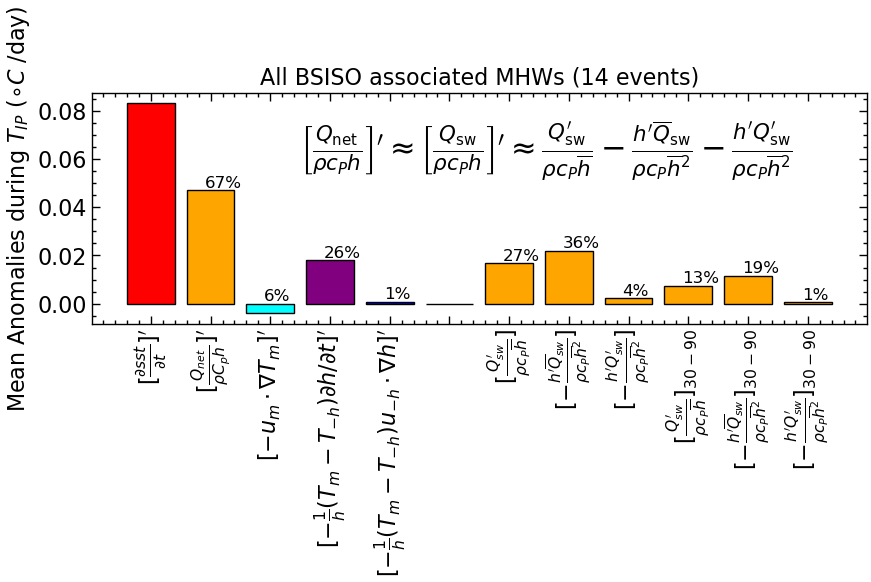

In [60]:
####################################All terms BSISO events #############################
df_HB_mat_new=pd.concat([df_HB_mat,df_additional_terms],axis=1)
####################################All terms #############################
####### Mean Anomalies Associated with active MJO Phases #######
plt.figure(figsize=(10,3))
XX = df_HB_mat_new.iloc[np.where(df_hatches.iloc[:,-1]==1)[0],:].mean(0)
XX1 = XX.iloc[[0,1,7,8,9,12,13,14,15,16,17,18]]
colors= ['r','orange','cyan','purple','blue','C0','orange','orange','orange','orange','orange','orange']
plt.bar(np.arange(len(XX1)),XX1,edgecolor='k',color=colors)
plt.xticks(np.arange(12),np.array(name_HB1+additional_terms)[[0,1,7,8,9,12,13,14,15,16,17,18]],rotation=90)
# for i in range(1,5):
#     if (i == 2):
#         plt.text(i-0.1,XX1[i]+0.005,'%.f'%(np.round(100*XX1[i]/XX1[0],0))+'%',fontsize=12)
#     elif (i == 5):
#         continue
#     else:    
#         plt.text(i-0.1,XX1[i]+0.001,'%.f'%(np.round(100*XX1[i]/XX1[0],0))+'%',fontsize=12)
for i in range(1,5):
    if (i == 2):
        plt.text(i-0.1,XX1[i]+0.005,'6'+'%',fontsize=12)
    elif (i == 5):
        continue
    else:    
        plt.text(i-0.1,XX1[i]+0.001,'%.f'%(np.round(100*np.abs(XX1[i])/(XX1[1]+np.abs(XX1[2])+XX1[3]+XX1[4]),0))+'%',fontsize=12)


for i in range(6,9):
    plt.text(i-0.1,XX1[i]+0.001,'%.f'%(np.round(.67*100*XX1[i]/(XX1[6]+XX1[7]+XX1[8]),0))+'%',fontsize=12)

plt.text(9-0.1,XX1[9]+0.001,'%.f'%(np.round(.28*100*XX1[9]/(XX1[6]),0))+'%',fontsize=12)
plt.text(10-0.1,XX1[10]+0.001,'%.f'%(np.round(.36*100*XX1[10]/(XX1[7]),0))+'%',fontsize=12)
plt.text(11-0.1,XX1[11]+0.001,'%.f'%(np.round(.04*100*XX1[11]/(XX1[8]),0))+'%',fontsize=12)

plt.text(2.5, .06, r'$\left[\frac{Q_{\mathrm{net}}}{\rho c_P h}\right]^{\prime} \approx\left[\frac{Q_{\mathrm{sw}}}{\rho c_P h}\right]^{\prime} \approx \frac{Q_{\mathrm{sw}}^{\prime}}{\rho c_P \overline{h}}-\frac{h^{\prime} \overline{Q}_{\mathrm{sw}}}{\rho c_P \overline{h}^2}-\frac{h^{\prime} Q_{\mathrm{sw}}^{\prime}}{\rho c_P \overline{h}^2}$', fontsize = 22)

    
plt.ylabel('Mean Anomalies during $T_{IP}$ ($\circ C$ /day)')
plt.title('All BSISO associated MHWs (14 events)')

# plt.savefig('jgrjdm_bar_HB.pdf',bbox_inches='tight')

# START N2 ANALYSIS

## N2 computation and relation with H

In [61]:
import gsw
sigma_all_xr = t_all_xr['water_temp'].copy()
sigma_all_xr.values = gsw.density.sigma0(s_all_xr['salinity'].values, t_all_xr['water_temp'].values)+1000
#     dens1 =  dens['RHOAnoma'].values+1029.0
clim_r_all2   = np.apply_along_axis(clim_calc,0,sigma_all_xr.values)
#########################################################################################################
t_all_xr.depth.values[11:14],t_all_xr.depth.values[0:8]

(array([35., 40., 45.]), array([ 0.,  2.,  4.,  6.,  8., 10., 12., 15.]))

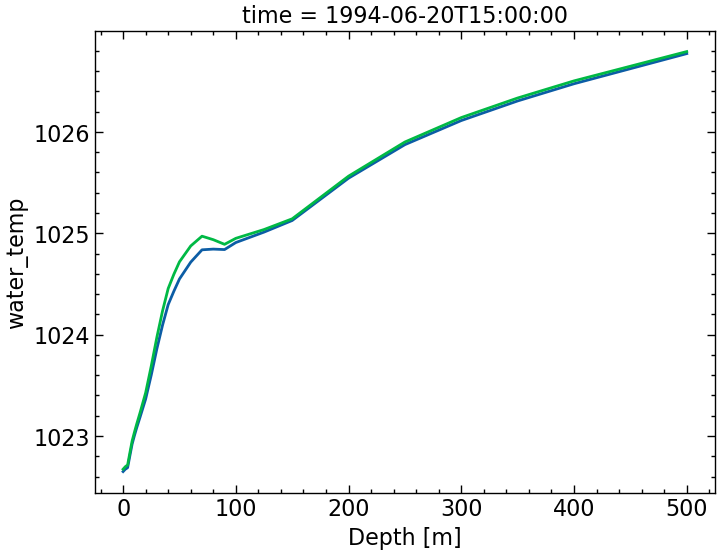

In [62]:
r_all_xr['rho'][170,:].plot()
sigma_all_xr[170,:].plot()

In [63]:
################################## N2 definition ############################################################
dep1=11;dep2=14  ### SUB-SURFACE
dep01=0;dep02=8 ### SURFACE
print(t_all_xr.depth.values[dep1:dep2],t_all_xr.depth.values[dep01:dep02])
diff = 20        ### depth difference

############################# N2 computation jgrjdm  original rho  #######################
N2_1 =[]
dz_all=[]

#### Loop over Time####
for i in range(len(t_all_xr['water_temp'].time.values)):
    ### del rho = rho_45-60m - rho_0
    del_rho = r_all_xr['rho'][i][dep1:dep2].mean('depth')-r_all_xr['rho'][i][dep01:dep02].mean('depth') ## rho_15mbelow_MLD - rho_MLD 
    ### del rho = 45-60m - rho_0
    dz      = diff# 25   #52.5#r_all_xr['rho'][i].depth.values[np.where(nn2==1)[0]].mean()-df_mld['ts'][i]
    g   = 9.8
    rho = 1024
    
    N2_1.append((g/rho)*(del_rho.values/dz))
    dz_all.append(dz)
    
N2_1= np.array(N2_1)

###############################################################################################################
###############################################################################################################
###############################################################################################################
############################# N2 computation jgrjdm derived rho  #######################

N2_2 =[]
dz_all=[]

#### Loop over Time####
for i in range(len(t_all_xr['water_temp'].time.values)):
    ### del rho = rho_45-60m - rho_0
    del_rho   = sigma_all_xr[i][dep1:dep2].mean('depth')-sigma_all_xr[i][dep01:dep02].mean('depth') ## rho_15mbelow_MLD - rho_MLD 
    ### del rho = 45-60m - rho_0
    dz        = diff #25  #52.5#r_all_xr['rho'][i].depth.values[np.where(nn2==1)[0]].mean()-df_mld['ts'][i]  
    g         = 9.8
    rho       = 1024
    
    N2_2.append((g/rho)*(del_rho.values/dz))
    dz_all.append(dz)
#     
N2_2= np.array(N2_2)


################################################################################################################
################################################################################################################
######## Surface and subsuurface salinity Variation due to T and S change using ALpha and BETA #################################
################################################################################################################
alpha = -1*gsw.density.alpha(clim_s_all_xr[:,dep01:dep02].mean('depth').values,clim_t_all_xr[:,dep01:dep02].mean('depth').values,10)*1000
beta  = gsw.density.beta(clim_s_all_xr[:,dep01:dep02].mean('depth').values,clim_t_all_xr[:,dep01:dep02].mean('depth').values,10)*1000


rho0_prime_t =  alpha *(t_all_xr['water_temp'][:,dep01:dep02].mean('depth').values-clim_t_all_xr[:,dep01:dep02].mean('depth').values) ## surface
rho0_prime_t1=  alpha *(t_all_xr['water_temp'][:,dep1:dep2].mean('depth').values-clim_t_all_xr[:,dep1:dep2].mean('depth').values)## subsurface


rho0_prime_s  = beta *(s_all_xr['salinity'][:,dep01:dep02].mean('depth').values-clim_s_all_xr[:,dep01:dep02].mean('depth').values)  ## surface
rho0_prime_s1 = beta *(s_all_xr['salinity'][:,dep1:dep2].mean('depth').values-clim_s_all_xr[:,dep1:dep2].mean('depth').values)      ## subsurface

############################# N2 computation t and S contribution #######################

N2_t =[]; N2_t1=[];N2_t2=[];N2_clim=[];
N2_s =[]; N2_s1=[];N2_s2=[];
dz_all=[]

########################### Loop over Time########################################################################
for i in range(len(t_all_xr['water_temp'].time.values)):

########## 1st attempt #####################################################################################
#     del_rho_t = r_all_xr['rho'][i][dep1:dep2].mean('depth')-(clim_r_all_xr[i][dep01:dep02].mean('depth')+rho0_prime_t[i]) ## rho_15mbelow_MLD - (rho_MLD_clim+Teffect) 
#     del_rho_s = r_all_xr['rho'][i][dep1:dep2].mean('depth')-(clim_r_all_xr[i][dep01:dep02].mean('depth')+rho0_prime_s[i]) ## rho_15mbelow_MLD - (rho_MLD_clim+Seffect) 

########## revised attempt #################################################################################
    del_rho_t = (clim_r_all_xr[i][dep1:dep2].mean('depth')+rho0_prime_t1[i])-(clim_r_all_xr[i][dep01:dep02].mean('depth')+rho0_prime_t[i]) ## rho_subsurface_clim+rho_T_anom_subsurface - (rho_surface_clim+rho_T_anom_surface) 
    del_rho_s = (clim_r_all_xr[i][dep1:dep2].mean('depth')+rho0_prime_s1[i])-(clim_r_all_xr[i][dep01:dep02].mean('depth')+rho0_prime_s[i]) ## rho_subsurface_clim+rho_T_anom_subsurface - (rho_surface_clim+rho_T_anom_surface)  

#######################  surface and subsurface contribution of T stratification ###########################
    del_rho_t1 = (clim_r_all_xr[i][dep1:dep2].mean('depth')-clim_r_all_xr[i][dep01:dep02].mean('depth'))+rho0_prime_t1[i] ## rho_15mbelow_MLD - (rho_MLD_clim+Teffect) 
    del_rho_t2 = (clim_r_all_xr[i][dep1:dep2].mean('depth')-clim_r_all_xr[i][dep01:dep02].mean('depth'))-rho0_prime_t[i] ## rho_15mbelow_MLD - (rho_MLD_clim+Seffect) 
    del_rho_clim = (clim_r_all_xr[i][dep1:dep2].mean('depth')-clim_r_all_xr[i][dep01:dep02].mean('depth')) ## rho_15mbelow_MLD - (rho_MLD_clim+Seffect) 
####################### surface and subsurface contribution of S stratification ###########################
    del_rho_s1 = (clim_r_all_xr[i][dep1:dep2].mean('depth')-clim_r_all_xr[i][dep01:dep02].mean('depth'))+rho0_prime_s1[i] ## rho_15mbelow_MLD - (rho_MLD_clim+Teffect) 
    del_rho_s2 = (clim_r_all_xr[i][dep1:dep2].mean('depth')-clim_r_all_xr[i][dep01:dep02].mean('depth'))-rho0_prime_s[i] ## rho_15mbelow_MLD - (rho_MLD_clim+Seffect) 


    dz        = diff #25   #52.5#r_all_xr['rho'][i].depth.values[np.where(nn2==1)[0]].mean()-df_mld['ts'][i]
    g         = 9.8
    rho       = 1024
    
    N2_t.append((g/rho)*(del_rho_t.values/dz))       ### T component
    N2_t1.append((g/rho)*(del_rho_t1.values/dz))     ### T subsurface component
    N2_t2.append((g/rho)*(del_rho_t2.values/dz))     ### T surface component
    N2_clim.append((g/rho)*(del_rho_clim.values/dz))
    
    N2_s.append((g/rho)*(del_rho_s.values/dz))
    N2_s1.append((g/rho)*(del_rho_s1.values/dz))    ### T subsurface component
    N2_s2.append((g/rho)*(del_rho_s2.values/dz))    ### T surface component
    
    dz_all.append(dz)
    
N2_t= np.array(N2_t);N2_t1= np.array(N2_t1);N2_t2= np.array(N2_t2); N2_clim= np.array(N2_clim);
N2_t1[N2_t1<0.0]=np.min(N2_t);N2_t2[N2_t2<0.0]=np.min(N2_t);
N2_s= np.array(N2_s);N2_s1= np.array(N2_s1);N2_s2= np.array(N2_s2); 
N2_s1[N2_s1<0.0]=np.min(N2_s);N2_s2[N2_s2<0.0]=np.min(N2_s);

[35. 40. 45.] [ 0.  2.  4.  6.  8. 10. 12. 15.]


Text(0.5, 1.0, 'N2_s=N2_t_subsurface+N2_t_surface+N2_s_subsurface+N2_s_surface-3*N2_clim')

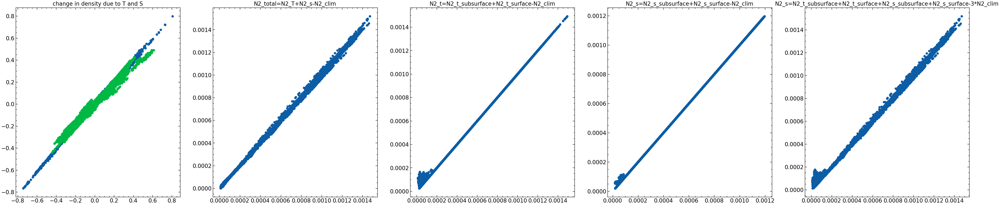

In [64]:
fig,ax=plt.subplots(1,5,figsize=(50,10))
ax[0].scatter(rho0_prime_t+rho0_prime_s,r_all_xr['rho'][:,dep01:dep02].mean('depth')-clim_r_all_xr[:,dep01:dep02].mean('depth'))
ax[0].scatter(rho0_prime_t1+rho0_prime_s1,r_all_xr['rho'][:,dep1:dep2].mean('depth')-clim_r_all_xr[:,dep1:dep2].mean('depth'))
ax[0].set_title('change in density due to T and S')

ax[1].scatter(N2_1,N2_t+N2_s-N2_clim)
ax[1].set_title('N2_total=N2_T+N2_s-N2_clim')

ax[2].scatter(N2_t,N2_t1+N2_t2-N2_clim)
ax[2].set_title('N2_t=N2_t_subsurface+N2_t_surface-N2_clim')

ax[3].scatter(N2_s,N2_s1+N2_s2-N2_clim)
ax[3].set_title('N2_s=N2_s_subsurface+N2_s_surface-N2_clim')

ax[4].scatter(N2_1,N2_t1+N2_t2+N2_s1+N2_s2-3*N2_clim)
ax[4].set_title('N2_s=N2_t_subsurface+N2_t_surface+N2_s_subsurface+N2_s_surface-3*N2_clim')

In [65]:
### N Computation from N2#################################
N_1=np.sqrt(N2_1)
N_t=np.sqrt(N2_t);N_t1=np.sqrt(N2_t1);N_t2=np.sqrt(N2_t2);N_clim=np.sqrt(N2_clim)
N_s=np.sqrt(N2_s);N_s1=np.sqrt(N2_s1);N_s2=np.sqrt(N2_s2)
N_2=np.sqrt(N2_2);

/tmp/ipykernel_141805/3136920818.py:5: RuntimeWarning: invalid value encountered in sqrt
  N_2=np.sqrt(N2_2);


Text(0.5, 1.0, 'Relation between MLD and N2 -0.950')

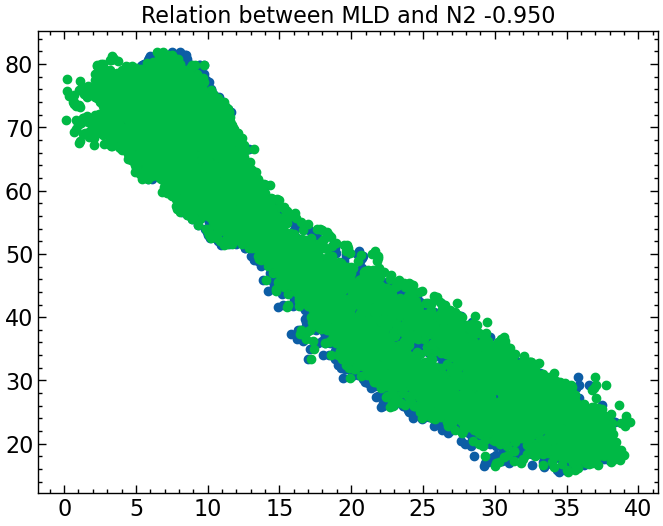

In [66]:
####################Plot ###########################################################
fig,ax = plt.subplots(1,1)

ax.scatter(N_1*10**3,df_mld['ts'])
ax.scatter(N_2*10**3,df_mld['ts'])
ax.set_title('Relation between MLD and N2 %.3f'%(np.corrcoef(N_1*10**3,df_mld['ts'])[0,1]))

In [67]:
################################### Climatology anomaly in  N and ustar ###########################
def stat_all2(sst_necs_ts,cs=0):
    t = np.arange(date(1994,1,1).toordinal(),date(2015,12,31).toordinal()+1)
    mhws, clim = mhw.detect(t, sst_necs_ts,climatologyPeriod=[1994,2015],coldSpells=cs)
    df111= pd.DataFrame(mhws)
    ts_df = pd.DataFrame(sst_necs_ts,index=pd.date_range('1994-01-01','2015-12-31'),columns=['ts'])
    clim_df = pd.DataFrame(clim['seas'],index=pd.date_range('1994-01-01','2015-12-31'),columns=['seas'])
    perc_df = pd.DataFrame(clim['thresh'],index=pd.date_range('1994-01-01','2015-12-31'),columns=['thresh'])
    
    extreme_flag1 = np.zeros(len(t))
    extreme_flag1 = pd.DataFrame(extreme_flag1, index=pd.date_range('1994-01-01','2015-12-31'))
    extreme_flag1.columns=['extreme_flag1']
    
    for i in range(len(df111)):
        extreme_flag1.loc[df111.iloc[i,3]:df111.iloc[i,4]] = 1.0  
        
    if cs==0:
        extreme_flag2 = (ts_df.values>=perc_df.values)*1
    else:
        extreme_flag2 = (ts_df.values<=perc_df.values)*1
        
    extreme_flag2 = pd.DataFrame(extreme_flag2, index=pd.date_range('1994-01-01','2015-12-31'))
    extreme_flag2.columns=['extreme_flag2']
    
    return df111, pd.concat([ts_df,clim_df,perc_df,extreme_flag1,extreme_flag2],axis=1)

#####################################################################################################################
#####################################################################################################################
#######################################################################################

### N and u*3/2####################################################################################################
df111_N,df_N         = stat_all2(N_1)
df111_N_t,df_N_t     = stat_all2(N_t);  df111_N_t1,df_N_t1 = stat_all2(N_t1);  df111_N_t2,df_N_t2 = stat_all2(N_t2);  df111_N_clim,df_N_clim = stat_all2(N_clim);
df111_N_s,df_N_s     = stat_all2(N_s);  df111_N_s1,df_N_s1 = stat_all2(N_s1);  df111_N_s2,df_N_s2 = stat_all2(N_s2);
df111_ustar,df_ustar = stat_all2(df_wspd['ts'].values**(3/2))
# df111_ustar_N,df_ustar_N = stat_all2(df_wspd['ts'].values**(3/2)/df_N['ts'].values)

In [68]:
############ Again Filtering ##################################
df_N['ts_filtered'] = filter_signal_scipy(df_N['ts']-df_N['seas'],fs=1,highcut=30,lowcut=90,keep_mean_no=0)
################################################### T effect ###########################
df_N_t['ts_filtered'] = filter_signal_scipy(df_N_t['ts']-df_N_t['seas'],fs=1,highcut=30,lowcut=90,keep_mean_no=0)
df_N_t1['ts_filtered'] = filter_signal_scipy(df_N_t1['ts']-df_N_t1['seas'],fs=1,highcut=30,lowcut=90,keep_mean_no=0)
df_N_t2['ts_filtered'] = filter_signal_scipy(df_N_t2['ts']-df_N_t2['seas'],fs=1,highcut=30,lowcut=90,keep_mean_no=0)
################################################### S effect ###########################

df_N_s['ts_filtered'] = filter_signal_scipy(df_N_s['ts']-df_N_s['seas'],fs=1,highcut=30,lowcut=90,keep_mean_no=0)
df_N_s1['ts_filtered'] = filter_signal_scipy(df_N_s1['ts']-df_N_s1['seas'],fs=1,highcut=30,lowcut=90,keep_mean_no=0)
df_N_s2['ts_filtered'] = filter_signal_scipy(df_N_s2['ts']-df_N_s2['seas'],fs=1,highcut=30,lowcut=90,keep_mean_no=0)
################################################### U star effect ###########################
df_ustar['ts_filtered'] = filter_signal_scipy(df_ustar['ts']-df_ustar['seas'],fs=1,highcut=30,lowcut=90,keep_mean_no=0)

Text(0.5, 1.0, "Ns'=(Ns+NT)subsurf'+(Ns+NT)Surf'")

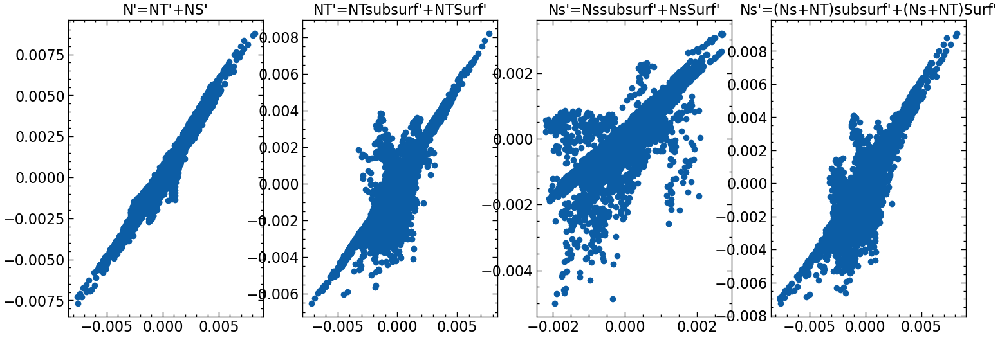

In [69]:
fig,ax  = plt.subplots(1,4,figsize=(18,6))

ax[0].scatter(df_N['ts']-df_N['seas'],(df_N_s['ts']-df_N_s['seas']+df_N_t['ts']-df_N_t['seas']))
ax[0].set_title("N'=NT'+NS'")

ax[1].scatter(df_N_t['ts']-df_N_t['seas'],df_N_t1['ts']-df_N_t1['seas']+df_N_t2['ts']-df_N_t2['seas'])
ax[1].set_title("NT'=NTsubsurf'+NTSurf'")

ax[2].scatter(df_N_s['ts']-df_N_s['seas'],df_N_s1['ts']-df_N_s1['seas']+df_N_s2['ts']-df_N_s2['seas']-(df_N_clim['ts']-df_N_clim['seas']))
ax[2].set_title("Ns'=Nssubsurf'+NsSurf'")

ax[3].scatter(df_N['ts']-df_N['seas'],df_N_t1['ts']-df_N_t1['seas']+df_N_t2['ts']-df_N_t2['seas']+df_N_s1['ts']-df_N_s1['seas']+df_N_s2['ts']-df_N_s2['seas']-2*(df_N_clim['ts']-df_N_clim['seas']))
ax[3].set_title("Ns'=(Ns+NT)subsurf'+(Ns+NT)Surf'")

## Defining Scaling parameter

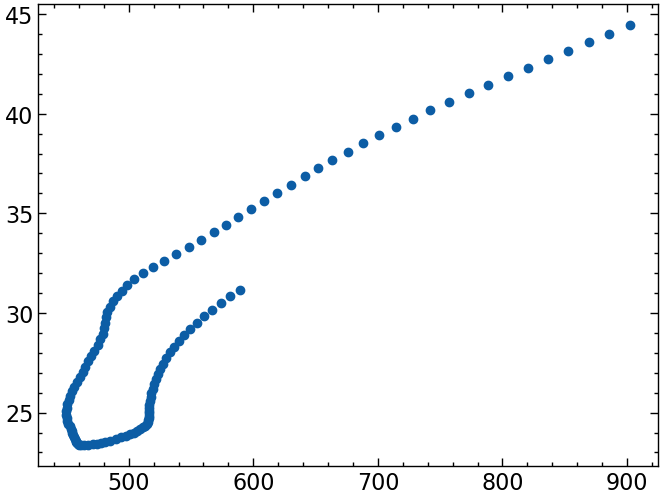

In [70]:
########## Fitting h = m(ustar/N)+c  ###############################################
N_clim_jjas         = df_N['seas'][151:273].values      ## independent N
u_star_clim_jjas    = df_ustar['seas'][151:273].values  ## independent u*
scaling_param_jjas  = (u_star_clim_jjas/N_clim_jjas)    ## independent u*/N
mld_clim_jjas       = df_mld['seas'][151:273].values   ## dependent(h)
plt.scatter(scaling_param_jjas,mld_clim_jjas)

### Plotting Climatology of all variables h, u, N and scaling parameter 

<Figure size 4000x1000 with 0 Axes>

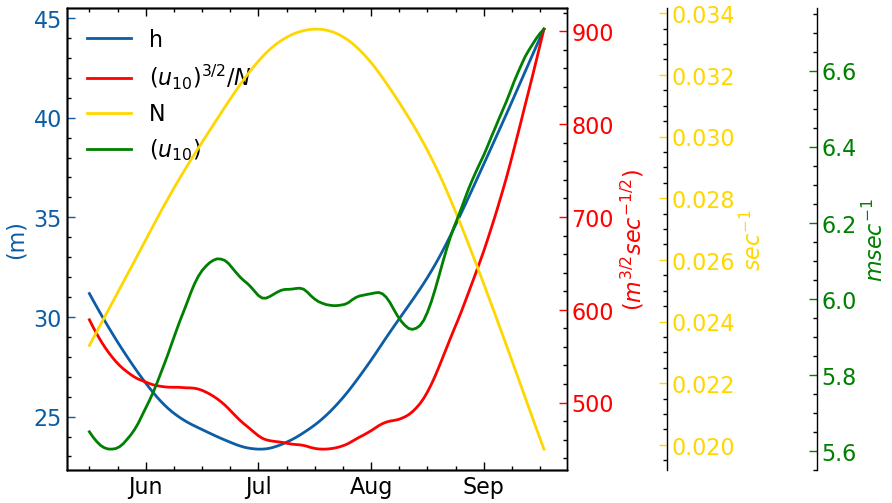

In [71]:
#####################################################################################
import matplotlib.pyplot as plt
plt.figure(figsize=(40,10))
fig, ax = plt.subplots()
fig.subplots_adjust(right=0.75)

twin1 = ax.twinx()
twin2 = ax.twinx()
twin3 = ax.twinx()
# Offset the right spine of twin2.  The ticks and label have already been
# placed on the right by twinx above.
twin2.spines.right.set_position(("axes", 1.2))
twin3.spines.right.set_position(("axes", 1.5))

p1, = ax.plot(df_N['seas'][151:273].index,mld_clim_jjas, "C0", label="h")
p2, = twin1.plot(df_N['seas'][151:273].index,scaling_param_jjas, "r", label="$(u_{10})^{3/2}/N$")
p3, = twin2.plot(df_N['seas'][151:273].index,N_clim_jjas, "gold", label="N")
p4, = twin3.plot(df_N['seas'][151:273].index,df_wspd['seas'][151:273], "green", label="$(u_{10})$")

fmt = mdates.DateFormatter('%-b')
ax.set_xticks(df_N['seas'][151:273].index[15::30])
ax.xaxis.set_major_formatter(fmt)

# ax.set(xlim=(0, 2), ylim=(0, 2), xlabel="Distance", ylabel="Density")
# twin1.set(ylim=(0, 4), ylabel="Temperature")
# twin2.set(ylim=(1, 65), ylabel="Velocity")

ax.yaxis.label.set_color(p1.get_color())
twin1.yaxis.label.set_color(p2.get_color())
twin2.yaxis.label.set_color(p3.get_color())
twin3.yaxis.label.set_color(p4.get_color())

ax.tick_params(axis='y', colors=p1.get_color())
twin1.tick_params(axis='y', colors=p2.get_color())
twin2.tick_params(axis='y', colors=p3.get_color())
twin3.tick_params(axis='y', colors=p4.get_color())

ax.set_ylabel("(m)",color=p1.get_color())
twin1.set_ylabel("($m^{3/2}sec^{-1/2}$)",color=p2.get_color())
twin2.set_ylabel("$sec^{-1}$",color=p3.get_color())
twin3.set_ylabel("$m sec^{-1}$",color=p4.get_color())

# twin1.tick_params(axis='y', colors=p2.get_color())
# twin2.tick_params(axis='y', colors=p3.get_color())
# twin3.tick_params(axis='y', colors=p4.get_color())
ax.legend(handles=[p1, p2, p3,p4])



## Scaling 
$h\approx u^*/N \approx (u_{10})^{3/2}/N$

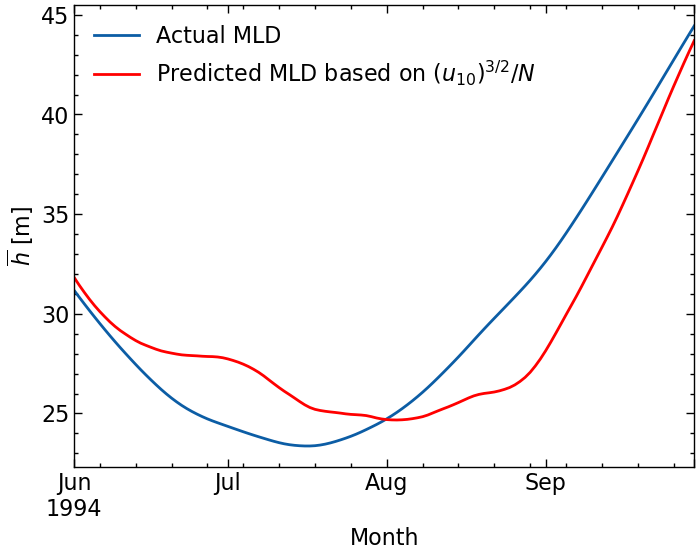

In [72]:
###### Fitting a Linear Model to Predict MLD ##########
from scipy import stats 
def predict_mld(scaling_param):
    m,c,r,_,_=stats.linregress(scaling_param_jjas,mld_clim_jjas)
    return m*scaling_param+c

##### Plot Example ######
wn = 1
pr_mld = predict_mld(df_ustar['ts'].rolling(wn).mean()/df_N['ts'].rolling(wn).mean())
pr_mld[pr_mld>60]=60
ax=plt.axes()
###############################
df111_pr_mld,df_pr_mld = stat_all2(pr_mld.values)
df_pr_mld['ts_filtered'] = filter_signal_scipy(df_pr_mld['ts']-df_pr_mld['seas'],fs=1,highcut=30,lowcut=90,keep_mean_no=0)

############################################ Plot actual and predicted MLD ##################################
# df_mld['ts'].loc[(df_ustar.index.month>=6)&(df_ustar.index.month<=9)][0:122].plot(ax=ax)
df_mld['seas'].loc[(df_ustar.index.month>=6)&(df_ustar.index.month<=9)][0:122].plot(ax=ax,label='Actual MLD')

# df_pr_mld['ts'].loc[(df_ustar.index.month>=6)&(df_ustar.index.month<=9)][0:122].plot(ax=ax)
df_pr_mld['seas'].loc[(df_ustar.index.month>=6)&(df_ustar.index.month<=9)][0:122].plot(ax=ax,color='r',label='Predicted MLD based on $(u_{10})^{3/2}/N$')
plt.xlabel('Month')
plt.ylabel('$\overline{h}$ [m]')
plt.legend()
##############################################################################################################

[[1.         0.43002837]
 [0.43002837 1.        ]]


9.43709906258365

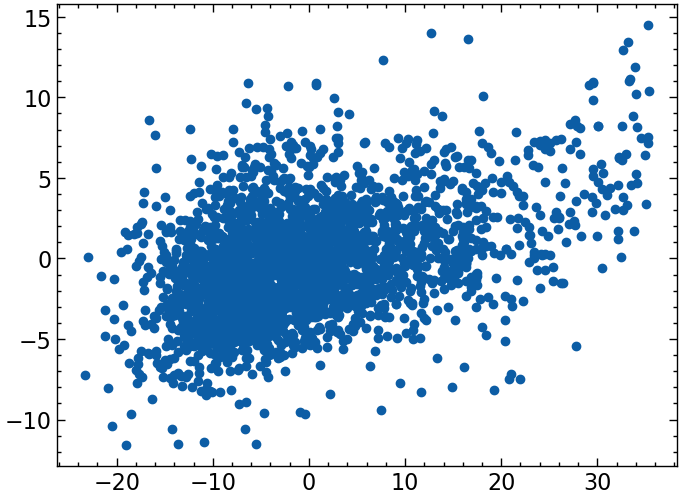

In [73]:
from sklearn.metrics import mean_squared_error
plt.scatter((df_pr_mld['ts']-df_pr_mld['seas'])[(df_pr_mld.index.month>5)&(df_pr_mld.index.month<10)],(df_mld['ts']-df_mld['seas'])[(df_mld.index.month>5)&(df_mld.index.month<10)])
print(np.corrcoef((df_pr_mld['ts']-df_pr_mld['seas'])[(df_pr_mld.index.month>5)&(df_pr_mld.index.month<10)],(df_mld['ts']-df_mld['seas'])[(df_mld.index.month>5)&(df_mld.index.month<10)]))
mean_squared_error((df_pr_mld['ts']-df_pr_mld['seas'])[(df_pr_mld.index.month>5)&(df_pr_mld.index.month<10)],(df_mld['ts']-df_mld['seas'])[(df_mld.index.month>5)&(df_mld.index.month<10)], squared=False)


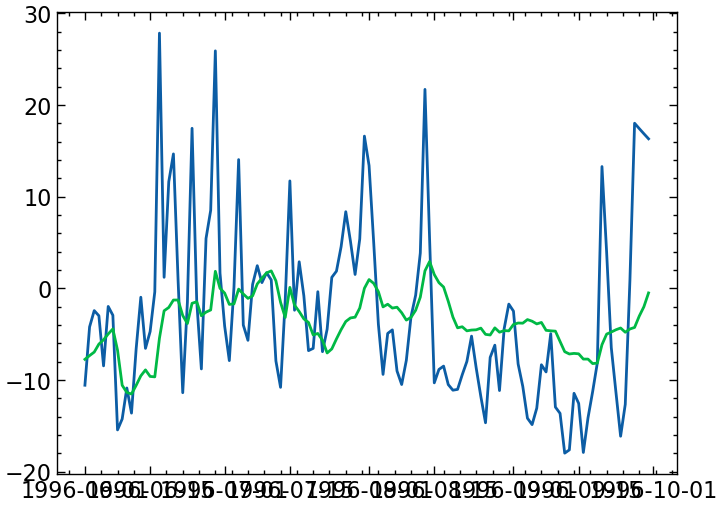

In [74]:
plt.plot((df_pr_mld['ts']-df_pr_mld['seas'])[(df_pr_mld.index.month>5)&(df_pr_mld.index.month<10)][244:366])
plt.plot((df_mld['ts']-df_mld['seas'])[(df_mld.index.month>5)&(df_mld.index.month<10)][244:366])

## Partitioning h prime into 3 component 

In [75]:
##### Equation 1 three terms #########################
def calc_contribution_h_variation2(st,et,x,y,y_t,y_t1,y_t2,y_s,y_s1,y_s2): ### (A-mean(A))/mean(A)
    
    x          = x.rolling(wn).mean().loc[st_dates_jja.iloc[i]:pk_dates_jja.iloc[i]].mean() ### u*
    y          = y.rolling(wn).mean().loc[st_dates_jja.iloc[i]:pk_dates_jja.iloc[i]].mean()   #### N*
    y_t        = y_t.rolling(wn).mean().loc[st_dates_jja.iloc[i]:pk_dates_jja.iloc[i]].mean()
    y_t1       = y_t1.rolling(wn).mean().loc[st_dates_jja.iloc[i]:pk_dates_jja.iloc[i]].mean()
    y_t2       = y_t2.rolling(wn).mean().loc[st_dates_jja.iloc[i]:pk_dates_jja.iloc[i]].mean()
    
    y_s        = y_s.rolling(wn).mean().loc[st_dates_jja.iloc[i]:pk_dates_jja.iloc[i]].mean()
    y_s1       = y_s1.rolling(wn).mean().loc[st_dates_jja.iloc[i]:pk_dates_jja.iloc[i]].mean()
    y_s2       = y_s2.rolling(wn).mean().loc[st_dates_jja.iloc[i]:pk_dates_jja.iloc[i]].mean()

    x_bar   = x['seas']
    x_prime = x['ts']-x['seas']
    
    y_bar   = y['seas']
    y_prime = y['ts']-y['seas']
    
    y_t_bar   = y_t['seas']
    y_t_prime = y_t['ts']-y_t['seas']
    
    y_t1_bar   = y_t1['seas']
    y_t1_prime = y_t1['ts']-y_t1['seas']
    
    y_t2_bar   = y_t2['seas']
    y_t2_prime = y_t2['ts']-y_t2['seas']
    
    y_s_bar   = y_s['seas']
    y_s_prime = y_s['ts']-y_s['seas']
    
    y_s1_bar   = y_s1['seas']
    y_s1_prime = y_s1['ts']-y_t1['seas']
    
    y_s2_bar   = y_s2['seas']
    y_s2_prime = y_s2['ts']-y_t2['seas']
    
    clim_scaling_param = x_bar/y_bar
    clim_pr_mld        = predict_mld(clim_scaling_param)
    
    
    term1 = predict_mld(clim_scaling_param +x_prime/y_bar)-clim_pr_mld
    term2 = predict_mld(clim_scaling_param +-1*((y_prime*x_bar)/(y_bar)**2))-clim_pr_mld
    term3 = predict_mld(clim_scaling_param +-1*((x_prime*y_prime)/(y_bar)**2))-clim_pr_mld
    
    print(x_prime,-1*(y_prime*x_bar),-1*(x_prime*y_prime))
    
    term4 = predict_mld(clim_scaling_param +-1*((y_t_prime*x_bar)/(y_t_bar)**2))-clim_pr_mld
    term41 = predict_mld(clim_scaling_param +-1*((y_t1_prime*x_bar)/(y_t1_bar)**2))-clim_pr_mld
    term42 = predict_mld(clim_scaling_param +-1*((y_t2_prime*x_bar)/(y_t2_bar)**2))-clim_pr_mld
    
    
    term5 = predict_mld(clim_scaling_param +-1*((y_s_prime*x_bar)/(y_s_bar)**2))-clim_pr_mld
    term51 = predict_mld(clim_scaling_param +-1*((y_s1_prime*x_bar)/(y_s1_bar)**2))-clim_pr_mld
    term52 = predict_mld(clim_scaling_param +-1*((y_s2_prime*x_bar)/(y_s2_bar)**2))-clim_pr_mld
    
    
    
    return term1,term2,term3,term4,term41,term42,term5,term51,term52

##### Equation 1 three terms #########################
def calc_contribution_h_variation3(st,et,x,y,y_t,y_t1,y_t2,y_s,y_s1,y_s2): ### (A-mean(A))/mean(A)
    
    x         = x.rolling(wn).mean().loc[st_dates_jja.iloc[i]:pk_dates_jja.iloc[i]].mean() ### u*
    y         = y.rolling(wn).mean().loc[st_dates_jja.iloc[i]:pk_dates_jja.iloc[i]].mean()   #### N*
    y_t       = y_t.rolling(wn).mean().loc[st_dates_jja.iloc[i]:pk_dates_jja.iloc[i]].mean()
    y_t1       = y_t1.rolling(wn).mean().loc[st_dates_jja.iloc[i]:pk_dates_jja.iloc[i]].mean()
    y_t2       = y_t2.rolling(wn).mean().loc[st_dates_jja.iloc[i]:pk_dates_jja.iloc[i]].mean()
    
    y_s        = y_s.rolling(wn).mean().loc[st_dates_jja.iloc[i]:pk_dates_jja.iloc[i]].mean()
    y_s1       = y_s1.rolling(wn).mean().loc[st_dates_jja.iloc[i]:pk_dates_jja.iloc[i]].mean()
    y_s2       = y_s2.rolling(wn).mean().loc[st_dates_jja.iloc[i]:pk_dates_jja.iloc[i]].mean()

    x_bar   = x['seas']
    x_prime = x['ts_filtered']#-x['seas']
    
    y_bar   = y['seas']
    y_prime = y['ts_filtered']#-y['seas']
    
    y_t_bar   = y_t['seas']
    y_t_prime = y_t['ts_filtered']#-y_t['seas']
    
    y_t1_bar   = y_t1['seas']
    y_t1_prime = y_t1['ts_filtered']#-y_t1['seas']
    
    y_t2_bar   = y_t2['seas']
    y_t2_prime = y_t2['ts_filtered']#-y_t2['seas']
    
    y_s_bar   = y_s['seas']
    y_s_prime = y_s['ts_filtered']#-y_s['seas']
    
    y_s1_bar   = y_s1['seas']
    y_s1_prime = y_s1['ts_filtered']#-y_t1['seas']
    
    y_s2_bar   = y_s2['seas']
    y_s2_prime = y_s2['ts_filtered']#-y_t2['seas']
    
    clim_scaling_param = x_bar/y_bar
    clim_pr_mld        = predict_mld(clim_scaling_param)
    
    
    term1 = predict_mld(clim_scaling_param +x_prime/y_bar)-clim_pr_mld
    term2 = predict_mld(clim_scaling_param +-1*((y_prime*x_bar)/(y_bar)**2))-clim_pr_mld
    term3 = predict_mld(clim_scaling_param +-1*((x_prime*y_prime)/(y_bar)**2))-clim_pr_mld
    
    print(x_prime,-1*(y_prime*x_bar),-1*(x_prime*y_prime))
    
    term4 = predict_mld(clim_scaling_param +-1*((y_t_prime*x_bar)/(y_t_bar)**2))-clim_pr_mld
    term41 = predict_mld(clim_scaling_param +-1*((y_t1_prime*x_bar)/(y_t1_bar)**2))-clim_pr_mld
    term42 = predict_mld(clim_scaling_param +-1*((y_t2_prime*x_bar)/(y_t2_bar)**2))-clim_pr_mld
    
    
    term5 = predict_mld(clim_scaling_param +-1*((y_s_prime*x_bar)/(y_s_bar)**2))-clim_pr_mld
    term51 = predict_mld(clim_scaling_param +-1*((y_s1_prime*x_bar)/(y_s1_bar)**2))-clim_pr_mld
    term52 = predict_mld(clim_scaling_param +-1*((y_s2_prime*x_bar)/(y_s2_bar)**2))-clim_pr_mld
    
    
    
    return term1,term2,term3,term4,term41,term42,term5,term51,term52

In [76]:
st_dates = pd.Series(df111_sst['date_start'])-pd.Timedelta('7D')
pk_dates = pd.Series(df111_sst['date_peak'])

st_dates = pd.to_datetime(st_dates)
pk_dates = pd.to_datetime(pk_dates)

st_dates_jja = st_dates.loc[(pk_dates.dt.month>=6)&(pk_dates.dt.month<=9)]
pk_dates_jja = pk_dates.loc[(pk_dates.dt.month>=6)&(pk_dates.dt.month<=9)]


B_prime = np.zeros((len(st_dates_jja),11))

for i in range(len(st_dates_jja)):
    term1,term2,term3,term4,term41,term42,term5,term51,term52= calc_contribution_h_variation2(st_dates_jja.iloc[i],pk_dates_jja.iloc[i],x=df_ustar,y=df_N,y_t=df_N_t,y_t1=df_N_t1,y_t2=df_N_t2,y_s=df_N_s,y_s1=df_N_s1,y_s2=df_N_s2)    
    mmaip_actual    = df_mld.loc[st_dates_jja.iloc[i]:pk_dates_jja.iloc[i]].mean(axis=0)
    mmaip_predicted = df_pr_mld.loc[st_dates_jja.iloc[i]:pk_dates_jja.iloc[i]].mean(axis=0)

    B_prime[i,0] = mmaip_actual['ts']-mmaip_actual['seas']
    B_prime[i,1] = mmaip_predicted['ts']-mmaip_predicted['seas']
    B_prime[i,2]= term1
    B_prime[i,3]= term2
    B_prime[i,4]= term3
    B_prime[i,5]= term4 
    B_prime[i,6]= term5
    B_prime[i,7]= term41
    B_prime[i,8]= term42
    B_prime[i,9]= term51
    B_prime[i,10]=term52
# df_additional_terms = pd.DataFrame(A_prime,columns=additional_terms,index=pk_dates_jja.dt.strftime('%Y-%m-%d').values)


-1.9727764013763984 -0.0584761209836003 0.007572331039077575
-4.682896321013953 -0.09500036806099021 0.026651465484918462
-4.98138416783817 0.002417289060301 -0.000802689040733036
-0.15684865954439964 -0.047504520540384114 0.0004863672917878124
-2.8300203809126536 -0.05856815273773864 0.010906280098478363
-5.253193040366488 -0.04478330800021292 0.014716658321659054
-4.5309872389908445 -0.09642685678227772 0.02691103694783887
0.9667840285169742 -0.03654779463200547 -0.002337628694969826
-2.7903817123059156 -0.0409315887995354 0.007562041371496483
-2.087471685531506 -0.003918752521319873 0.0006014071000303772
-3.199220083527461 -0.06662036620178345 0.013394088097563832
-4.905797495435731 0.010078456425662146 -0.003271989793783629
-0.09059589724007999 -0.00789128577960478 5.24279574983117e-05
-2.97337873769243 -0.008018194209653226 0.001690604331340089
-4.695036770732816 -0.04266431122070248 0.013260475752240741
-6.1089551715888835 0.010609749480664813 -0.004279961337197007
-2.52350802509

In [77]:
st_dates = pd.Series(df111_sst['date_start'])-pd.Timedelta('7D')
pk_dates = pd.Series(df111_sst['date_peak'])

st_dates = pd.to_datetime(st_dates)
pk_dates = pd.to_datetime(pk_dates)

st_dates_jja = st_dates.loc[(pk_dates.dt.month>=6)&(pk_dates.dt.month<=9)]
pk_dates_jja = pk_dates.loc[(pk_dates.dt.month>=6)&(pk_dates.dt.month<=9)]


IB_prime = np.zeros((len(st_dates_jja),11))

for i in range(len(st_dates_jja)):
    term1,term2,term3,term4,term41,term42,term5,term51,term52= calc_contribution_h_variation3(st_dates_jja.iloc[i],pk_dates_jja.iloc[i],x=df_ustar,y=df_N,y_t=df_N_t,y_t1=df_N_t1,y_t2=df_N_t2,y_s=df_N_s,y_s1=df_N_s1,y_s2=df_N_s2)    
    mmaip_actual    = df_mld.loc[st_dates_jja.iloc[i]:pk_dates_jja.iloc[i]].mean(axis=0)
    mmaip_predicted = df_pr_mld.loc[st_dates_jja.iloc[i]:pk_dates_jja.iloc[i]].mean(axis=0)

    IB_prime[i,0] = mmaip_actual['ts_filtered']
    IB_prime[i,1] = mmaip_predicted['ts_filtered']#-mmaip_predicted['seas']
    IB_prime[i,2]=term1
    IB_prime[i,3]=term2
    IB_prime[i,4]=term3
    IB_prime[i,5]=term4 
    IB_prime[i,6]=term5
    IB_prime[i,7]=term41
    IB_prime[i,8]=term42
    IB_prime[i,9]= term51
    IB_prime[i,10]=term52
# df_additional_terms = pd.DataFrame(A_prime,columns=additional_terms,index=pk_dates_jja.dt.strftime('%Y-%m-%d').values)


-1.7371652529424717 -0.022231007555515516 0.002534973664123351
-0.8152915435856481 -0.0022690761874630365 0.00011082641372967347
-4.5204974818981984 -0.0015324373268362861 0.00046178270602351015
-0.8902842896605974 -0.022745202724521508 0.0013218042136170205
0.6686998830048464 -0.001818576583623072 -8.001813030822948e-05
-3.424281945094784 -0.002161181621651201 0.00046294613006479205
0.2546608558896602 -0.013930889536088599 -0.0002185146837636147
1.0267092459446638 -0.0032599118224013054 -0.00022143089359658052
-0.6412340510308566 -0.002276602571432972 9.665417716030685e-05
-1.1953238731088787 -0.014431106980682548 0.0012681930227518715
-0.3246566961458241 -0.015145507849497974 0.00030900835578620924
-2.0364330503033163 -0.019034144692789412 0.00256514431700772
-0.8358059400341357 -0.0005835358635265113 3.5766763460932226e-05
-1.5150449294736132 -0.011351789637841087 0.0012195651945821676
-2.6548336887644814 -0.013510241373718142 0.0023744104627408972
-3.8570168659575943 -0.00116271563

In [78]:
# h_terms2 = ['',r'$h^{\prime}$',r'$f(\frac{((u_{10})^{3/2})^{\prime}}{\overline{N}})$',
#             r'$f(\frac{(N^{\prime}) (\overline{(u_{10})^{3/2}})}{\overline{N}^2})$',
#             r'$f(\frac{N^{\prime} ((u_{10})^{3/2})^{\prime}}{\overline{N}^2})$',
#             r'$f(\frac{(N_t^{\prime}) (\overline{(u_{10})^{3/2}})}{\overline{N}^2})$',
#             r'$f(\frac{(N_s^{\prime}) (\overline{(u_{10})^{3/2}})}{\overline{N}^2})$',
#             r'$N_t-subsurf^{\prime})$','T2','S1','S2']
h_terms2 = ['',r'$h^{\prime}$',r'$f((u_{10}^{3/2})^{\prime},\overline{N})$',
            r'$f(N^{\prime},\overline{(u_{10})^{3/2}})$',
            r'$f(N^{\prime},((u_{10})^{3/2})^{\prime})$',
            r'$f(N_t^{\prime},\overline{(u_{10})^{3/2}})$',
            r'$f(N_s^{\prime},\overline{(u_{10})^{3/2}})$',
            r'$f(N_{t-lower}^{\prime},\overline{(u_{10})^{3/2}})$',
            r'$f(N_{t-upper}^{\prime},\overline{(u_{10})^{3/2}})$',
            r'$f(N_{s-lower}^{\prime},\overline{(u_{10})^{3/2}})$',
            r'$f(N_{s-upper}^{\prime},\overline{(u_{10})^{3/2}})$']

In [136]:
h_terms2 = ['',r'$h^{\prime}$',r'$h_{u^{*{\prime}},\overline{N}}$',
            r'$h_{\overline{u^*},N^{\prime}}$',
            r'$h_{u^{*\prime},N^{\prime}}$',
            r'$h_{\overline{u^*},N_T^{\prime}}$',
            r'$h_{\overline{u^*},N_S^{\prime}}$',
            r'$h_{\overline{u^*},N_{T-lower}^{\prime}}$',
            r'$h_{\overline{u^*},N_{T-upper}^{\prime}}$',
            r'$h_{\overline{u^*},N_{S-lower}^{\prime}}$',
            r'$h_{\overline{u^*},N_{S-upper}^{\prime}}$']

Text(0, 0.5, 'MLD shallowing (m)')

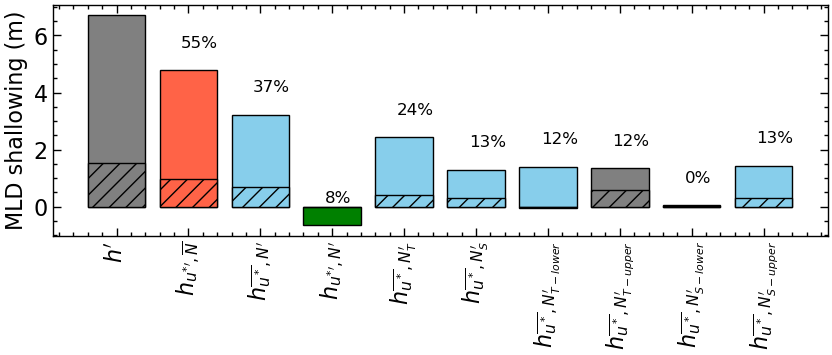

In [137]:
plt.figure(figsize=(10,3))
YY = B_prime[df_hatches.iloc[:,2]==1,:].mean(0)
YY1 = YY[1:]
colors= ['grey','tomato','skyblue','green','skyblue','skyblue','skyblue']

plt.bar(np.arange(len(YY1)),-1*YY1,edgecolor='k',color=colors)
plt.xticks(np.arange(len(YY1)),h_terms2[1:],rotation=90)

for i in range(1,4):
    plt.text(i-.1,-1*YY1[i]+0.8,'%.f'%np.round(100*np.abs(YY1[i])/(np.abs(YY1[1])+np.abs(YY1[2])+np.abs(YY1[3])),2)+'%',fontsize=12)

perc=[]
for i in range(4,6):
    plt.text(i-.1,-1*YY1[i]+0.8,'%.f'%np.round(100*np.abs(YY1[2])/(np.abs(YY1[1])+np.abs(YY1[2])+np.abs(YY1[3]))*np.abs(YY1[i])/(np.abs(YY1[4])+np.abs(YY1[5])),2)+'%',fontsize=12)
    perc.append(np.round(100*np.abs(YY1[2])/(np.abs(YY1[1])+np.abs(YY1[2])+np.abs(YY1[3]))*np.abs(YY1[i])/(np.abs(YY1[4])+np.abs(YY1[5])),2))

for i in range(6,8):
    plt.text(i-.1,-1*YY1[i]+0.8,'%.f'%np.round(perc[0]*np.abs(YY1[i])/(np.abs(YY1[6])+np.abs(YY1[7])),2)+'%',fontsize=12)
        

for i in range(8,10):
    plt.text(i-.1,-1*YY1[i]+0.8,'%.f'%np.round(perc[1]*np.abs(YY1[i])/(np.abs(YY1[8])+np.abs(YY1[9])),2)+'%',fontsize=12)
                
plt.ylabel('MLD shallowing (m)')
###########################################################################################
YY = IB_prime[df_hatches.iloc[:,2]==1,:].mean(0)
YY1 = YY[1:]
colors= ['grey','tomato','skyblue','green','skyblue','skyblue','skyblue']

plt.bar(np.arange(len(YY1)),-1*YY1,edgecolor='k',color=colors,hatch="//")
plt.xticks(np.arange(len(YY1)),h_terms2[1:],rotation=90)

plt.ylabel('MLD shallowing (m)')

# plt.savefig('jgrjdm_h_change.pdf',bbox_inches='tight')

[[1.         0.68967731]
 [0.68967731 1.        ]]


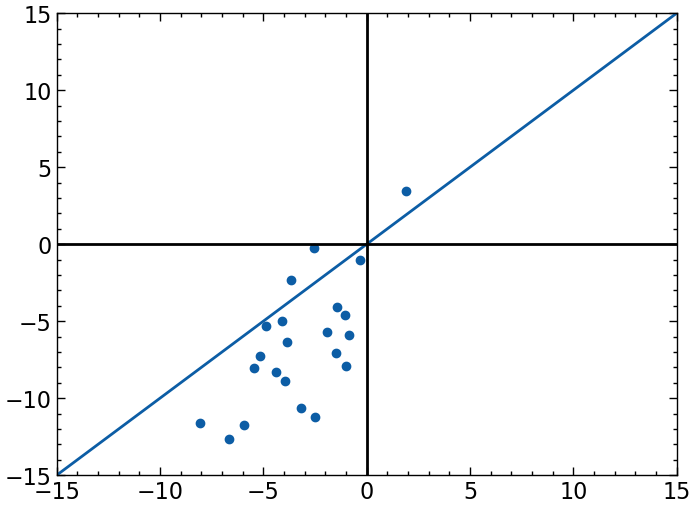

In [138]:
plt.scatter(B_prime[:,0],B_prime[:,1])
print(np.corrcoef(B_prime[:,0],B_prime[:,1]))
plt.xlim(-15,15)
plt.ylim(-15,15)
plt.plot(np.arange(-15,18,3),np.arange(-15,18,3))
plt.axhline(0,color='k')
plt.axvline(0,color='k')

Text(0.5, 1.0, '1999-Sep-MHWS-Event')

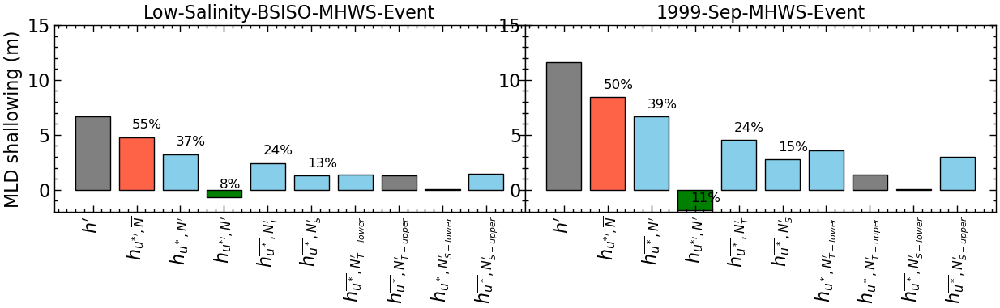

In [139]:
fig,ax = plt.subplots(1,2,figsize=(15,3))
# figure(figsize=(10,3))
fig.subplots_adjust(wspace=0)

YY = B_prime[df_hatches.iloc[:,2]==1,:].mean(0)
YY1 = YY[1:]
colors= ['grey','tomato','skyblue','green','skyblue','skyblue','skyblue']

ax[0].bar(np.arange(len(YY1)),-1*YY1,edgecolor='k',color=colors)
ax[0].set_xticks(np.arange(len(YY1)),h_terms2[1:],rotation=90)

for i in range(1,4):
    ax[0].text(i-.1,-1*YY1[i]+0.8,'%.f'%np.round(100*np.abs(YY1[i])/(np.abs(YY1[1])+np.abs(YY1[2])+np.abs(YY1[3])),2)+'%',fontsize=12)
    
for i in range(4,6):
    ax[0].text(i-.1,-1*YY1[i]+0.8,'%.f'%np.round(100*np.abs(YY1[2])/(np.abs(YY1[1])+np.abs(YY1[2])+np.abs(YY1[3]))*np.abs(YY1[i])/(np.abs(YY1[4])+np.abs(YY1[5])),2)+'%',fontsize=12)
    
ax[0].set_ylabel('MLD shallowing (m)')
ax[0].set_ylim(-2,15)
ax[0].set_title('Low-Salinity-BSISO-MHWS-Event')

YY = B_prime[6,:]
YY1 = YY[1:]
colors= ['grey','tomato','skyblue','green','skyblue','skyblue','skyblue']

ax[1].bar(np.arange(len(YY1)),-1*YY1,edgecolor='k',color=colors)
ax[1].set_xticks(np.arange(len(YY1)),h_terms2[1:],rotation=90)

for i in range(1,4):
    ax[1].text(i-.1,-1*YY1[i]+0.8,'%.f'%np.round(100*np.abs(YY1[i])/(np.abs(YY1[1])+np.abs(YY1[2])+np.abs(YY1[3])),2)+'%',fontsize=12)
    
for i in range(4,6):
    ax[1].text(i-.1,-1*YY1[i]+0.8,'%.f'%np.round(100*np.abs(YY1[2])/(np.abs(YY1[1])+np.abs(YY1[2])+np.abs(YY1[3]))*np.abs(YY1[i])/(np.abs(YY1[4])+np.abs(YY1[5])),2)+'%',fontsize=12)
ax[1].set_ylim(-2,15)
    
# ax[1].set_ylabel('MLD shallowing (m)')
ax[1].set_title('1999-Sep-MHWS-Event')
# plt.savefig('jgrjdm_h_change.pdf',bbox_inches='tight')

In [145]:
new_lab= 'SST_TEN','$NET$','ADV','ENT','DIFF','',r'$SW_{Q_{sw}^{\prime},\overline{h}}$',r'$SW_{\overline{Q_{sw}},h^{\prime}}$',r'$SW_{Q_{sw}^{\prime},h^{\prime}}$',r'$[SW_{Q_{sw}^{\prime},\overline{h}}]_{30-90}$',r'$[SW_{\overline{Q_{sw}},h^{\prime}}]_{30-90}$',r'$[SW_{Q_{sw}^{\prime},h^{\prime}}]_{30-90}$'

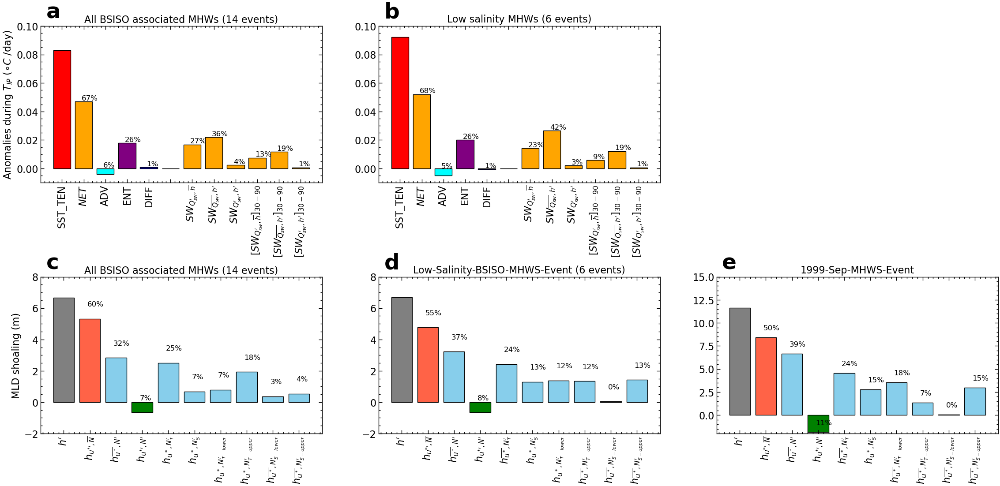

In [159]:
import string
####################################All terms Salinity EVENTS #############################
df_HB_mat_new=pd.concat([df_HB_mat,df_additional_terms],axis=1)
####################################All terms #############################
####### Mean Anomalies Associated with active MJO Phases #######
plt.rcParams['font.size']=60
fig = plt.figure(figsize=(28,12))
ax1  = fig.add_subplot(2,3, 1) 
XX = df_HB_mat_new.iloc[np.where(df_hatches.iloc[:,-1]==1)[0],:].mean(0)
XX1 = XX.iloc[[0,1,7,8,9,12,13,14,15,16,17,18]]
colors= ['r','orange','cyan','purple','blue','C0','orange','orange','orange','orange','orange','orange']
ax1.bar(np.arange(len(XX1)),XX1,edgecolor='k',color=colors)
# ax1.xticks(np.arange(12),np.array(name_HB1+additional_terms)[[0,1,7,8,9,12,13,14,15,16,17,18]],rotation=90)
# for i in range(1,5):
#     if (i == 2):
#         ax1.text(i-0.1,XX1[i]+0.005,'%.f'%(np.round(100*XX1[i]/XX1[0],0))+'%',fontsize=12)
#     elif (i == 5):
#         continue
#     else:    
#         ax1.text(i-0.1,XX1[i]+0.001,'%.f'%(np.round(100*XX1[i]/XX1[0],0))+'%',fontsize=12)
for i in range(1,5):
    if (i == 2):
        ax1.text(i-0.1,XX1[i]+0.005,'6'+'%',fontsize=12)
    elif (i == 5):
        continue
    else:    
        ax1.text(i-0.1,XX1[i]+0.001,'%.f'%(np.round(100*np.abs(XX1[i])/(XX1[1]+np.abs(XX1[2])+XX1[3]+XX1[4]),0))+'%',fontsize=12)


for i in range(6,9):
    ax1.text(i-0.1,XX1[i]+0.001,'%.f'%(np.round(.67*100*XX1[i]/(XX1[6]+XX1[7]+XX1[8]),0))+'%',fontsize=12)

ax1.text(9-0.1,XX1[9]+0.001,'%.f'%(np.round(.28*100*XX1[9]/(XX1[6]),0))+'%',fontsize=12)
ax1.text(10-0.1,XX1[10]+0.001,'%.f'%(np.round(.36*100*XX1[10]/(XX1[7]),0))+'%',fontsize=12)
ax1.text(11-0.1,XX1[11]+0.001,'%.f'%(np.round(.04*100*XX1[11]/(XX1[8]),0))+'%',fontsize=12)


# ax1.text(2.5, .06, r'$\left[\frac{Q_{\mathrm{net}}}{\rho c_P h}\right]^{\prime} \approx\left[\frac{Q_{\mathrm{sw}}}{\rho c_P h}\right]^{\prime} \approx \frac{Q_{\mathrm{sw}}^{\prime}}{\rho c_P \overline{h}}-\frac{h^{\prime} \overline{Q}_{\mathrm{sw}}}{\rho c_P \overline{h}^2}-\frac{h^{\prime} Q_{\mathrm{sw}}^{\prime}}{\rho c_P \overline{h}^2}$', fontsize = 22)
 
ax1.set_ylabel('Anomalies during $T_{IP}$ ($\circ C$ /day)')
ax1.set_title('All BSISO associated MHWs (14 events)')


ax1.set_xticks(np.arange(12),new_lab,rotation=90)


########################################
ax  = fig.add_subplot(2, 3, 2) 

XX = df_HB_mat_new.iloc[np.where(df_hatches.iloc[:,2]==1)[0],:].mean(0)
XX1 = XX.iloc[[0,1,7,8,9,12,13,14,15,16,17,18]]
colors= ['r','orange','cyan','purple','blue','C0','orange','orange','orange','orange','orange','orange']
ax.bar(np.arange(len(XX1)),XX1,edgecolor='k',color=colors)
# plt.xticks(np.arange(12),np.array(name_HB1+additional_terms)[[0,1,7,8,9,12,13,14,15,16,17,18]],rotation=90)
# for i in range(1,5):
#     if (i == 2):
#         plt.text(i-0.1,XX1[i]+0.005,'%.f'%(np.round(100*XX1[i]/XX1[0],0))+'%',fontsize=12)
#     elif (i == 5):
#         continue
#     else:    
#         plt.text(i-0.1,XX1[i]+0.001,'%.f'%(np.round(100*XX1[i]/XX1[0],0))+'%',fontsize=12)
for i in range(1,5):
    if (i == 2):
        ax.text(i-0.1,XX1[i]+0.005,'5'+'%',fontsize=12)
    elif (i == 5):
        continue
    else:    
        ax.text(i-0.1,XX1[i]+0.001,'%.f'%(np.round(100*np.abs(XX1[i])/(XX1[1]+np.abs(XX1[2])+XX1[3]+XX1[4]),0))+'%',fontsize=12)

        
for i in range(6,9):
    ax.text(i-0.1,XX1[i]+0.001,'%.f'%(np.round(.68*100*XX1[i]/(XX1[6]+XX1[7]+XX1[8]),0))+'%',fontsize=12)

ax.text(9-0.1,XX1[9]+0.001,'%.f'%(np.round(.23*100*XX1[9]/(XX1[6]),0))+'%',fontsize=12)
ax.text(10-0.1,XX1[10]+0.001,'%.f'%(np.round(.42*100*XX1[10]/(XX1[7]),0))+'%',fontsize=12)
ax.text(11-0.1,XX1[11]+0.001,'%.f'%(np.round(.03*100*XX1[11]/(XX1[8]),0))+'%',fontsize=12)

# ax.text(2.5, .075, r'$\left[\frac{Q_{\mathrm{net}}}{\rho c_P h}\right]^{\prime} \approx\left[\frac{Q_{\mathrm{sw}}}{\rho c_P h}\right]^{\prime} \approx \frac{Q_{\mathrm{sw}}^{\prime}}{\rho c_P \overline{h}}-\frac{h^{\prime} \overline{Q}_{\mathrm{sw}}}{\rho c_P \overline{h}^2}-\frac{h^{\prime} Q_{\mathrm{sw}}^{\prime}}{\rho c_P \overline{h}^2}$', fontsize = 22)
 
# ax.set_ylabel('Anomalies during $T_{IP}$ ($\circ C$ /day)')
ax.set_title('Low salinity MHWs (6 events)')


ax.set_xticks(np.arange(12),new_lab,rotation=90)
# ax.text(12+8.5,-2*10**-2,"$[Q_{sw,h}]_{30-90}$="+np.array(name_HB1+additional_terms)[18],fontsize=20)
# ax.text(12+8.5,0,"$[Q_{h}]_{30-90}$="+np.array(name_HB1+additional_terms)[17],fontsize=20)
# ax.text(12+8.5,2*10**-2,"$[Q_{sw}]_{30-90}$="+np.array(name_HB1+additional_terms)[16],fontsize=20)
# ax.text(12+8.5,4*10**-2,"$Q_{sw,h}$="+np.array(name_HB1+additional_terms)[15],fontsize=20)
# ax.text(12+8.5,6*10**-2,"$Q_{h}$="+np.array(name_HB1+additional_terms)[14],fontsize=20)
# ax.text(12+8.5,8*10**-2,"$Q_{sw}$="+np.array(name_HB1+additional_terms)[13],fontsize=20)
# # plt.text(12+5,19.5*10**-2,"G="+np.array(name_HB1+additional_terms)[12],fontsize=20)
# ax.text(12+0.5,0*10**-2,"DIFF="+np.array(name_HB1+additional_terms)[9],fontsize=20)
# ax.text(12+0.5,2*10**-2,"ENT="+np.array(name_HB1+additional_terms)[8],fontsize=20)
# ax.text(12+0.5,4*10**-2,"ADV="+np.array(name_HB1+additional_terms)[7],fontsize=20)
# ax.text(12+0.5,6*10**-2,"$Q$="+np.array(name_HB1+additional_terms)[1],fontsize=20)
# ax.text(12+0.5,8*10**-2,"SST_TEN="+np.array(name_HB1+additional_terms)[0],fontsize=20)
# plt.subplots_adjust(wspace=.2)
ax.text(0.02, 1.05, string.ascii_lowercase[1], transform=ax.transAxes,size=35, weight='bold')
ax1.text(0.02, 1.05, string.ascii_lowercase[0], transform=ax1.transAxes,size=35, weight='bold')

ax.set_ylim([-.01,.1])
ax1.set_ylim([-.01,.1])

###################################################################################################################
##################################################################################################################
###################################################################################################################
##################################################################################################################
ax  = fig.add_subplot(2, 3, 4) 

YY = B_prime[df_hatches.iloc[:,-1]==1,:].mean(0)
YY1 = YY[1:]
colors= ['grey','tomato','skyblue','green','skyblue','skyblue','skyblue','skyblue','skyblue','skyblue','skyblue']

ax.bar(np.arange(len(YY1)),-1*YY1,edgecolor='k',color=colors)
ax.set_xticks(np.arange(len(YY1)),h_terms2[1:],rotation=90)

for i in range(1,4):
    ax.text(i-.1,-1*YY1[i]+0.8,'%.f'%np.round(100*np.abs(YY1[i])/(np.abs(YY1[1])+np.abs(YY1[2])+np.abs(YY1[3])),2)+'%',fontsize=12)
    
perc=[]
for i in range(4,6):
    ax.text(i-.1,-1*YY1[i]+0.8,'%.f'%np.round(100*np.abs(YY1[2])/(np.abs(YY1[1])+np.abs(YY1[2])+np.abs(YY1[3]))*np.abs(YY1[i])/(np.abs(YY1[4])+np.abs(YY1[5])),2)+'%',fontsize=12)
    perc.append(np.round(100*np.abs(YY1[2])/(np.abs(YY1[1])+np.abs(YY1[2])+np.abs(YY1[3]))*np.abs(YY1[i])/(np.abs(YY1[4])+np.abs(YY1[5])),2))

for i in range(6,8):
    ax.text(i-.1,-1*YY1[i]+0.8,'%.f'%np.round(perc[0]*np.abs(YY1[i])/(np.abs(YY1[6])+np.abs(YY1[7])),2)+'%',fontsize=12)
        

for i in range(8,10):
    ax.text(i-.1,-1*YY1[i]+0.8,'%.f'%np.round(perc[1]*np.abs(YY1[i])/(np.abs(YY1[8])+np.abs(YY1[9])),2)+'%',fontsize=12)
                
ax.set_ylabel('MLD shoaling (m)')
ax.set_ylim(-2,8)
ax.set_title('All BSISO associated MHWs (14 events)')
ax.text(0.02, 1.05, string.ascii_lowercase[2], transform=ax.transAxes,size=35, weight='bold')

ax  = fig.add_subplot(2, 3, 5) 

YY = B_prime[df_hatches.iloc[:,2]==1,:].mean(0)
YY1 = YY[1:]
colors= ['grey','tomato','skyblue','green','skyblue','skyblue','skyblue','skyblue','skyblue','skyblue','skyblue']

ax.bar(np.arange(len(YY1)),-1*YY1,edgecolor='k',color=colors)
ax.set_xticks(np.arange(len(YY1)),h_terms2[1:],rotation=90)

for i in range(1,4):
    ax.text(i-.1,-1*YY1[i]+0.8,'%.f'%np.round(100*np.abs(YY1[i])/(np.abs(YY1[1])+np.abs(YY1[2])+np.abs(YY1[3])),2)+'%',fontsize=12)
    
perc=[]
for i in range(4,6):
    ax.text(i-.1,-1*YY1[i]+0.8,'%.f'%np.round(100*np.abs(YY1[2])/(np.abs(YY1[1])+np.abs(YY1[2])+np.abs(YY1[3]))*np.abs(YY1[i])/(np.abs(YY1[4])+np.abs(YY1[5])),2)+'%',fontsize=12)
    perc.append(np.round(100*np.abs(YY1[2])/(np.abs(YY1[1])+np.abs(YY1[2])+np.abs(YY1[3]))*np.abs(YY1[i])/(np.abs(YY1[4])+np.abs(YY1[5])),2))

for i in range(6,8):
    ax.text(i-.1,-1*YY1[i]+0.8,'%.f'%np.round(perc[0]*np.abs(YY1[i])/(np.abs(YY1[6])+np.abs(YY1[7])),2)+'%',fontsize=12)
        

for i in range(8,10):
    ax.text(i-.1,-1*YY1[i]+0.8,'%.f'%np.round(perc[1]*np.abs(YY1[i])/(np.abs(YY1[8])+np.abs(YY1[9])),2)+'%',fontsize=12)
                
# ax.set_ylabel('MLD shoaling (m)')
ax.set_ylim(-2,8)
ax.set_title('Low-Salinity-BSISO-MHWS-Event (6 events)')
ax.text(0.02, 1.05, string.ascii_lowercase[3], transform=ax.transAxes,size=35, weight='bold')

ax  = fig.add_subplot(2, 3, 6) 

YY = B_prime[6,:]
YY1 = YY[1:]
colors= ['grey','tomato','skyblue','green','skyblue','skyblue','skyblue','skyblue','skyblue','skyblue','skyblue']

ax.bar(np.arange(len(YY1)),-1*YY1,edgecolor='k',color=colors)
ax.set_xticks(np.arange(len(YY1)),h_terms2[1:],rotation=90)

for i in range(1,4):
    ax.text(i-.1,-1*YY1[i]+0.8,'%.f'%np.round(100*np.abs(YY1[i])/(np.abs(YY1[1])+np.abs(YY1[2])+np.abs(YY1[3])),2)+'%',fontsize=12)
    

    perc=[]
for i in range(4,6):
    ax.text(i-.1,-1*YY1[i]+0.8,'%.f'%np.round(100*np.abs(YY1[2])/(np.abs(YY1[1])+np.abs(YY1[2])+np.abs(YY1[3]))*np.abs(YY1[i])/(np.abs(YY1[4])+np.abs(YY1[5])),2)+'%',fontsize=12)
    perc.append(np.round(100*np.abs(YY1[2])/(np.abs(YY1[1])+np.abs(YY1[2])+np.abs(YY1[3]))*np.abs(YY1[i])/(np.abs(YY1[4])+np.abs(YY1[5])),2))

for i in range(6,8):
    ax.text(i-.1,-1*YY1[i]+0.8,'%.f'%np.round(perc[0]*np.abs(YY1[i])/(np.abs(YY1[6])+np.abs(YY1[7])),1)+'%',fontsize=12)
        

for i in range(8,10):
    ax.text(i-.1,-1*YY1[i]+0.8,'%.f'%np.round(perc[1]*np.abs(YY1[i])/(np.abs(YY1[8])+np.abs(YY1[9])),1)+'%',fontsize=12)
                
ax.set_ylim(-2,15)
    
# ax[1].set_ylabel('MLD shallowing (m)')
ax.set_title('1999-Sep-MHWS-Event')
ax.text(0.02, 1.05, string.ascii_lowercase[4], transform=ax.transAxes,size=35, weight='bold')

plt.subplots_adjust(hspace=0.6)
# plt.savefig('jgrjdm_figure3_contribution_all.png',bbox_inches='tight',dpi=150)
plt.savefig('jgrjdm_figure3_contribution_all.pdf',bbox_inches='tight',dpi=150)

## old one

In [83]:
# B_prime[:,4:6],np.where(df_hatches.iloc[:,2]==1)[0]
# plt.scatter(B_prime[:,0],B_prime[:,1])
np.corrcoef(B_prime[:,0],B_prime[:,1])

array([[1.        , 0.68967731],
       [0.68967731, 1.        ]])

# Computing continuous NT and NS

In [84]:
anom_s_all_xr= s_all_xr['salinity'].values-clim_s_all_xr.values
anom_t_all_xr= t_all_xr['water_temp'].values-clim_t_all_xr.values

### density due to only T and S anomaly####
rho_hycom_T                =   r_all_xr.copy()
rho_hycom_S                =   r_all_xr.copy()
rho_hycom_TS               =   r_all_xr.copy()

rho_hycom_T['rho'].values  =   gsw.density.sigma0(clim_s_all_xr.values,clim_t_all_xr.values+anom_t_all_xr)+1000
rho_hycom_S['rho'].values  =   gsw.density.sigma0(clim_s_all_xr.values+anom_s_all_xr,clim_t_all_xr.values)+1000
rho_hycom_TS['rho'].values =   gsw.density.sigma0(clim_s_all_xr.values,clim_t_all_xr.values)+1000

####### calculate continuous N2 #########################

dr = np.diff(sigma_all_xr.values,axis=1,append=np.nan);
dz = np.diff(np.abs(sigma_all_xr.depth.values),append=np.nan)
n2 = (9.8/1029)*(dr/dz)
n2[n2<0.0] = 0.0
n2_hycom = xr.Dataset({'n2': (('time','depth' ), n2)}, coords={'time': sigma_all_xr.time,'depth':sigma_all_xr.depth})


n2_hycom_t  = n2_hycom.copy()*1
n2_hycom_s  = n2_hycom.copy()*1
n2_hycom_ts = n2_hycom.copy()*1

for i in tqdm(range(t_all_xr['water_temp'].values.shape[0])):
    dr_t   = np.diff(rho_hycom_T['rho'].values[i,:].squeeze(),axis=0,append=np.nan);
    dr_s   = np.diff(rho_hycom_S['rho'].values[i,:].squeeze(),axis=0,append=np.nan);
    dr_ts  = np.diff(rho_hycom_TS['rho'].values[i,:].squeeze(),axis=0,append=np.nan);
    dz     = np.diff(np.abs(clim_t_all_xr.depth.values),append=np.nan)
    
    n2_t = (9.8/1029)*(dr_t/dz)
    n2_s = (9.8/1029)*(dr_s/dz)
    n2_ts = (9.8/1029)*(dr_ts/dz)
    
    n2_t[n2_t<0.0]=0.0
    n2_s[n2_s<0.0]=0.0
    n2_ts[n2_ts<0.0]=0.0
    
    n2_hycom_t['n2'].values[i,:]=n2_t
    n2_hycom_s['n2'].values[i,:]=n2_s
    n2_hycom_ts['n2'].values[i,:]=n2_ts

  0%|          | 0/8035 [00:00<?, ?it/s]

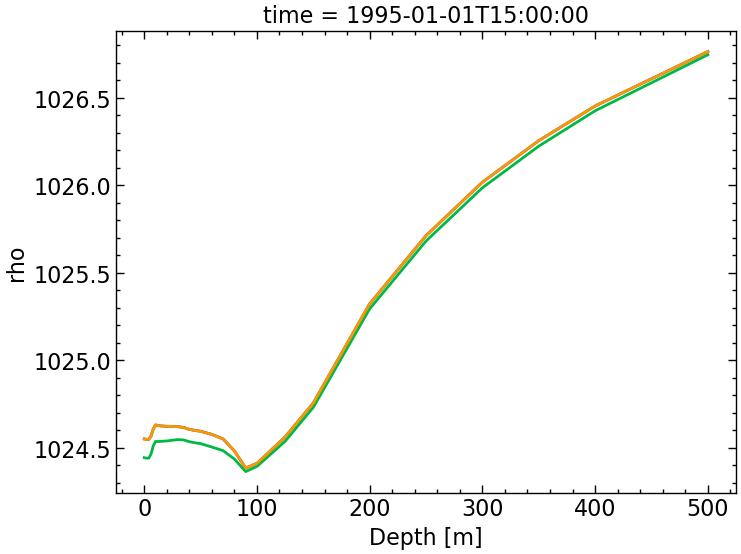

In [85]:
sigma_all_xr[365,:].plot()
r_all_xr['rho'][365,:].plot()
(rho_hycom_S['rho'][365,:]+rho_hycom_T['rho'][365,:]-rho_hycom_TS['rho'][365,:]).plot()

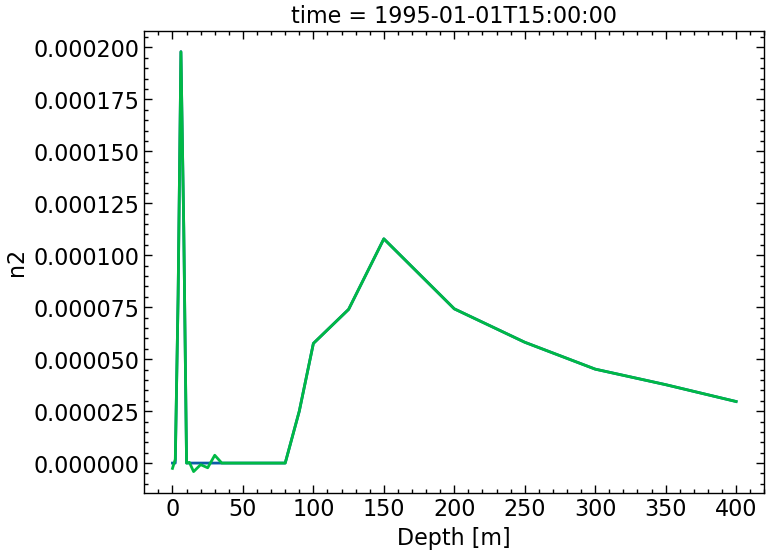

In [86]:
(n2_hycom['n2'][365,:]).plot()
(n2_hycom_t['n2'][365,:]+n2_hycom_s['n2'][365,:]-n2_hycom_ts['n2'][365,:]).plot()

In [87]:
### Compute the N2 below MLD
n2_pyc=[];n2_t_pyc=[];n2_s_pyc=[];n2_ts_pyc=[];
for i in tqdm(range(t_all_xr['water_temp'].values.shape[0])):
    dd = np.where(t_all_xr['water_temp'].depth.values>=df_mld['ts'][i])[0][:4]        
    n2_pyc.append(np.nanmean(n2_hycom['n2'][i,dd]))
    n2_t_pyc.append(np.nanmean(n2_hycom_t['n2'][i,dd]))
    n2_s_pyc.append(np.nanmean(n2_hycom_s['n2'][i,dd]))
    n2_ts_pyc.append(np.nanmean(n2_hycom_ts['n2'][i,dd]))

  0%|          | 0/8035 [00:00<?, ?it/s]

In [88]:
t_all_xr['water_temp'].depth.values

array([  0.,   2.,   4.,   6.,   8.,  10.,  12.,  15.,  20.,  25.,  30.,
        35.,  40.,  45.,  50.,  60.,  70.,  80.,  90., 100., 125., 150.,
       200., 250., 300., 350., 400., 500.])

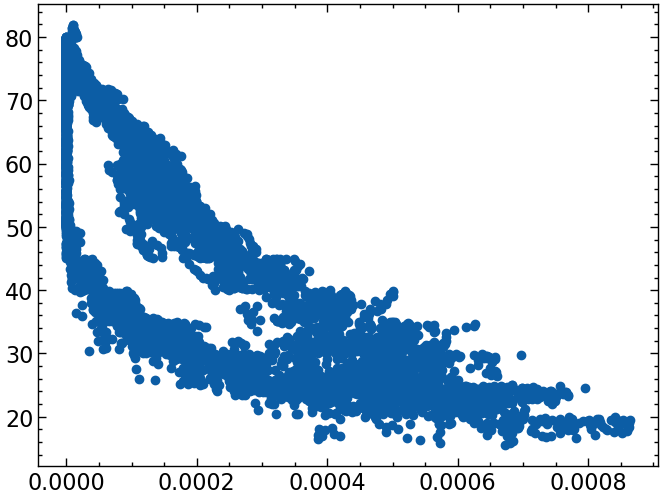

In [89]:
plt.scatter(np.array(n2_pyc),df_mld['ts'])

In [90]:
df111_N_pyc,df_N_pyc     = stat_all2(np.sqrt(np.array(n2_pyc)))
df111_N_t_pyc,df_N_t_pyc = stat_all2(np.sqrt(np.array(n2_t_pyc)))
df111_N_s_pyc,df_N_s_pyc = stat_all2(np.sqrt(np.array(n2_s_pyc)))
df111_N_ts_pyc,df_N_ts_pyc = stat_all2(np.sqrt(np.array(n2_ts_pyc)))

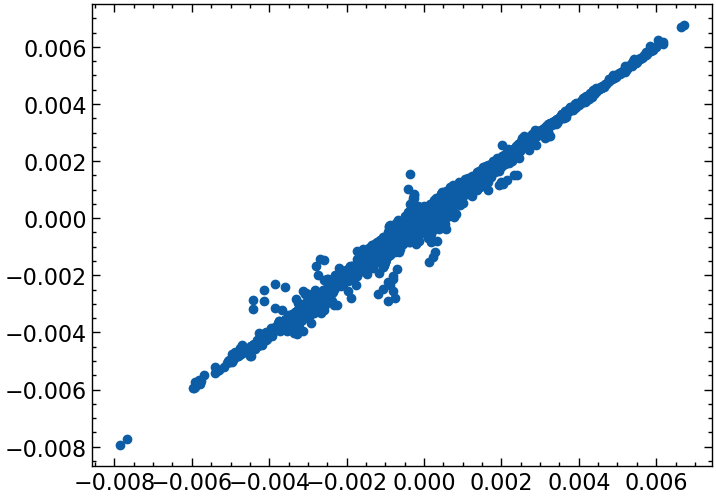

In [91]:
plt.scatter(df_N_pyc['ts']-df_N_pyc['seas'],(df_N_s_pyc['ts']-df_N_s_pyc['seas']+df_N_t_pyc['ts']-df_N_t_pyc['seas']-df_N_ts_pyc['ts']+df_N_ts_pyc['seas']))

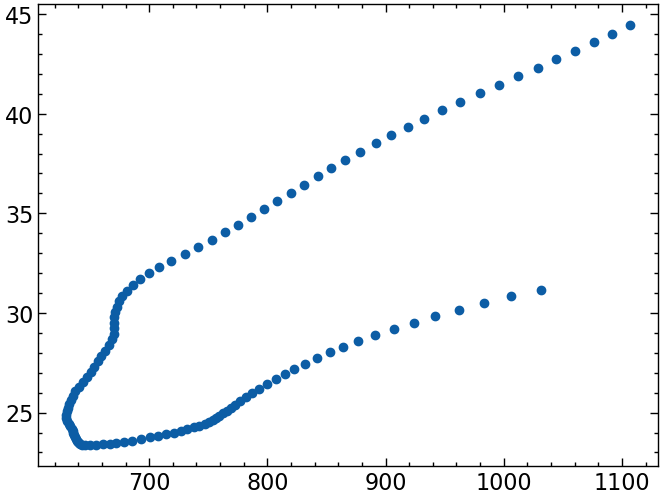

In [92]:
########## Fitting h = m(ustar/N)+c  ###############################################
N_clim_jjas= df_N_pyc['seas'][151:273].values
u_star_clim_jjas = df_ustar['seas'][151:273].values
scaling_param_jjas = (u_star_clim_jjas/N_clim_jjas)
mld_clim_jjas = df_mld['seas'][151:273].values
plt.scatter(scaling_param_jjas,mld_clim_jjas)

<Figure size 4000x1000 with 0 Axes>

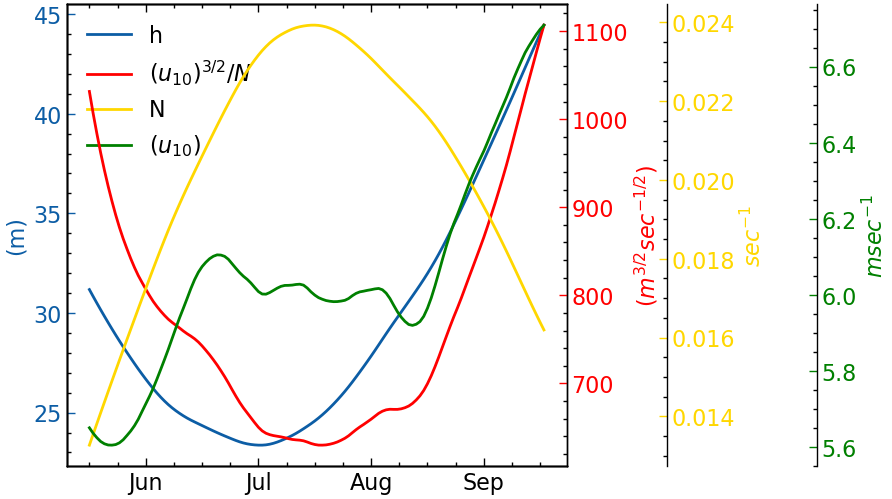

In [93]:
#####################################################################################
import matplotlib.pyplot as plt
plt.figure(figsize=(40,10))
fig, ax = plt.subplots()
fig.subplots_adjust(right=0.75)

twin1 = ax.twinx()
twin2 = ax.twinx()
twin3 = ax.twinx()
# Offset the right spine of twin2.  The ticks and label have already been
# placed on the right by twinx above.
twin2.spines.right.set_position(("axes", 1.2))
twin3.spines.right.set_position(("axes", 1.5))

p1, = ax.plot(df_N_pyc['seas'][151:273].index,mld_clim_jjas, "C0", label="h")
p2, = twin1.plot(df_N_pyc['seas'][151:273].index,scaling_param_jjas, "r", label="$(u_{10})^{3/2}/N$")
p3, = twin2.plot(df_N_pyc['seas'][151:273].index,N_clim_jjas, "gold", label="N")
p4, = twin3.plot(df_N_pyc['seas'][151:273].index,df_wspd['seas'][151:273], "green", label="$(u_{10})$")

fmt = mdates.DateFormatter('%-b')
ax.set_xticks(df_N_pyc['seas'][151:273].index[15::30])
ax.xaxis.set_major_formatter(fmt)

# ax.set(xlim=(0, 2), ylim=(0, 2), xlabel="Distance", ylabel="Density")
# twin1.set(ylim=(0, 4), ylabel="Temperature")
# twin2.set(ylim=(1, 65), ylabel="Velocity")

ax.yaxis.label.set_color(p1.get_color())
twin1.yaxis.label.set_color(p2.get_color())
twin2.yaxis.label.set_color(p3.get_color())
twin3.yaxis.label.set_color(p4.get_color())

ax.tick_params(axis='y', colors=p1.get_color())
twin1.tick_params(axis='y', colors=p2.get_color())
twin2.tick_params(axis='y', colors=p3.get_color())
twin3.tick_params(axis='y', colors=p4.get_color())

ax.set_ylabel("(m)",color=p1.get_color())
twin1.set_ylabel("($m^{3/2}sec^{-1/2}$)",color=p2.get_color())
twin2.set_ylabel("$sec^{-1}$",color=p3.get_color())
twin3.set_ylabel("$m sec^{-1}$",color=p4.get_color())

# twin1.tick_params(axis='y', colors=p2.get_color())
# twin2.tick_params(axis='y', colors=p3.get_color())
# twin3.tick_params(axis='y', colors=p4.get_color())


ax.legend(handles=[p1, p2, p3,p4])



<AxesSubplot:>

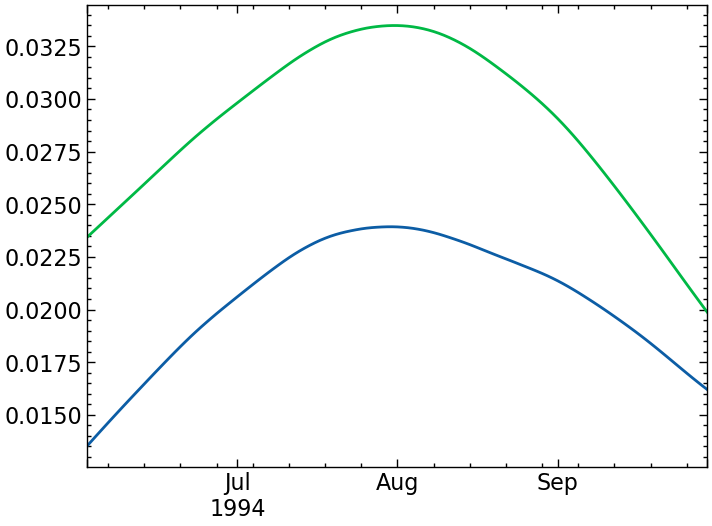

In [94]:
df_N_pyc['seas'][152:273].plot()
df_N['seas'][152:273].plot()

## Climatology Plot

/home/cccr/roxy/panini/anaconda3/envs/jgrjdm1/lib/python3.10/site-packages/marineHeatWaves-0.28-py3.10.egg/marineHeatWaves.py:358: RuntimeWarning: divide by zero encountered in true_divide


(0.0, 50.0)

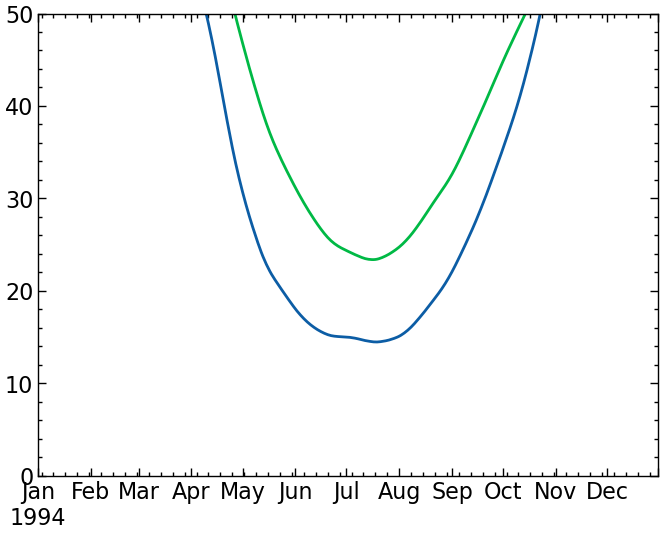

In [95]:
## MLD calculation### Calculated MLD is not convincing #######################
new_mld1=[]
new_mld2=[]
for i in range(clim_r_all_xr.values.shape[0]):
    den1 = r_all_xr['rho'][i,:20].values.squeeze()
    den2 = sigma_all_xr[i,:20].values.squeeze()
    
    new_den = gsw.sigma0(s_all_xr['salinity'].values[i,0],t_all_xr['water_temp'].values[i,0]-2)+1000
    if len(np.where((den1-new_den)>0.0)[0])>0:
        new_mld1.append(r_all_xr['rho'][i,:].depth.values[np.where((den1-new_den)>0.0)[0][0]])
        new_mld2.append(r_all_xr['rho'][i,:].depth.values[np.where((den2-new_den)>0.0)[0][0]])
    else:
        new_mld1.append(60)
        new_mld2.append(60)
plt.scatter(np.array(new_mld2),df_mld['ts'])
df111_mld_new,df_mld_new = stat_all2(np.array(new_mld1),cs=1) ### HYCOM MLD                          *** MLD COLD SPELL***
df_mld_new['seas'][0:365].plot()
df_mld['seas'][0:365].plot()
plt.ylim(0,50)


## Supplementary Plot ###

In [96]:
dr_clim = np.diff(clim_r_all_xr.values,axis=1,append=np.nan);
dz_clim = np.diff(np.abs(clim_r_all_xr.depth.values),append=np.nan)
n2_clim = (9.8/1029)*(dr_clim/dz_clim)
n2_clim_hycom = xr.Dataset({'n2': (('time','depth' ), n2_clim)}, coords={'time': clim_r_all_xr.time,'depth':clim_r_all_xr.depth})


In [97]:
n2_clim_hycom

<xarray.Dataset>
Dimensions:  (time: 8035, depth: 28)
Coordinates:
  * time     (time) datetime64[ns] 1994-01-01T15:00:00 ... 2015-12-31
  * depth    (depth) float64 0.0 2.0 4.0 6.0 8.0 ... 300.0 350.0 400.0 500.0
Data variables:
    n2       (time, depth) float64 7.072e-06 -1.228e-06 ... 3.052e-05 nan

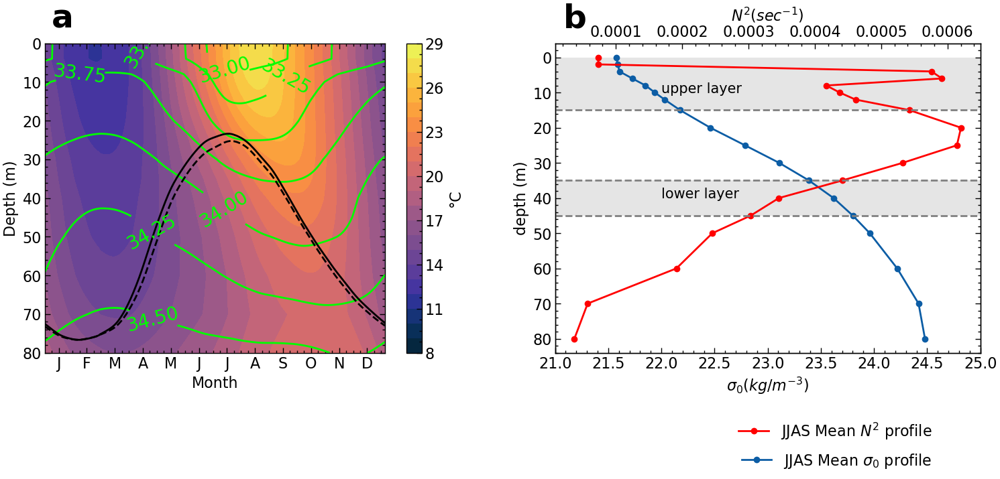

In [98]:
import cmocean
fig,ax = plt.subplots(1,2,figsize=(18,6))
m=ax[0].contourf(np.arange(0,365),clim_t_all_xr[0:365,:18].depth.values,clim_t_all_xr[0:365,:18].T,levels=np.arange(8,30,1),cmap=cmocean.cm.thermal)
cs=ax[0].contour(np.arange(0,365),clim_t_all_xr[0:365,:18].depth.values,clim_s_all_xr[0:365,:18].T,colors='lime',)
ax[0].set_xticks(np.arange(15,385,30),[date.fromordinal(i).strftime('%b')[0] for i in np.arange(15,385,30)])
ax[0].clabel(cs, inline=True,fontsize=20)
ax[0].invert_yaxis()
ax[0].set_ylabel('Depth (m)')
ax[0].set_xlabel('Month')
ax[0].plot(np.arange(0,365),df_mld['seas'][:365],'k',label='MLD dens criteria')
ax[0].plot(np.arange(0,365),df_mlt['seas'][:365],'k',linestyle='--',label='MLD T criteria')
ax[0].text(0.02, 1.05, string.ascii_lowercase[0], transform=ax[0].transAxes,size=35, weight='bold')

plt.colorbar(m,ax=ax[0],label='°C')
###################################
ax[1].plot(clim_r_all_xr[151:273,:18].values.mean(0)-1000,t_all_xr.depth.values[:18],'-o',label= r'JJAS Mean $\sigma_0$ profile')
ax[1].invert_yaxis()
ax2=ax[1].twiny()
ax2.plot(n2_clim_hycom['n2'][151:273,:18].values.mean(0),n2_clim_hycom['n2'].depth.values[:18],'-o',label='JJAS Mean $N^2$ profile',color='r')
ax2.axhline(15,linestyle='--',color='grey')
ax[1].fill_between(np.arange(21,26,1), 0, 15, facecolor='grey',alpha=0.2)
ax[1].fill_between(np.arange(21,26,1), 35, 45, facecolor='grey',alpha=0.2)

ax[1].set_xlim(21,25)

ax2.axhline(35,linestyle='--',color='grey')
ax2.axhline(45,linestyle='--',color='grey')
ax[1].text(22,10,'upper layer',fontsize=15)
ax[1].text(22,40,'lower layer',fontsize=15)

ax[1].set_xlabel('$\sigma_0$($kg/m^{-3}$)')
ax2.set_xlabel('$N^2$($sec^{-1})$')
ax[1].set_ylabel('depth (m)')
ax[1].legend(bbox_to_anchor=(0.9, -0.3), borderaxespad=0)
ax2.legend(bbox_to_anchor=(0.9, -0.2), borderaxespad=0)
ax[1].text(0.02, 1.05, string.ascii_lowercase[1], transform=ax[1].transAxes,size=35, weight='bold')
plt.savefig('jgrjdm_supplementary1.png',bbox_inches='tight')
